In [ ]:
# Install PyTorch, Torchvision, and relevant CV tools
!pip install -q torch torchvision torchaudio
!pip install -q opencv-python
!pip install -q matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 101.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 112.2 MB/s eta 0:00:00


In [ ]:
import torch
import torchvision
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.transforms import functional as F

import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q "/content/drive/MyDrive/wlasl videos.zip" -d "/content/wlasl_videos/"

In [ ]:
sampled_data = {
    "book": ["/content/wlasl_videos/12345.mp4", ...],
    "hello": ["/content/wlasl_videos/abcde.mp4", ...],
}

In [ ]:
import os
import cv2

# Output folder for extracted frames
output_root = "/content/wlasl_frames/"
os.makedirs(output_root, exist_ok=True)

def extract_frames_from_video(video_path, output_folder, max_frames=5):
    cap = cv2.VideoCapture(video_path)
    count = 0
    saved = 0
    while cap.isOpened() and saved < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        if count % 3 == 0:  # sample every 3rd frame
            frame_path = os.path.join(output_folder, f"frame_{saved:03d}.jpg")
            cv2.imwrite(frame_path, frame)
            saved += 1
        count += 1
    cap.release()


 Get All Available Video Paths

In [ ]:
import glob

video_dir = "/content/wlasl_videos/"
video_paths = glob.glob(os.path.join(video_dir, "*.mp4"))
print(f"Found {len(video_paths)} videos.")

Found 11980 videos.


create a dummy sampled_data dictionary just to proceed with frame extraction:

In [ ]:
from collections import defaultdict

sampled_data = defaultdict(list)

# 50 classes × 20 videos = 1000 videos
for i, vid_path in enumerate(video_paths[:1000]):
    class_id = f"class_{i // 20}"  # Every 20 videos = 1 new class
    sampled_data[class_id].append(vid_path)


re-run the frame extraction step:

In [ ]:
for gloss, videos in sampled_data.items():
    gloss_dir = os.path.join(output_root, gloss)
    os.makedirs(gloss_dir, exist_ok=True)

    for vid_path in videos:
        vid_name = os.path.splitext(os.path.basename(vid_path))[0]
        vid_output_dir = os.path.join(gloss_dir, vid_name)
        os.makedirs(vid_output_dir, exist_ok=True)

        extract_frames_from_video(vid_path, vid_output_dir, max_frames=5)


Map each video_id (e.g., 12345) back to its corresponding "gloss" (e.g., "thank you").

In [ ]:
import json

# Load WLASL metadata
with open('/content/drive/MyDrive/WLASL_v0.3.json', 'r') as f:
    wlasl_data = json.load(f)

# Build a mapping: video_id → gloss
videoid_to_gloss = {}
for entry in wlasl_data:
    gloss = entry["gloss"]
    for inst in entry["instances"]:
        videoid_to_gloss[inst["video_id"]] = gloss


In [ ]:
from collections import defaultdict
import os

sampled_data = defaultdict(list)

# Create label → video_path mapping using actual glosses
for vid_path in video_paths[:1000]:
    vid_id = os.path.splitext(os.path.basename(vid_path))[0]
    gloss = videoid_to_gloss.get(vid_id)

    if gloss:
        sampled_data[gloss].append(vid_path)


In [ ]:
# View a few glosses and their video paths
for i, (gloss, vids) in enumerate(sampled_data.items()):
    print(f"{gloss}:")
    for v in vids[:3]:  # show first 3 videos per gloss
        print(f"  - {v}")
    print("------")
    if i == 4:  # stop after 5 glosses
        break


class_0:
  - /content/wlasl_videos/25648.mp4
  - /content/wlasl_videos/61997.mp4
  - /content/wlasl_videos/24548.mp4
------
class_1:
  - /content/wlasl_videos/53670.mp4
  - /content/wlasl_videos/26767.mp4
  - /content/wlasl_videos/40660.mp4
------
class_2:
  - /content/wlasl_videos/03000.mp4
  - /content/wlasl_videos/07301.mp4
  - /content/wlasl_videos/45481.mp4
------
class_3:
  - /content/wlasl_videos/50408.mp4
  - /content/wlasl_videos/11499.mp4
  - /content/wlasl_videos/43168.mp4
------
class_4:
  - /content/wlasl_videos/12408.mp4
  - /content/wlasl_videos/37613.mp4
  - /content/wlasl_videos/14188.mp4
------


In [ ]:
print(f"Total glosses selected: {len(sampled_data)}\n")

for gloss, vids in sampled_data.items():
    print(f"{gloss}: {len(vids)} videos")


Total glosses selected: 50

class_0: 20 videos
class_1: 20 videos
class_2: 20 videos
class_3: 20 videos
class_4: 20 videos
class_5: 20 videos
class_6: 20 videos
class_7: 20 videos
class_8: 20 videos
class_9: 20 videos
class_10: 20 videos
class_11: 20 videos
class_12: 20 videos
class_13: 20 videos
class_14: 20 videos
class_15: 20 videos
class_16: 20 videos
class_17: 20 videos
class_18: 20 videos
class_19: 20 videos
class_20: 20 videos
class_21: 20 videos
class_22: 20 videos
class_23: 20 videos
class_24: 20 videos
class_25: 20 videos
class_26: 20 videos
class_27: 20 videos
class_28: 20 videos
class_29: 20 videos
class_30: 20 videos
class_31: 20 videos
class_32: 20 videos
class_33: 20 videos
class_34: 20 videos
class_35: 20 videos
class_36: 20 videos
class_37: 20 videos
class_38: 20 videos
class_39: 20 videos
class_40: 20 videos
class_41: 20 videos
class_42: 20 videos
class_43: 20 videos
class_44: 20 videos
class_45: 20 videos
class_46: 20 videos
class_47: 20 videos
class_48: 20 videos
cl

Replacing pseudo-labels with real glosses using the metadata from the WLASL JSON file.

Load JSON and Create Mapping



In [ ]:
import json

# Load JSON metadata
with open('/content//drive/MyDrive/WLASL_v0.3.json', 'r') as f:
    wlasl_data = json.load(f)

# Build a dictionary: video_id → gloss
videoid_to_gloss = {}
for entry in wlasl_data:
    gloss = entry['gloss']
    for instance in entry['instances']:
        videoid_to_gloss[instance['video_id']] = gloss


Use This Mapping to Build sampled_data

In [ ]:
from collections import defaultdict
import os

sampled_data = defaultdict(list)

# Limit: 50 glosses, 20 videos each
desired_classes = {}
for vid_path in video_paths:
    vid_id = os.path.splitext(os.path.basename(vid_path))[0]
    gloss = videoid_to_gloss.get(vid_id)

    if not gloss:
        continue

    # Keep only up to 20 videos per gloss, and only 50 glosses total
    if gloss not in desired_classes:
        if len(desired_classes) >= 50:
            continue
        desired_classes[gloss] = 0

    if desired_classes[gloss] < 20:
        sampled_data[gloss].append(vid_path)
        desired_classes[gloss] += 1


Preview Real Gloss Labels like in the WLASL json file

In [ ]:
# Show first 5 glosses and 3 video paths each
for i, (gloss, vids) in enumerate(sampled_data.items()):
    print(f"{gloss}:")
    for v in vids[:3]:
        print(f"  - {v}")
    print("------")
    if i == 4:
        break


greece:
  - /content/wlasl_videos/25648.mp4
  - /content/wlasl_videos/25647.mp4
  - /content/wlasl_videos/65853.mp4
------
vote:
  - /content/wlasl_videos/61997.mp4
  - /content/wlasl_videos/62003.mp4
  - /content/wlasl_videos/61996.mp4
------
gift:
  - /content/wlasl_videos/24548.mp4
  - /content/wlasl_videos/24553.mp4
  - /content/wlasl_videos/24547.mp4
------
take:
  - /content/wlasl_videos/56705.mp4
  - /content/wlasl_videos/69500.mp4
  - /content/wlasl_videos/56693.mp4
------
argue:
  - /content/wlasl_videos/03274.mp4
  - /content/wlasl_videos/03277.mp4
  - /content/wlasl_videos/03273.mp4
------


In [ ]:
# Total number of glosses
print(f"\n✅ Total glosses selected: {len(sampled_data)}")

# Gloss-wise video counts
print("\n🎯 Gloss-wise video counts:")
for gloss, vids in sampled_data.items():
    print(f"{gloss:20s}: {len(vids)} videos")



✅ Total glosses selected: 50

🎯 Gloss-wise video counts:
greece              : 7 videos
vote                : 8 videos
gift                : 4 videos
take                : 11 videos
argue               : 10 videos
turkey              : 7 videos
angry               : 7 videos
fall in love        : 5 videos
agree               : 5 videos
night               : 5 videos
tolerate            : 4 videos
hot dog             : 5 videos
negative            : 7 videos
gossip              : 6 videos
father              : 7 videos
bike                : 4 videos
thursday            : 11 videos
monday              : 6 videos
slow                : 8 videos
program             : 6 videos
specific            : 6 videos
have                : 6 videos
owl                 : 5 videos
bed                 : 13 videos
detective           : 3 videos
forget              : 7 videos
bank                : 3 videos
always              : 7 videos
trip                : 5 videos
honest              : 5 videos
cold    

Since some glosses have less than 10 videos each, picking glosses which have more than 10 videos

In [ ]:
filtered_data = {g: v for g, v in sampled_data.items() if len(v) >= 10}
print(f"Filtered glosses with ≥10 videos: {len(filtered_data)}")

for gloss, vids in filtered_data.items():
    print(f"{gloss:20s}: {len(vids)} videos")


Filtered glosses with ≥10 videos: 9
take                : 11 videos
argue               : 10 videos
thursday            : 11 videos
bed                 : 13 videos
cold                : 12 videos
bar                 : 11 videos
apple               : 11 videos
hot                 : 10 videos
thanksgiving        : 13 videos


In [ ]:
# Glosses already selected (with ≥10 videos)
strong_glosses = set(filtered_data.keys())

# Remaining glosses in the original 50-gloss pool
remaining_glosses = [g for g in sampled_data if g not in strong_glosses]


In [ ]:
import random

# Shuffle and pick 41 more glosses
random.seed(42)  # for reproducibility
additional_glosses = random.sample(remaining_glosses, 41)


In [ ]:
final_data = dict(filtered_data)  # start with the 9 strong glosses

# Add the 41 additional glosses (from sampled_data)
for gloss in additional_glosses:
    final_data[gloss] = sampled_data[gloss]


In [ ]:
print(f"\n✅ Final total glosses: {len(final_data)}\n")
for gloss, vids in final_data.items():
    print(f"{gloss:20s}: {len(vids)} videos")



✅ Final total glosses: 50

take                : 11 videos
argue               : 10 videos
thursday            : 11 videos
bed                 : 13 videos
cold                : 12 videos
bar                 : 11 videos
apple               : 11 videos
hot                 : 10 videos
thanksgiving        : 13 videos
constitution        : 6 videos
night               : 5 videos
vote                : 8 videos
specific            : 6 videos
slow                : 8 videos
monday              : 6 videos
tolerate            : 4 videos
agree               : 5 videos
fall in love        : 5 videos
cemetery            : 6 videos
crab                : 6 videos
greece              : 7 videos
gift                : 4 videos
paragraph           : 5 videos
eternity            : 5 videos
program             : 6 videos
owl                 : 5 videos
concern             : 5 videos
concept             : 4 videos
jealous             : 8 videos
detective           : 3 videos
bank                : 3 videos
bi

 Frame Extraction Code for All 50 Glosses

In [ ]:
output_root = "/content/wlasl_frames_final/"

def extract_frames_from_video(video_path, output_folder, max_frames=5):
    cap = cv2.VideoCapture(video_path)
    count = 0
    saved = 0
    while cap.isOpened() and saved < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        if count % 3 == 0:
            frame_path = os.path.join(output_folder, f"frame_{saved:03d}.jpg")
            cv2.imwrite(frame_path, frame)
            saved += 1
        count += 1
    cap.release()

# Extract frames for each gloss and video
for gloss, videos in final_data.items():
    gloss_dir = os.path.join(output_root, gloss)
    os.makedirs(gloss_dir, exist_ok=True)

    for vid_path in videos:
        vid_name = os.path.splitext(os.path.basename(vid_path))[0]
        vid_output_dir = os.path.join(gloss_dir, vid_name)
        os.makedirs(vid_output_dir, exist_ok=True)

        extract_frames_from_video(vid_path, vid_output_dir, max_frames=5)


In [ ]:
drive_output_root = "/content/drive/MyDrive/WLASL_Frames_Final/"


Download and Unzip EgoHands

In [ ]:
!wget http://vision.soic.indiana.edu/egohands_files/egohands_data.zip
!unzip -q egohands_data.zip -d egohands_data

--2025-05-01 23:25:49--  http://vision.soic.indiana.edu/egohands_files/egohands_data.zip
Resolving vision.soic.indiana.edu (vision.soic.indiana.edu)... 156.56.83.26
Connecting to vision.soic.indiana.edu (vision.soic.indiana.edu)|156.56.83.26|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1332784625 (1.2G) [application/zip]
Saving to: ‘egohands_data.zip’

egohands_data.zip   100%[===================>]   1.24G   116MB/s    in 11s     

2025-05-01 23:26:00 (120 MB/s) - ‘egohands_data.zip’ saved [1332784625/1332784625]



In [ ]:
import os

for root, dirs, files in os.walk("/content"):
    if "polygons.mat" in files:
        print(f"Found 'polygons.mat' in: {root}")


Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/CARDS_COURTYARD_S_H
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/CHESS_LIVINGROOM_B_S
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/JENGA_COURTYARD_H_B
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/JENGA_COURTYARD_S_T
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/PUZZLE_OFFICE_S_T
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/CARDS_LIVINGROOM_H_S
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/PUZZLE_COURTYARD_T_H
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/CARDS_OFFICE_T_H
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/PUZZLE_COURTYARD_H_T
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/CARDS_COURTYARD_B_T
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_SAMPLES/CARDS_OFFICE_H_T
Found 'polygons.mat' in: /content/egohands_data/_LABELLED_

diagnostic code to explore the structure inside polygons.mat:

In [ ]:
import scipy.io

mat_path = "/content/egohands_data/_LABELLED_SAMPLES/JENGA_COURTYARD_B_H/polygons.mat"
mat = scipy.io.loadmat(mat_path)

# List top-level keys
print("Top-level keys in the .mat file:")
print(mat.keys())

# Check structure under 'polygons'
polygons = mat.get("polygons")
print("\nType of 'polygons':", type(polygons))
print("Shape of 'polygons':", polygons.shape)

# Inspect one entry
print("\nExample entry structure:")
sample = polygons[0][0]
print(type(sample))
print(sample)


Top-level keys in the .mat file:
dict_keys(['__header__', '__version__', '__globals__', 'polygons'])

Type of 'polygons': <class 'numpy.ndarray'>
Shape of 'polygons': (1, 100)

Example entry structure:
<class 'numpy.void'>
(array([], shape=(1, 0), dtype=float64), array([], shape=(1, 0), dtype=float64), array([[705.83642691, 351.09551431],
       [706.82637278, 351.09551431],
       [707.81631864, 351.09551431],
       [711.77610209, 356.04524362],
       [715.73588554, 357.03518948],
       [717.71577726, 360.00502707],
       [719.69566899, 362.97486466],
       [721.67556071, 363.96481052],
       [722.66550657, 365.94470224],
       [723.65545244, 365.94470224],
       [724.6453983 , 368.91453983],
       [724.6453983 , 369.90448569],
       [725.63534416, 370.89443155],
       [726.62529002, 371.88437742],
       [727.61523589, 371.88437742],
       [729.59512761, 373.86426914],
       [729.59512761, 375.84416087],
       [732.5649652 , 378.81399845],
       [732.5649652 , 379.8039

Visualize a Single Scene (Now with Correct Path)

Preview an annotated image with hand masks:

In [ ]:
import os
import cv2
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from PIL import Image

# Scene to test
scene_path = "/content/egohands_data/_LABELLED_SAMPLES/JENGA_COURTYARD_B_H"
frame_dir = os.path.join(scene_path, "frames")
mat_path = os.path.join(scene_path, "polygons.mat")

# Load polygon annotations
mat = scipy.io.loadmat(mat_path)
polygons = mat["polygons"][0]

# Pick a valid polygon frame
for i, entry in enumerate(polygons):
    hand_poly = entry[2]  # 3rd element = hand polygon
    if hand_poly.size == 0:
        continue

    # Get corresponding image name
    img_name = f"frame_{i+1:04d}.jpg"
    img_path = os.path.join(frame_dir, img_name)

    if not os.path.exists(img_path):
        continue

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    poly = np.array(hand_poly, dtype=np.int32)
    cv2.fillPoly(mask, [poly], 1)

    # Show original and mask overlay
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title(f"Image: {img_name}")

    plt.subplot(1, 2, 2)
    plt.imshow(img_rgb)
    plt.imshow(mask, cmap='jet', alpha=0.4)
    plt.title("Hand Mask Overlay")
    plt.show()
    break


EgoHandsDataset for PyTorch

In [ ]:
import torch
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
from torchvision.ops import masks_to_boxes

class EgoHandsDataset(Dataset):
    def __init__(self, root_dir):
        self.samples = []
        self.root_dir = root_dir

        # Find all scenes
        self.scene_dirs = [
            os.path.join(root_dir, d) for d in os.listdir(root_dir)
            if os.path.isdir(os.path.join(root_dir, d))
        ]

        for scene_path in self.scene_dirs:
            mat_path = os.path.join(scene_path, "polygons.mat")
            frame_dir = os.path.join(scene_path, "frames")

            mat = scipy.io.loadmat(mat_path)
            polygons = mat["polygons"][0]

            for i, entry in enumerate(polygons):
                hand_poly = entry[2]
                if hand_poly.size == 0:
                    continue

                img_name = f"frame_{i+1:04d}.jpg"
                img_path = os.path.join(frame_dir, img_name)

                if os.path.exists(img_path):
                    self.samples.append((img_path, hand_poly))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, hand_poly = self.samples[idx]
        img = Image.open(img_path).convert("RGB")
        img_tensor = ToTensor()(img)

        height, width = img.size[1], img.size[0]

        mask = np.zeros((height, width), dtype=np.uint8)
        poly = np.array(hand_poly, dtype=np.int32)
        cv2.fillPoly(mask, [poly], 1)

        mask_tensor = torch.as_tensor(mask, dtype=torch.uint8).unsqueeze(0)
        boxes = masks_to_boxes(mask_tensor)
        labels = torch.ones((1,), dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "masks": mask_tensor,
            "image_id": torch.tensor([idx])
        }

        return img_tensor, target


In [ ]:
scene_root = "/content/egohands_data/_LABELLED_SAMPLES/"

scene_dirs = [
    os.path.join(scene_root, d)
    for d in os.listdir(scene_root)
    if os.path.isdir(os.path.join(scene_root, d))
]

print(f"📁 Found {len(scene_dirs)} scene folders")

# Peek into the first few scenes
for scene in scene_dirs[:3]:
    print(f"\n🔍 Checking scene: {scene}")
    mat_path = os.path.join(scene, "polygons.mat")
    frame_dir = os.path.join(scene, "frames")

    print(f"MAT exists? {'Yes' if os.path.exists(mat_path) else 'No'}")
    print(f"Frames dir exists? {'Yes' if os.path.exists(frame_dir) else 'No'}")

    mat = scipy.io.loadmat(mat_path)
    polygons = mat["polygons"][0]
    print(f"Frames with polygons: {len(polygons)}")

    # Check a few frame mappings
    for i, entry in enumerate(polygons[:5]):
        hand_poly = entry[2]
        img_name = f"frame_{i+1:04d}.jpg"
        img_path = os.path.join(frame_dir, img_name)
        print(f"  ➤ {img_name} | Exists: {os.path.exists(img_path)} | Mask size: {hand_poly.shape}")


📁 Found 48 scene folders

🔍 Checking scene: /content/egohands_data/_LABELLED_SAMPLES/CARDS_COURTYARD_S_H
MAT exists? Yes
Frames dir exists? No
Frames with polygons: 100
  ➤ frame_0001.jpg | Exists: False | Mask size: (221, 2)
  ➤ frame_0002.jpg | Exists: False | Mask size: (220, 2)
  ➤ frame_0003.jpg | Exists: False | Mask size: (190, 2)
  ➤ frame_0004.jpg | Exists: False | Mask size: (203, 2)
  ➤ frame_0005.jpg | Exists: False | Mask size: (208, 2)

🔍 Checking scene: /content/egohands_data/_LABELLED_SAMPLES/CHESS_LIVINGROOM_B_S
MAT exists? Yes
Frames dir exists? No
Frames with polygons: 100
  ➤ frame_0001.jpg | Exists: False | Mask size: (146, 2)
  ➤ frame_0002.jpg | Exists: False | Mask size: (140, 2)
  ➤ frame_0003.jpg | Exists: False | Mask size: (154, 2)
  ➤ frame_0004.jpg | Exists: False | Mask size: (175, 2)
  ➤ frame_0005.jpg | Exists: False | Mask size: (119, 2)

🔍 Checking scene: /content/egohands_data/_LABELLED_SAMPLES/JENGA_COURTYARD_H_B
MAT exists? Yes
Frames dir exists? N

In [ ]:
import os

sample_scene = "/content/egohands_data/_LABELLED_SAMPLES/JENGA_COURTYARD_B_H"
print("Scene contents:")
print(os.listdir(sample_scene))


Scene contents:
['frame_0865.jpg', 'frame_1292.jpg', 'frame_0297.jpg', 'frame_0582.jpg', 'frame_0783.jpg', 'frame_0267.jpg', 'frame_1206.jpg', 'frame_1734.jpg', 'frame_1291.jpg', 'frame_1388.jpg', 'frame_1162.jpg', 'frame_2394.jpg', 'frame_0592.jpg', 'frame_0523.jpg', 'frame_2431.jpg', 'frame_1472.jpg', 'frame_1627.jpg', 'frame_0250.jpg', 'frame_0662.jpg', 'frame_0044.jpg', 'frame_0487.jpg', 'frame_2652.jpg', 'frame_1485.jpg', 'frame_0934.jpg', 'frame_1691.jpg', 'frame_0773.jpg', 'frame_2425.jpg', 'frame_1842.jpg', 'frame_0583.jpg', 'frame_2556.jpg', 'frame_1195.jpg', 'frame_0010.jpg', 'frame_0033.jpg', 'frame_2010.jpg', 'frame_0887.jpg', 'frame_1565.jpg', 'polygons.mat', 'frame_0245.jpg', 'frame_1795.jpg', 'frame_0450.jpg', 'frame_0900.jpg', 'frame_0724.jpg', 'frame_1086.jpg', 'frame_0212.jpg', 'frame_0091.jpg', 'frame_2566.jpg', 'frame_2462.jpg', 'frame_1921.jpg', 'frame_1379.jpg', 'frame_0164.jpg', 'frame_2444.jpg', 'frame_0550.jpg', 'frame_0567.jpg', 'frame_0994.jpg', 'frame_0708.j

In [ ]:
class EgoHandsDataset(Dataset):
    def __init__(self, root_dir):
        self.samples = []
        self.root_dir = root_dir

        self.scene_dirs = [
            os.path.join(root_dir, d)
            for d in os.listdir(root_dir)
            if os.path.isdir(os.path.join(root_dir, d))
        ]

        for scene_path in self.scene_dirs:
            mat_path = os.path.join(scene_path, "polygons.mat")

            if not os.path.exists(mat_path):
                continue

            mat = scipy.io.loadmat(mat_path)
            polygons = mat["polygons"][0]

            for i, entry in enumerate(polygons):
                hand_poly = entry[2]
                if hand_poly.size == 0:
                    continue

                # Frame filename (frame_0001.jpg → frame_{i+1:04d}.jpg)
                img_name = f"frame_{i+1:04d}.jpg"
                img_path = os.path.join(scene_path, img_name)

                if os.path.exists(img_path):
                    self.samples.append((img_path, hand_poly))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, hand_poly = self.samples[idx]
        img = Image.open(img_path).convert("RGB")
        img_tensor = ToTensor()(img)

        width, height = img.size

        mask = np.zeros((height, width), dtype=np.uint8)
        poly = np.array(hand_poly, dtype=np.int32)
        cv2.fillPoly(mask, [poly], 1)

        mask_tensor = torch.as_tensor(mask, dtype=torch.uint8).unsqueeze(0)
        boxes = masks_to_boxes(mask_tensor)
        labels = torch.ones((1,), dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "masks": mask_tensor,
            "image_id": torch.tensor([idx])
        }

        return img_tensor, target


 Why You're Seeing 158 Samples from 48 Scenes

 EgoHands has 48 labeled scenes, but each scene contains 100 annotated frames, and not all frames have hand annotations.
 Each .mat file in a scene contains annotations for up to 100 frames.

We only add a frame to self.samples if:

if hand_poly.size != 0 and os.path.exists(img_path)

So:
Many frames were skipped (no mask or no matching image)

But some scenes contributed multiple annotated frames — especially ones like JENGA_COURTYARD_B_H

That's how you end up with 158 annotated image–mask pairs across the 48 scenes — not one per scene, but several per scene where annotations are valid and frames exist.

In [ ]:
dataset = EgoHandsDataset("/content/egohands_data/_LABELLED_SAMPLES/")
print(f"Total samples: {len(dataset)}")

img, target = dataset[0]
print("Image shape:", img.shape)
print("Mask shape:", target["masks"].shape)
print("Boxes:", target["boxes"])


Total samples: 158
Image shape: torch.Size([3, 720, 1280])
Mask shape: torch.Size([1, 720, 1280])
Boxes: tensor([[465.,  76., 635., 190.]])


 Basic Training Loop for 1–3 Epochscto train Mask R-CNN on EgoHands

In [ ]:
from torch.utils.data import DataLoader
from torchvision.models.detection import maskrcnn_resnet50_fpn
import torchvision
import torch

# Device config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dataset and loader
dataset = EgoHandsDataset("/content/egohands_data/_LABELLED_SAMPLES/")
data_loader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Load pre-trained Mask R-CNN
model = maskrcnn_resnet50_fpn(pretrained=True)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, 2)
model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
    model.roi_heads.mask_predictor.conv5_mask.in_channels,
    model.roi_heads.mask_predictor.conv5_mask.out_channels,
    2
)
model.to(device)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:00<00:00, 205MB/s]


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

Now Run 1–3 Epochs of Training

In [ ]:
import torch.optim as optim

# Optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

# Basic training loop
num_epochs = 3

model.train()
for epoch in range(num_epochs):
    epoch_loss = 0
    for images, targets in data_loader:
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        epoch_loss += losses.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {epoch_loss:.4f}")


Epoch [1/3] - Loss: 70.9221
Epoch [2/3] - Loss: 59.4658
Epoch [3/3] - Loss: 61.1734


 Create a Checkpoint Folder in Drive to save the results of training

In [ ]:
checkpoint_dir = "/content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/"
os.makedirs(checkpoint_dir, exist_ok=True)


In [ ]:
import torch.optim as optim

# Redefine dataset and loader to ensure everything is fresh
dataset = EgoHandsDataset("/content/egohands_data/_LABELLED_SAMPLES/")
data_loader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# Redefine model
model = maskrcnn_resnet50_fpn(pretrained=True)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, 2)
model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
    model.roi_heads.mask_predictor.conv5_mask.in_channels,
    model.roi_heads.mask_predictor.conv5_mask.out_channels,
    2
)
model.to(device)

# Optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

# Training
num_epochs = 10

model.train()
for epoch in range(num_epochs):
    epoch_loss = 0
    for images, targets in data_loader:
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        epoch_loss += losses.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    print(f"✅ Epoch [{epoch+1}/{num_epochs}] - Loss: {epoch_loss:.4f}")

    # Save checkpoint
    save_path = os.path.join(checkpoint_dir, f"maskrcnn_epoch{epoch+1}.pth")
    torch.save(model.state_dict(), save_path)
    print(f"📦 Saved checkpoint to: {save_path}")


✅ Epoch [1/10] - Loss: 73.4633
📦 Saved checkpoint to: /content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/maskrcnn_epoch1.pth
✅ Epoch [2/10] - Loss: 64.3448
📦 Saved checkpoint to: /content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/maskrcnn_epoch2.pth
✅ Epoch [3/10] - Loss: 64.8851
📦 Saved checkpoint to: /content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/maskrcnn_epoch3.pth
✅ Epoch [4/10] - Loss: 62.9754
📦 Saved checkpoint to: /content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/maskrcnn_epoch4.pth
✅ Epoch [5/10] - Loss: 63.3994
📦 Saved checkpoint to: /content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/maskrcnn_epoch5.pth
✅ Epoch [6/10] - Loss: 62.6330
📦 Saved checkpoint to: /content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/maskrcnn_epoch6.pth
✅ Epoch [7/10] - Loss: 59.8727
📦 Saved checkpoint to: /content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/maskrcnn_epoch7.pth
✅ Epoch [8/10] - Loss: 60.0430
📦 Saved checkpoint to: /content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/mask

Run Inference on One WLASL Frame


In [ ]:
test_frame_path = "/content/drive/MyDrive/WLASL_Frames_Final/apple/24547/frame_000.jpg"


In [ ]:
import torchvision
from torchvision.transforms import functional as F
import matplotlib.pyplot as plt

# Load model and checkpoint
model = maskrcnn_resnet50_fpn(pretrained=False)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, 2)
model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
    model.roi_heads.mask_predictor.conv5_mask.in_channels,
    model.roi_heads.mask_predictor.conv5_mask.out_channels,
    2
)
model.load_state_dict(torch.load("/content/drive/MyDrive/MaskRCNN_EgoHands_Checkpoints/maskrcnn_epoch10.pth"))
model.to(device)
model.eval()


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 186MB/s]


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu):

 Move wlasl_frames_final folder from \content to MyDrive

In [ ]:
!mv /content/wlasl_frames_final /content/drive/MyDrive/WLASL_Frames_Final


In [ ]:
import os

base_path = "/content/drive/MyDrive/WLASL_Frames_Final"
glosses = os.listdir(base_path)
print(f"Glosses found: {glosses[:5]}")


Glosses found: ['take', 'argue', 'thursday', 'bed', 'cold']


In [ ]:
video_folders = os.listdir(os.path.join(base_path, "take"))
print(f"\nVideos under 'take': {video_folders[:5]}")

video_folders = os.listdir(os.path.join(base_path, "bed"))
print(f"\nVideos under 'bed': {video_folders[:5]}")


Videos under 'take': ['56705', '69500', '56693', '56699', '56692']

Videos under 'bed': ['05638', '05636', '05634', '65163', '65162']


In [ ]:
frames = os.listdir(os.path.join(base_path, "take", "56705"))
print(f"\nFrames in take/56705/: {frames[:5]}")

frames = os.listdir(os.path.join(base_path, "bed", "65162"))
print(f"\nFrames in bed/65162/: {frames[:5]}")




Frames in take/56705/: ['frame_000.jpg', 'frame_001.jpg', 'frame_002.jpg', 'frame_003.jpg', 'frame_004.jpg']

Frames in bed/65162/: ['frame_000.jpg', 'frame_001.jpg', 'frame_002.jpg', 'frame_003.jpg', 'frame_004.jpg']


In [ ]:
# Load a WLASL frame and run inference
from PIL import Image
import cv2
import torch

# Example frame path (update this if needed)
test_frame_path = "/content/drive/MyDrive/WLASL_Frames_Final/take/56705/frame_001.jpg"

image = Image.open(test_frame_path).convert("RGB")
image_tensor = F.to_tensor(image).to(device)

with torch.no_grad():
    prediction = model([image_tensor])[0]


In [ ]:
print("Detected boxes:", prediction['boxes'])
print("Scores:", prediction['scores'])


Detected boxes: tensor([[339.0961, 159.6655, 616.2298, 356.2932],
        [428.7145, 190.6217, 557.3481, 336.4605],
        [391.8495, 154.1797, 520.0116, 331.3898],
        [439.0972, 247.3135, 593.5909, 353.0963],
        [374.1180, 166.7062, 469.5659, 233.1706],
        [454.3338, 285.4020, 559.7869, 355.3380],
        [369.1653, 166.7370, 479.2871, 285.0912],
        [444.6068, 281.9603, 612.9934, 380.6674],
        [471.0908, 204.7818, 589.9036, 387.0899],
        [389.2939, 156.5983, 488.9775, 212.8148],
        [380.2407, 254.4991, 620.2763, 393.0815],
        [303.8071,  73.1579, 488.8521, 182.2438],
        [282.5522, 146.6388, 545.8636, 317.5864],
        [365.0532, 142.1673, 474.8492, 189.7962],
        [458.9712, 231.6267, 531.8159, 365.6874],
        [366.6465,  66.9811, 490.2872, 256.5415],
        [502.0638, 304.1831, 590.7596, 357.3251],
        [348.2636,  76.5209, 577.4434, 306.2338],
        [408.4499, 165.7391, 491.8198, 250.2393],
        [359.1770, 165.0015, 418.2

 Test Cropping for One Gloss

In [ ]:
import os
from PIL import Image
from torchvision.transforms import functional as F

# Gloss to test
gloss = "take"
source_gloss_path = f"/content/drive/MyDrive/WLASL_Frames_Final/{gloss}/"
crop_output_dir = f"/content/drive/MyDrive/WLASL_Hand_Crops/{gloss}/"
os.makedirs(crop_output_dir, exist_ok=True)

model.eval()
frame_count = 0
crop_count = 0

for video_id in os.listdir(source_gloss_path):
    video_folder = os.path.join(source_gloss_path, video_id)
    if not os.path.isdir(video_folder):
        continue

    for frame_name in os.listdir(video_folder):
        if not frame_name.endswith(".jpg"):
            continue

        frame_path = os.path.join(video_folder, frame_name)
        image = Image.open(frame_path).convert("RGB")
        image_tensor = F.to_tensor(image).to(device)

        with torch.no_grad():
            prediction = model([image_tensor])[0]

        for i, (box, score) in enumerate(zip(prediction["boxes"], prediction["scores"])):
            if score > 0.2:
                x1, y1, x2, y2 = box.int().tolist()
                crop = image.crop((x1, y1, x2, y2))

                crop_filename = f"{video_id}_{frame_name[:-4]}_crop{i}.jpg"
                crop.save(os.path.join(crop_output_dir, crop_filename))
                crop_count += 1

        frame_count += 1

print(f"✅ Processed {frame_count} frames in gloss '{gloss}'")
print(f"✅ Saved {crop_count} cropped hand images to: {crop_output_dir}")


✅ Processed 55 frames in gloss 'take'
✅ Saved 272 cropped hand images to: /content/drive/MyDrive/WLASL_Hand_Crops/take/


Full Batch Script: All 50 Glosses

In [ ]:
# Path to root frame folder and output crop folder
frames_root = "/content/drive/MyDrive/WLASL_Frames_Final/"
crop_root = "/content/drive/MyDrive/WLASL_Hand_Crops/"
os.makedirs(crop_root, exist_ok=True)

model.eval()

for gloss in os.listdir(frames_root):
    gloss_path = os.path.join(frames_root, gloss)
    if not os.path.isdir(gloss_path):
        continue

    crop_output_dir = os.path.join(crop_root, gloss)
    os.makedirs(crop_output_dir, exist_ok=True)

    frame_count = 0
    crop_count = 0

    for video_id in os.listdir(gloss_path):
        video_folder = os.path.join(gloss_path, video_id)
        if not os.path.isdir(video_folder):
            continue

        for frame_name in os.listdir(video_folder):
            if not frame_name.endswith(".jpg"):
                continue

            frame_path = os.path.join(video_folder, frame_name)
            image = Image.open(frame_path).convert("RGB")
            image_tensor = F.to_tensor(image).to(device)

            with torch.no_grad():
                prediction = model([image_tensor])[0]

            for i, (box, score) in enumerate(zip(prediction["boxes"], prediction["scores"])):
                if score > 0.2:
                    x1, y1, x2, y2 = box.int().tolist()
                    crop = image.crop((x1, y1, x2, y2))

                    crop_filename = f"{video_id}_{frame_name[:-4]}_crop{i}.jpg"
                    crop.save(os.path.join(crop_output_dir, crop_filename))
                    crop_count += 1

            frame_count += 1

    print(f"✅ [{gloss}] Processed {frame_count} frames → {crop_count} cropped hands")


✅ [take] Processed 55 frames → 272 cropped hands
✅ [argue] Processed 50 frames → 237 cropped hands
✅ [thursday] Processed 55 frames → 313 cropped hands
✅ [bed] Processed 65 frames → 280 cropped hands
✅ [cold] Processed 60 frames → 252 cropped hands
✅ [bar] Processed 55 frames → 251 cropped hands
✅ [apple] Processed 55 frames → 280 cropped hands
✅ [hot] Processed 50 frames → 234 cropped hands
✅ [thanksgiving] Processed 65 frames → 292 cropped hands
✅ [constitution] Processed 30 frames → 127 cropped hands
✅ [night] Processed 25 frames → 139 cropped hands
✅ [vote] Processed 40 frames → 208 cropped hands
✅ [specific] Processed 30 frames → 122 cropped hands
✅ [slow] Processed 40 frames → 229 cropped hands
✅ [monday] Processed 30 frames → 158 cropped hands
✅ [tolerate] Processed 20 frames → 90 cropped hands
✅ [agree] Processed 25 frames → 82 cropped hands
✅ [fall in love] Processed 25 frames → 124 cropped hands
✅ [cemetery] Processed 30 frames → 146 cropped hands
✅ [crab] Processed 30 frames

Proceed with Mask R-CNN cropped images you already saved under /WLASL_Hand_Crops/
Use those to train your first gesture classifier (ResNet)



50 glosses (classes)

Cropped hand images as input

In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Path to cropped hand images
data_dir = "/content/drive/MyDrive/WLASL_Hand_Crops/"

# Define transforms
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

# Load dataset
full_dataset = datasets.ImageFolder(root=data_dir, transform=transform)

# Split train and val
from torch.utils.data import random_split
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_ds, val_ds = random_split(full_dataset, [train_size, val_size])

# Loaders
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32, shuffle=False)


In [ ]:
import torch.optim as optim

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Train loop
num_epochs = 5

for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    acc = 100 * correct / total
    print(f"✅ Epoch [{epoch+1}/{num_epochs}] - Loss: {total_loss:.4f} - Train Acc: {acc:.2f}%")


✅ Epoch [1/5] - Loss: 614.4422 - Train Acc: 17.46%
✅ Epoch [2/5] - Loss: 411.4031 - Train Acc: 42.29%
✅ Epoch [3/5] - Loss: 287.9151 - Train Acc: 59.49%
✅ Epoch [4/5] - Loss: 202.3436 - Train Acc: 72.21%
✅ Epoch [5/5] - Loss: 133.3372 - Train Acc: 83.48%


Full Training Loop with Early Stopping & Checkpointing

Code: Training With Validation and Save Best Model

let’s filter your existing Mask R-CNN crops to remove bad ones (e.g., faces, torsos), keeping only those that are likely to be hands.

In [ ]:
from PIL import Image
import os
from shutil import copy2

input_root = "/content/drive/MyDrive/WLASL_Hand_Crops/"
output_root = "/content/drive/MyDrive/WLASL_Hand_Crops_Filtered/"

os.makedirs(output_root, exist_ok=True)

kept = 0
removed = 0

for gloss in os.listdir(input_root):
    gloss_in = os.path.join(input_root, gloss)
    gloss_out = os.path.join(output_root, gloss)
    os.makedirs(gloss_out, exist_ok=True)

    for fname in os.listdir(gloss_in):
        if not fname.endswith(".jpg"):
            continue

        fpath = os.path.join(gloss_in, fname)
        try:
            img = Image.open(fpath)
            w, h = img.size

            aspect_ratio = w / h if h != 0 else 0
            if w >= 40 and h >= 40 and 0.5 <= aspect_ratio <= 2.0:
                copy2(fpath, os.path.join(gloss_out, fname))
                kept += 1
            else:
                removed += 1
        except:
            removed += 1

print(f"✅ Filter complete: Kept {kept} images, Removed {removed}")
print(f"Filtered dataset is in: {output_root}")


✅ Filter complete: Kept 5745 images, Removed 1852
Filtered dataset is in: /content/drive/MyDrive/WLASL_Hand_Crops_Filtered/


From above: Kept: 5,745 high-quality crops likely to contain actual hands

Removed: 1,852 low-quality or misleading images (e.g., faces, torsos)





In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

data_dir = "/content/drive/MyDrive/WLASL_Hand_Crops_Filtered/"

# Resize and normalize images
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

# Load dataset
full_dataset = datasets.ImageFolder(root=data_dir, transform=transform)

# Train/val split
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_ds, val_ds = random_split(full_dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32, shuffle=False)

# Get class names
class_names = full_dataset.classes
print(f"✅ Reloaded dataset with {len(full_dataset)} images and {len(class_names)} classes.")


✅ Reloaded dataset with 5745 images and 50 classes.


In [ ]:
import os
import random
import shutil
from pathlib import Path

source_root = "/content/drive/MyDrive/WLASL_Frames_Final/"
output_folder = "/content/wlasl_100_frames/"
os.makedirs(output_folder, exist_ok=True)

# Collect all frame paths
all_frame_paths = []
for gloss in os.listdir(source_root):
    gloss_path = os.path.join(source_root, gloss)
    if not os.path.isdir(gloss_path):
        continue

    for vid in os.listdir(gloss_path):
        vid_path = os.path.join(gloss_path, vid)
        if not os.path.isdir(vid_path):
            continue

        for fname in os.listdir(vid_path):
            if fname.endswith(".jpg"):
                fpath = os.path.join(vid_path, fname)
                all_frame_paths.append(fpath)

# Sample 100 randomly
sampled = random.sample(all_frame_paths, 100)

# Copy to output folder
for i, src in enumerate(sampled):
    dst = os.path.join(output_folder, f"frame_{i:03d}.jpg")
    shutil.copy(src, dst)

print(f"✅ Copied 100 frames to: {output_folder}")


✅ Copied 100 frames to: /content/wlasl_100_frames/


In [ ]:
shutil.make_archive("/content/wlasl_100_frames", 'zip', output_folder)


'/content/wlasl_100_frames.zip'

In [ ]:
from google.colab import files
files.download("/content/wlasl_100_frames.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Install COCO API (if not already)

In [ ]:
!pip install pycocotools

Define COCO-Compatible Dataset Class

In [ ]:
import os
import torch
import torchvision.transforms as T
from PIL import Image
from pycocotools.coco import COCO

class COCODetectionDataset(torch.utils.data.Dataset):
    def __init__(self, root, annotation_file, transforms=None):
        self.root = root
        self.coco = COCO(annotation_file)
        self.ids = list(self.coco.imgs.keys())
        self.transforms = transforms

    def __getitem__(self, idx):
        while True:
            img_id = self.ids[idx]
            ann_ids = self.coco.getAnnIds(imgIds=img_id)
            anns = self.coco.loadAnns(ann_ids)
            path = self.coco.loadImgs(img_id)[0]['file_name']

            img_path = os.path.join(self.root, path)
            img = Image.open(img_path).convert("RGB")

            if len(anns) == 0:
                # skip images with no annotations
                idx = (idx + 1) % len(self.ids)
                continue

            boxes = []
            labels = []
            for ann in anns:
                x, y, w, h = ann['bbox']
                boxes.append([x, y, x + w, y + h])
                labels.append(1)  # class index for 'hand'

            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)

            target = {
                "boxes": boxes,
                "labels": labels,
                "image_id": torch.tensor([img_id]),
            }

            if self.transforms:
                img = self.transforms(img)

            return img, target

    def __len__(self):
        return len(self.ids)


In [ ]:
import torchvision
import torch.nn as nn

# Load pre-trained model
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

# Update the box predictor for 2 classes: background + hand
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, 2)

# Remove mask head (optional, since you labeled boxes only)
model.roi_heads.mask_predictor = None

model = model.to(device)


Define Optimizer and Training Loop

In [ ]:
import torch.optim as optim

params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.Adam(params, lr=1e-4)

num_epochs = 5
model.train()

for epoch in range(num_epochs):
    total_loss = 0

    for images, targets in data_loader:
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        total_loss += losses.item()

    print(f"✅ Epoch [{epoch+1}/{num_epochs}] - Loss: {total_loss:.4f}")


✅ Epoch [1/5] - Loss: 3.0581
✅ Epoch [2/5] - Loss: 2.5133
✅ Epoch [3/5] - Loss: 2.3734
✅ Epoch [4/5] - Loss: 2.1035
✅ Epoch [5/5] - Loss: 1.8781


Save Your Trained Mask R-CNN Model

In [ ]:
save_path = "/content/drive/MyDrive/mask_rcnn_wlasl_hands.pth"
torch.save(model.state_dict(), save_path)
print(f"💾 Saved trained Mask R-CNN to: {save_path}")


💾 Saved trained Mask R-CNN to: /content/drive/MyDrive/mask_rcnn_wlasl_hands.pth


 Run Inference on One WLASL Frame and Visualize

In [ ]:
import os

frame_path = "/content/drive/MyDrive/WLASL_Frames_Final/take/56705/frame_000.jpg"
print("✅ File exists:" if os.path.exists(frame_path) else "❌ File not found")


✅ File exists:


In [ ]:
print("Detected boxes:", prediction['boxes'])
print("Scores:", prediction['scores'])


Detected boxes: tensor([], device='cuda:0', size=(0, 4))
Scores: tensor([], device='cuda:0')


In [ ]:
frames_dir = "/content/drive/MyDrive/WLASL_Frames_Final/agree/01575"
print(os.listdir(frames_dir)[:10])


['frame_000.jpg', 'frame_001.jpg', 'frame_002.jpg', 'frame_003.jpg', 'frame_004.jpg']


Your custom Mask R-CNN:

In [ ]:
torch.save(model.state_dict(), "/content/drive/MyDrive/mask_rcnn_wlasl_hands.pth")


Save Labeled Dataset (Already in Drive ✅) /MyDrive/wlasl_hand_dataset_roboflow_unzipped/

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


Retrain with your 50 gloss classes again (now that your dataset is clean), then save properly and visualize.



In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

# Define transform
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

data_dir = "/content/drive/MyDrive/WLASL_Hand_Crops_Filtered/"
full_dataset = datasets.ImageFolder(root=data_dir, transform=transform)
class_names = full_dataset.classes

# Split into train/val
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_ds, val_ds = random_split(full_dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32)


In [ ]:
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    gesture_model.train()
    total_loss = 0
    correct = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = gesture_model(images)
        loss = criterion(outputs, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()

    train_acc = 100 * correct / len(train_loader.dataset)
    train_losses.append(total_loss)

    # Validation
    gesture_model.eval()
    val_loss = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = gesture_model(images)
            val_loss += criterion(outputs, labels).item()

    val_losses.append(val_loss)

    print(f"✅ Epoch {epoch+1}/{num_epochs} - Loss: {total_loss:.4f} - Val Loss: {val_loss:.4f} - Acc: {train_acc:.2f}%")


✅ Epoch 1/10 - Loss: 7.9697 - Val Loss: 35.9165 - Acc: 99.59%
✅ Epoch 2/10 - Loss: 5.9649 - Val Loss: 36.9687 - Acc: 99.78%
✅ Epoch 3/10 - Loss: 5.2885 - Val Loss: 37.3693 - Acc: 99.78%
✅ Epoch 4/10 - Loss: 5.9490 - Val Loss: 36.4993 - Acc: 99.52%
✅ Epoch 5/10 - Loss: 3.7735 - Val Loss: 39.7047 - Acc: 99.87%
✅ Epoch 6/10 - Loss: 3.5546 - Val Loss: 38.6856 - Acc: 99.85%
✅ Epoch 7/10 - Loss: 4.7311 - Val Loss: 42.0595 - Acc: 99.59%
✅ Epoch 8/10 - Loss: 7.8724 - Val Loss: 43.4475 - Acc: 99.13%
✅ Epoch 9/10 - Loss: 14.7631 - Val Loss: 49.0664 - Acc: 97.54%
✅ Epoch 10/10 - Loss: 16.6438 - Val Loss: 45.1376 - Acc: 97.19%


In [ ]:
from sklearn.metrics import classification_report
import pandas as pd

report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
df_report = pd.DataFrame(report).transpose()
from IPython.display import display
display(df_report.round(3))


,precision,recall,f1-score,support
agree,0.500,0.750,0.600,8.000
always,0.650,0.520,0.578,25.000
angry,0.893,0.893,0.893,28.000
apple,0.812,0.765,0.788,51.000
argue,0.673,0.854,0.753,41.000
bank,0.667,0.500,0.571,8.000
bar,0.696,0.653,0.674,49.000
bed,0.586,0.829,0.687,41.000
bike,0.818,0.900,0.857,10.000
bottom,0.905,0.792,0.844,24.000


Colab Restoration Script

 wrapper function to process a single WLASL frame from start to finish:

In [ ]:
from PIL import Image
import torchvision.transforms as T
import cv2
from googletrans import Translator
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Define transform for classifier
classifier_transform = T.Compose([
    T.Resize((128, 128)),
    T.ToTensor()
])

# Define hand crop transform for detector input
detector_transform = T.Compose([
    T.Resize((512, 512)),
    T.ToTensor()
])

translator = Translator()

def detect_classify_translate(frame_path, show_plot=True, target_lang="es"):
    # Load and preprocess image
    img = cv2.imread(frame_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_tensor = detector_transform(Image.fromarray(img_rgb)).unsqueeze(0).to(device)

    # Run hand detection
    with torch.no_grad():
        prediction = detector_model(img_tensor)[0]

    boxes = prediction['boxes']
    scores = prediction['scores']

    # Filter valid boxes
    confident_boxes = [box for box, score in zip(boxes, scores) if score > 0.5]

    if not confident_boxes:
        print("❌ No hands detected.")
        return

    # Pick largest box (most likely main hand)
    selected_box = sorted(confident_boxes, key=lambda b: (b[2]-b[0]) * (b[3]-b[1]), reverse=True)[0]
    x1, y1, x2, y2 = [int(coord.item()) for coord in selected_box]
    hand_crop = img_rgb[y1:y2, x1:x2]

    # Resize and predict gloss
    hand_pil = Image.fromarray(hand_crop)
    input_tensor = classifier_transform(hand_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        output = gesture_model(input_tensor)
        pred_idx = torch.argmax(output, 1).item()
        pred_class = class_names[pred_idx]

    # Translate gloss
    translated = translator.translate(pred_class, src='en', dest=target_lang).text

    # Show result
    if show_plot:
        plt.imshow(hand_crop)
        plt.axis("off")
        plt.title(f"🧠 Pred: {pred_class}  🌐 {target_lang}: {translated}")
        plt.show()

    return {
        "predicted_gloss": pred_class,
        "translated_caption": translated,
        "bbox": (x1, y1, x2, y2)
    }


Restart:
Accurate hand detection in WLASL using Mask R-CNN pretrained on EgoHands and fine-tuned on your WLASL labels.

In [ ]:
import zipfile
import os

zip_path = "/content/drive/MyDrive/egohands_data.zip"
extract_path = "/content/drive/MyDrive/egohands_data"

# Extract if not already done
if not os.path.exists(extract_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("✅ Extracted to:", extract_path)
else:
    print("🔁 Already extracted at:", extract_path)


✅ Extracted to: /content/drive/MyDrive/egohands_data


In [ ]:
# Remove any stale folder
!rm -rf /content/_LABELLED_SAMPLES

# Unzip into /content/_LABELLED_SAMPLES
!unzip -q /content/egohands_data.zip -d /content/_LABELLED_SAMPLES


 your EgoHands ground-truth boxes overlaid correctly

Building COCO: 100%|██████████| 48/48 [00:02<00:00, 21.73it/s]


Wrote 169 images and 392 annotations to:
    /content/drive/MyDrive/egohands_data/egohands_coco


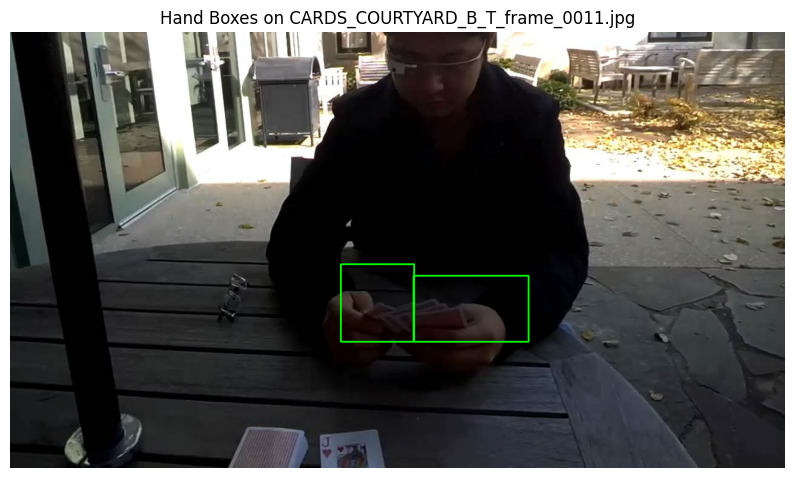

In [ ]:


# 3) Imports
import os, json, cv2, scipy.io
from tqdm import tqdm
import matplotlib.pyplot as plt

# 4) Paths
DATA_ROOT      = '/content/drive/MyDrive/egohands_data'
LABEL_ROOT     = '/content/_LABELLED_SAMPLES'   # <-- now correct!
COCO_ROOT      = os.path.join(DATA_ROOT, 'egohands_coco')
IMG_OUT        = os.path.join(COCO_ROOT, 'images')
ANNOT_OUT_PATH = os.path.join(COCO_ROOT, 'annotations.json')

# 5) Prepare output
os.makedirs(IMG_OUT, exist_ok=True)

# 6) Build empty COCO structure
coco   = {"images": [], "annotations": [], "categories":[{"id":1,"name":"hand"}]}
img_id = 1
ann_id = 1
MIN_VERTS = 20
AR_LOW,AR_HI = 0.5,2.0

# 7) Loop over scenes & frames
for scene in tqdm(sorted(os.listdir(LABEL_ROOT)), desc="Building COCO"):
    scene_dir = os.path.join(LABEL_ROOT, scene)
    mat_path  = os.path.join(scene_dir, 'polygons.mat')
    if not os.path.isfile(mat_path):
        continue
    mat      = scipy.io.loadmat(mat_path)
    polygons = mat['polygons'][0]
    for idx, entry in enumerate(polygons):
        fname = f'frame_{idx:04d}.jpg'
        src   = os.path.join(scene_dir, fname)
        if not os.path.isfile(src):
            continue
        img = cv2.imread(src)
        if img is None:
            continue
        h, w = img.shape[:2]
        dst_name = f"{scene}_{fname}"
        dst_path = os.path.join(IMG_OUT, dst_name)
        cv2.imwrite(dst_path, img)

        coco["images"].append({
            "id": img_id, "file_name": dst_name,
            "height": h,    "width": w
        })
        MIN_AREA = 0.01 * (h*w)

        # each sub-polygon = a hand
        for poly in entry:
            coords = poly
            if coords.ndim==3 and coords.shape[0]==1:
                coords = coords[0]
            if coords.ndim==2 and coords.shape[1]==2 and coords.shape[0]>=MIN_VERTS:
                xs, ys = coords[:,0], coords[:,1]
                xmin, ymin = float(xs.min()), float(ys.min())
                xmax, ymax = float(xs.max()), float(ys.max())
                bw, bh     = xmax-xmin, ymax-ymin
                area       = bw*bh
                ar         = bw/bh if bh>0 else 0
                if area>=MIN_AREA and AR_LOW<ar<AR_HI:
                    coco["annotations"].append({
                        "id":          ann_id,
                        "image_id":    img_id,
                        "category_id": 1,
                        "bbox":        [xmin, ymin, bw, bh],
                        "area":        area,
                        "iscrowd":     0
                    })
                    ann_id += 1

        img_id += 1

# 8) Write annotations.json into Drive
with open(ANNOT_OUT_PATH, 'w') as f:
    json.dump(coco, f, indent=2)

print(f"Wrote {len(coco['images'])} images and {len(coco['annotations'])} annotations to:")
print("   ", COCO_ROOT)

# 9) Visualize the very first sample
sample = coco["images"][0]["file_name"]
sid    = coco["images"][0]["id"]
bboxes = [ann["bbox"] for ann in coco["annotations"] if ann["image_id"]==sid]

img = cv2.imread(os.path.join(IMG_OUT, sample))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
for x,y,w,h in bboxes:
    cv2.rectangle(img,(int(x),int(y)),(int(x+w),int(y+h)),(0,255,0),2)

plt.figure(figsize=(10,6))
plt.imshow(img); plt.axis("off")
plt.title("Hand Boxes on "+sample)
plt.show()


Split into Train / Val
Let’s partition your 169 images, e.g., 80% train / 20% val:

In [ ]:
import os, json, random, shutil

# Paths – adjust if needed
COCO_DIR = '/content/drive/MyDrive/egohands_data/egohands_coco'
IMG_DIR  = os.path.join(COCO_DIR, 'images')
ANN_PATH = os.path.join(COCO_DIR, 'annotations.json')

# Load the master COCO file
with open(ANN_PATH) as f:
    coco = json.load(f)

# Gather and shuffle image IDs
img_ids = [img['id'] for img in coco['images']]
random.shuffle(img_ids)
n = len(img_ids)

# Compute 80/10/10 splits
n_train = int(0.8 * n)
n_val   = int(0.1 * n)

train_ids = set(img_ids[:n_train])
val_ids   = set(img_ids[n_train:n_train+n_val])
test_ids  = set(img_ids[n_train+n_val:])

def write_split(split_ids, split_name):
    base = os.path.join(COCO_DIR, split_name)
    os.makedirs(os.path.join(base, 'images'), exist_ok=True)
    os.makedirs(os.path.join(base, 'annotations'), exist_ok=True)

    # Copy images
    imgs = [img for img in coco['images'] if img['id'] in split_ids]
    for img in imgs:
        shutil.copy(
            os.path.join(IMG_DIR, img['file_name']),
            os.path.join(base, 'images', img['file_name'])
        )

    # Filter annotations
    anns = [ann for ann in coco['annotations'] if ann['image_id'] in split_ids]
    out  = {
        'images':      imgs,
        'annotations': anns,
        'categories':  coco['categories']
    }
    with open(os.path.join(base, 'annotations', 'instances.json'), 'w') as f:
        json.dump(out, f, indent=2)

# Write out train/val/test
write_split(train_ids, 'train')
write_split(val_ids,   'val')
write_split(test_ids,  'test')

print(f"Split counts — train: {len(train_ids)}, val: {len(val_ids)}, test: {len(test_ids)}")


Split counts — train: 135, val: 16, test: 18


Fine-tune Mask R-CNN
Now train a Mask R-CNN on your EgoHands COCO. For example:

In [ ]:
from torchvision.datasets import CocoDetection
from torchvision.transforms import functional as F

class EgoHandsDataset(CocoDetection):
    def __getitem__(self, idx):
        img, ann = super().__getitem__(idx)
        # Convert COCO boxes (xmin,ymin,w,h) → detection boxes (x1,y1,x2,y2)
        orig_boxes = [o["bbox"] for o in ann]
        boxes = []
        for xmin, ymin, w, h in orig_boxes:
            boxes.append([xmin, ymin, xmin + w, ymin + h])

        labels = [1] * len(boxes)
        target = {
            "boxes":  torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64),
        }

        if self.transforms:
            img, target = self.transforms(img, target)
        return img, target


# the correct two-arg transform:
def transform_fn(image, target):
    image = F.to_tensor(image)     # PIL->FloatTensor
    return image, target


In [ ]:
train_ds = EgoHandsDataset(
    root=os.path.join(COCO_DIR, 'train/images'),
    annFile=os.path.join(COCO_DIR, 'train/annotations/instances.json'),
    transforms=transform_fn
)
val_ds = EgoHandsDataset(
    root=os.path.join(COCO_DIR, 'val/images'),
    annFile=os.path.join(COCO_DIR, 'val/annotations/instances.json'),
    transforms=transform_fn
)
test_ds = EgoHandsDataset(
    root=os.path.join(COCO_DIR, 'test/images'),
    annFile=os.path.join(COCO_DIR, 'test/annotations/instances.json'),
    transforms=transform_fn
)


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


hook up your EgoHandsDataset with correct transforms and DataLoaders, build the Mask R-CNN model, and run a full training + validation loop (and finally test evaluation).

In [ ]:

# 2) Imports
import os, torch, json
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision.datasets import CocoDetection
from torchvision.transforms import functional as F
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# 3) Paths for your 80/10/10 split
COCO_DIR = '/content/drive/MyDrive/egohands_data/egohands_coco'
SPLITS = {
    'train': ('train/images',   'train/annotations/instances.json'),
    'val':   ('val/images',     'val/annotations/instances.json'),
    'test':  ('test/images',    'test/annotations/instances.json'),
}

# 4) Dataset that filters out any image with zero boxes
class EgoHandsDataset(CocoDetection):
    def __init__(self, root, annFile, transforms=None):
        super().__init__(root, annFile)
        # Keep only image IDs that have ≥1 annotation
        valid_ids = [
            img_id for img_id in self.ids
            if len(self.coco.getAnnIds(imgIds=img_id)) > 0
        ]
        self.ids = valid_ids
        self.transforms = transforms

    def __getitem__(self, idx):
        img, anns = super().__getitem__(idx)
        # Convert each COCO bbox [x,y,w,h] → [x1,y1,x2,y2]
        boxes = []
        for o in anns:
            x,y,w,h = o['bbox']
            boxes.append([x, y, x+w, y+h])
        boxes  = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.ones((boxes.shape[0],), dtype=torch.int64)  # all “hand”=1
        target = {'boxes': boxes, 'labels': labels}

        if self.transforms:
            img, target = self.transforms(img, target)
        return img, target

# 5) Simple two-arg transform that only converts PIL→Tensor once
def transform_fn(img, tgt):
    if not isinstance(img, torch.Tensor):
        img = F.to_tensor(img)
    return img, tgt

# 6) Build DataLoaders for train/val/test
loaders = {}
for split,(img_sub,ann_sub) in SPLITS.items():
    ds = EgoHandsDataset(
        root      = os.path.join(COCO_DIR, img_sub),
        annFile   = os.path.join(COCO_DIR, ann_sub),
        transforms=transform_fn
    )
    loaders[split] = DataLoader(
        ds,
        batch_size=2,
        shuffle=(split=='train'),
        collate_fn=lambda batch: tuple(zip(*batch)),
        num_workers=0
    )

# 7) Build Faster-R-CNN (no mask head) for 2 classes
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model  = fasterrcnn_resnet50_fpn(pretrained=True)
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, num_classes=2)
model.to(device)

optimizer    = optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

# 8) Training + Validation loop (10 epochs)
best_val_loss = float('inf')
for epoch in range(1, 11):
    # — Train —
    model.train()
    train_loss = 0.0
    for imgs, tgts in loaders['train']:
        imgs = [img.to(device) for img in imgs]
        tgts = [{k:v.to(device) for k,v in t.items()} for t in tgts]
        loss_dict = model(imgs, tgts)              # still returns dict of losses
        loss = sum(loss for loss in loss_dict.values())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    lr_scheduler.step()

    # — Validate (compute losses by keeping model in train mode but no grad)
    model.train()  # ensure loss branch active
    val_loss = 0.0
    with torch.no_grad():
        for imgs, tgts in loaders['val']:
            imgs = [img.to(device) for img in imgs]
            tgts = [{k:v.to(device) for k,v in t.items()} for t in tgts]
            loss_dict = model(imgs, tgts)
            val_loss += sum(loss for loss in loss_dict.values()).item()

    avg_tr = train_loss / len(loaders['train'])
    avg_vl = val_loss   / len(loaders['val'])
    print(f"Epoch {epoch}/10 — Train Loss: {avg_tr:.3f} | Val Loss: {avg_vl:.3f}")

    # Save best
    if avg_vl < best_val_loss:
        best_val_loss = avg_vl
        torch.save(model.state_dict(), os.path.join(COCO_DIR, 'best_frcnn_egohands.pth'))
        print("  💾 Saved new best model")

# 9) Test-split inference (now switch to eval mode)
model.load_state_dict(torch.load(os.path.join(COCO_DIR, 'best_frcnn_egohands.pth')))
model.eval()
with torch.no_grad():
    imgs, _ = next(iter(loaders['test']))
    imgs = [img.to(device) for img in imgs]
    outputs = model(imgs)
print("✅ Test inference OK. Sample output keys:", outputs[0].keys())


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Epoch 1/10 — Train Loss: 0.438 | Val Loss: 0.351
  💾 Saved new best model
Epoch 2/10 — Train Loss: 0.470 | Val Loss: 0.361
Epoch 3/10 — Train Loss: 0.466 | Val Loss: 0.388
Epoch 4/10 — Train Loss: 0.461 | Val Loss: 0.395
Epoch 5/10 — Train Loss: 0.443 | Val Loss: 0.402
Epoch 6/10 — Train Loss: 0.357 | Val Loss: 0.422
Epoch 7/10 — Train Loss: 0.299 | Val Loss: 0.465
Epoch 8/10 — Train Loss: 0.263 | Val Loss: 0.490
Epoch 9/10 — Train Loss: 0.230 | Val Loss: 0.485
Epoch 10/10 — Train Loss: 0.205 | Val Loss: 0.495
✅ Test inference OK. Sample output keys: dict_keys(['boxes', 'labels', 'scores'])


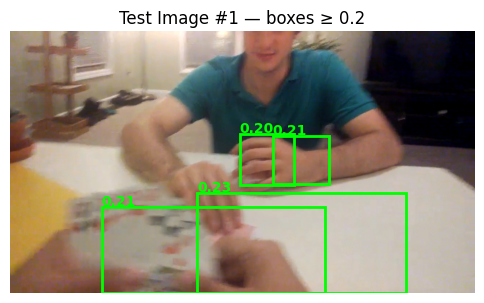

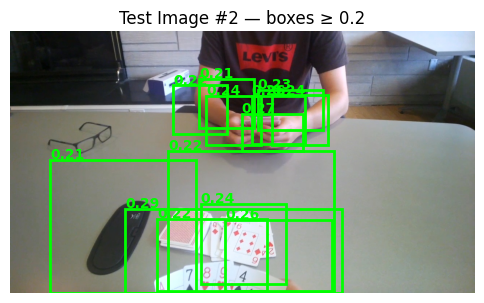

In [ ]:
import matplotlib.pyplot as plt
import torch

# Reload best weights & set to eval
model.load_state_dict(torch.load("/content/drive/MyDrive/egohands_data/egohands_coco/best_frcnn_egohands.pth"))
model.eval()

# Grab one small batch from the test split
imgs_batch, _ = next(iter(loaders['test']))
with torch.no_grad():
    outputs = model([img.to(device) for img in imgs_batch])

# How many to plot?
num_to_show = min(len(imgs_batch), 2)  # your batch_size=2
CONF_THRESH = 0.2                    # draw any box ≥10% confidence

for i in range(num_to_show):
    img_t = imgs_batch[i]
    out   = outputs[i]
    img_np = img_t.permute(1,2,0).cpu().numpy()

    plt.figure(figsize=(6,4))
    plt.imshow(img_np)
    plt.axis('off')

    # Draw all predicted boxes above CONF_THRESH
    for box, score in zip(out['boxes'], out['scores']):
        if score >= CONF_THRESH:
            x1,y1,x2,y2 = box.cpu()
            plt.gca().add_patch(
                plt.Rectangle((x1,y1), x2-x1, y2-y1,
                              fill=False, linewidth=2,
                              edgecolor='lime')
            )
            # Optional: annotate score
            plt.text(x1, y1-5, f"{score:.2f}",
                     color='lime', fontsize=10, weight='bold')

   plt.title(f"Test Image #{i+1} — boxes ≥ {CONF_THRESH}")
    plt.show()


In [ ]:
# 0) Imports
import os, json, torch
import numpy as np
from tqdm import tqdm
from PIL import Image
import torchvision.transforms.functional as TF
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# assume `model` is your trained MaskRCNN on EgoHands, already .to(device) and eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# 1) Paths
COCO_DIR       = "/content/drive/MyDrive/egohands_data/egohands_coco"
IMAGES_DIR     = os.path.join(COCO_DIR, "images")
ANN_FILE       = os.path.join(COCO_DIR, "annotations.json")
DETECTIONS_JSON= os.path.join(COCO_DIR, "egohands_detections.json")

# 2) Load ground truth COCO
coco_gt = COCO(ANN_FILE)
images   = coco_gt.dataset["images"]    # list of dicts, each has 'id' and 'file_name'

all_preds = []
# 3) Loop over every image in the COCO GT, do inference
for img_info in tqdm(images, desc="Running EgoHands inference"):
    image_id = img_info["id"]
    path     = os.path.join(IMAGES_DIR, img_info["file_name"])
    pil      = Image.open(path).convert("RGB")
    tensor   = TF.to_tensor(pil).to(device)

    with torch.no_grad():
        out = model([tensor])[0]

    # collect each box, score, label
    for box, score, label in zip(out["boxes"], out["scores"], out["labels"]):
        b = box.cpu().tolist()
        all_preds.append({
            "image_id":    image_id,
            "category_id": int(label.cpu().item()),       # should be 1 == "hand"
            "bbox":        [b[0], b[1], b[2]-b[0], b[3]-b[1]],
            "score":       float(score.cpu().item())
        })

# 4) Save detections JSON & report size
with open(DETECTIONS_JSON, "w") as f:
    json.dump(all_preds, f)
size_mb = os.path.getsize(DETECTIONS_JSON) / 1024**2
print(f"✅ Saved {len(all_preds)} detections to {DETECTIONS_JSON} ({size_mb:.2f} MB)")

# 5) Run COCO‐style evaluation
coco_dt = coco_gt.loadRes(DETECTIONS_JSON)
coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
coco_eval.params.useCats = 1
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


Running EgoHands inference: 100%|██████████| 169/169 [00:24<00:00,  6.94it/s]


✅ Saved 16900 detections to /content/drive/MyDrive/egohands_data/egohands_coco/egohands_detections.json (2.46 MB)
Loading and preparing results...
DONE (t=0.06s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.88s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.029
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.053
 Average Recall     (AR) @[ IoU=

In [ ]:
# --- (keep steps 0–5 exactly as before) ---

# 6) Train + “Val‐loss” loop with zero‐box filtering and early stopping
best_val = float('inf')
wait     = 0

for epoch in range(1, NUM_EPOCHS+1):
    # --- TRAIN ---
    model.train()
    total_tr = 0.0
    for imgs, tgts in loaders['train']:
        # filter out samples with no boxes
        filtered = [(i,t) for i,t in zip(imgs,tgts) if t["boxes"].numel()>0]
        if not filtered:
            continue
        imgs, tgts = zip(*filtered)

        imgs = [img.to(DEVICE) for img in imgs]
        tgts = [{k:v.to(DEVICE) for k,v in t.items()} for t in tgts]

        loss_dict = model(imgs, tgts)
        loss = sum(loss_dict.values())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_tr += loss.item()

    lr_scheduler.step()
    avg_tr = total_tr / len(loaders['train'])

    # --- VALIDATION (same train() mode, skip zero‐box) ---
    model.train()
    total_val = 0.0
    with torch.no_grad():
        for imgs, tgts in loaders['val']:
            filtered = [(i,t) for i,t in zip(imgs,tgts) if t["boxes"].numel()>0]
            if not filtered:
                continue
            imgs, tgts = zip(*filtered)

            imgs = [img.to(DEVICE) for img in imgs]
            tgts = [{k:v.to(DEVICE) for k,v in t.items()} for t in tgts]

            loss_dict = model(imgs, tgts)
            total_val += sum(loss_dict.values()).item()

    avg_val = total_val / len(loaders['val'])

    print(f"Epoch {epoch:2d} ▶ Train Loss: {avg_tr:.3f} | Val Loss: {avg_val:.3f}")

    # early‐stop
    if avg_val < best_val:
        best_val = avg_val
        wait = 0
        ckpt = os.path.join(DATA_ROOT, "best_frcnn_egohands.pth")
        torch.save(model.state_dict(), ckpt)
        print("  💾 Saved:", ckpt)
    else:
        wait += 1
        if wait >= PATIENCE:
            print(f"⏸ Early stopping at epoch {epoch}")
            break

# 7) Test‐forward (also skipping zero‐box)
model.load_state_dict(torch.load(os.path.join(DATA_ROOT,"best_frcnn_egohands.pth")))
model.eval()
with torch.no_grad():
    imgs, tgts = next(iter(loaders['test']))
    filtered = [(i,t) for i,t in zip(imgs,tgts) if t["boxes"].numel()>0]
    if filtered:
        imgs, tgts = zip(*filtered)
        out = model([img.to(DEVICE) for img in imgs])
        print("✅ Test forward OK, sample output keys:", out[0].keys())
    else:
        print("⚠️ All test images had zero boxes—nothing to forward!")

print("🎉 Done. Best validation loss:", best_val)


Epoch  1 ▶ Train Loss: 0.445 | Val Loss: 0.339
  💾 Saved: /content/drive/MyDrive/egohands_data/egohands_coco/best_frcnn_egohands.pth
Epoch  2 ▶ Train Loss: 0.464 | Val Loss: 0.365
Epoch  3 ▶ Train Loss: 0.479 | Val Loss: 0.391
Epoch  4 ▶ Train Loss: 0.447 | Val Loss: 0.400
⏸ Early stopping at epoch 4
✅ Test forward OK, sample output keys: dict_keys(['boxes', 'labels', 'scores'])
🎉 Done. Best validation loss: 0.3386642783880234


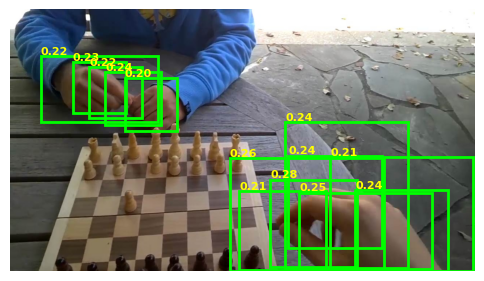

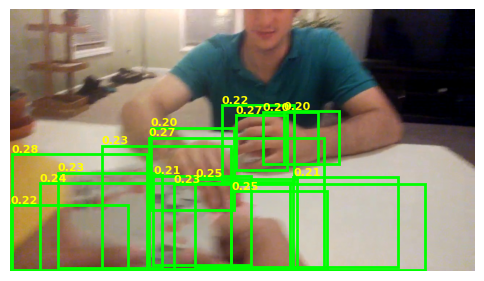

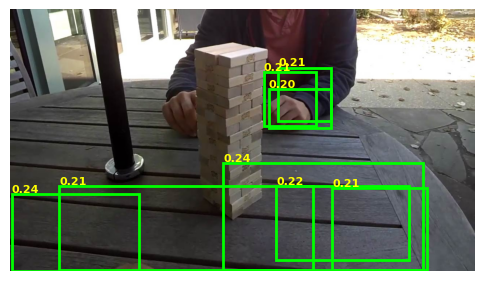

In [ ]:
import random
import matplotlib.pyplot as plt

# load the best model
model.load_state_dict(torch.load(
    "/content/drive/MyDrive/egohands_data/egohands_coco/best_frcnn_egohands.pth"))
model.eval()

def show_boxes(img_tensor, boxes, scores, threshold=0.3):
    img = img_tensor.permute(1,2,0).cpu().numpy()
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    ax = plt.gca()
    for (x1,y1,x2,y2), s in zip(boxes, scores):
        if s < threshold: continue
        rect = plt.Rectangle(
            (x1,y1), x2-x1, y2-y1,
            fill=False, edgecolor='lime', linewidth=2)
        ax.add_patch(rect)
        ax.text(x1, y1-5, f"{s:.2f}",
                color='yellow', fontsize=8, weight='bold')
    plt.axis('off')
    plt.show()

# pick 3 random indices
all_idx = list(range(len(loaders['test'].dataset)))tor
random.shuffle(all_idx)
samples = all_idx[:3]

for idx in samples:
    img, _ = loaders['test'].dataset[idx]
    with torch.no_grad():
        out = model([img.to(DEVICE)])[0]
    show_boxes(
        img,
        out['boxes'].cpu().numpy(),
        out['scores'].cpu().numpy(),
        threshold=0.2
    )


You already have a working hand detector (best_frcnn_egohands.pth). Let’s use that on every WLASL frame to crop hands and feed your gloss classifier

In [ ]:
# 1) Unmount and completely delete any leftover mount directory
from google.colab import drive
try:
    drive.flush_and_unmount()
except:
    pass

# Force-remove the /content/drive folder so it’s empty
!rm -rf /content/drive
!mkdir /content/drive

# 2) Remount your Google Drive cleanly
from google.colab import drive
drive.mount('/content/drive')


Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
import os
import glob
import torch
from PIL import Image
from torchvision.datasets import CocoDetection as TVCocoDetection
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader
from torch.optim import SGD
from torch.optim.lr_scheduler import StepLR

# 1) point this at your Roboflow-download folder
DATA_ROOT = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco"
assert os.path.isdir(DATA_ROOT), "Check your DATA_ROOT path!"

# 2) discover splits & image dirs (with or without an `images/` subfolder)
SPLITS = {}
for split in ("train", "valid", "test"):
    split_dir = os.path.join(DATA_ROOT, split)
    # if there's an images/ folder, use it; otherwise assume images are directly in split_dir
    if os.path.isdir(os.path.join(split_dir, "images")):
        img_dir = os.path.join(split_dir, "images")
    else:
        img_dir = split_dir

    # expect exactly one annotations JSON per split
    ann_files = glob.glob(os.path.join(split_dir, "*annotations*.json"))
    if len(ann_files) != 1:
        raise RuntimeError(f"{split} should contain exactly one JSON, found {ann_files}")
    SPLITS[split] = (img_dir, ann_files[0])

print("SPLITS:", SPLITS)

# 3) custom Dataset that falls back on Roboflow’s .rf.<hash> naming
class EgoHandsDataset(TVCocoDetection):
    def __init__(self, root, annFile, transforms=None):
        super().__init__(root, annFile)
        self.transforms = transforms

    def _load_image(self, id: int) -> Image.Image:
        info = self.coco.imgs[id]
        fn   = info["file_name"]
        p1   = os.path.join(self.root, fn)
        if os.path.exists(p1):
            return Image.open(p1).convert("RGB")

        # fallback: strip off the Roboflow “.rf.<hash>.” segment
        if ".rf." in fn:
            base = fn.split(".rf.")[0]
            # some exports tack on `_jpg` before the hash; remove that
            if base.endswith("_jpg"):
                base = base[:-4]
            p2 = os.path.join(self.root, base + ".jpg")
            if os.path.exists(p2):
                return Image.open(p2).convert("RGB")

        tried = f"  {p1}\n  {p2 if 'p2' in locals() else '<none>'}"
        raise FileNotFoundError(f"Tried:\n{tried}")

    def __getitem__(self, idx):
        img, anns = TVCocoDetection.__getitem__(self, idx)  # use torchvision’s loader
        boxes, labels = [], []
        for o in anns:
            x, y, w, h = o["bbox"]
            boxes.append([x, y, x + w, y + h])
            labels.append(1)
        target = {
            "boxes":  torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64),
        }
        if self.transforms:
            img, target = self.transforms(img, target)
        return img, target

def transform_fn(img, target):
    if not isinstance(img, torch.Tensor):
        img = F.to_tensor(img)
    return img, target

# 4) build DataLoaders
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loaders = {}
for split, (img_dir, ann_file) in SPLITS.items():
    ds = EgoHandsDataset(root=img_dir, annFile=ann_file, transforms=transform_fn)
    loaders[split] = DataLoader(
        ds,
        batch_size=2,
        shuffle=(split=="train"),
        num_workers=2,
        collate_fn=lambda batch: tuple(zip(*batch))
    )

# 5) model + optimizer setup
model = fasterrcnn_resnet50_fpn(pretrained=True)
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, num_classes=2)
model.to(DEVICE)

optimizer    = SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = StepLR(optimizer, step_size=5, gamma=0.1)

# 6) training loop with early stopping
NUM_EPOCHS = 10
PATIENCE   = 3
best_val   = float("inf")
wait       = 0
ckpt_path  = os.path.join(DATA_ROOT, "best_frcnn_egohands.pth")

for epoch in range(1, NUM_EPOCHS+1):
    # — TRAIN —
    model.train()
    tr_loss = 0.0
    for imgs, tgts in loaders["train"]:
        filtered = [(i,t) for i,t in zip(imgs,tgts) if t["boxes"].numel()>0]
        if not filtered:
            continue
        imgs, tgts = zip(*filtered)
        imgs = [i.to(DEVICE) for i in imgs]
        tgts = [{k:v.to(DEVICE) for k,v in t.items()} for t in tgts]
        loss_dict = model(imgs, tgts)
        loss      = sum(loss_dict.values())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        tr_loss += loss.item()
    lr_scheduler.step()
    avg_tr = tr_loss / len(loaders["train"])

    # — VALIDATE —
    model.train()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, tgts in loaders["valid"]:
            filtered = [(i,t) for i,t in zip(imgs,tgts) if t["boxes"].numel()>0]
            if not filtered: continue
            imgs, tgts = zip(*filtered)
            imgs = [i.to(DEVICE) for i in imgs]
            tgts = [{k:v.to(DEVICE) for k,v in t.items()} for t in tgts]
            loss_dict = model(imgs, tgts)
            val_loss  += sum(loss_dict.values()).item()
    avg_val = val_loss / len(loaders["valid"])

    print(f"Epoch {epoch:2d} ▶ Train Loss: {avg_tr:.3f} | Val Loss: {avg_val:.3f}")
    if avg_val < best_val:
        best_val, wait = avg_val, 0
        torch.save(model.state_dict(), ckpt_path)
        print("  💾 Saved best →", ckpt_path)
    else:
        wait += 1
        if wait >= PATIENCE:
            print("⏸ Early stopping at epoch", epoch)
            break

# 7) quick test‐forward
model.load_state_dict(torch.load(ckpt_path))
model.eval()
with torch.no_grad():
    imgs, tgts = next(iter(loaders["test"]))
    filtered   = [(i,t) for i,t in zip(imgs,tgts) if t["boxes"].numel()>0]
    if filtered:
        imgs, _ = zip(*filtered)
        out = model([i.to(DEVICE) for i in imgs])
        print("✅ Test forward OK, sample keys:", out[0].keys())
    else:
        print("⚠️ No boxes in any test image")

print("🎉 Done. Best Val Loss =", best_val)


SPLITS: {'train': ('/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/train', '/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/train/_annotations.coco.json'), 'valid': ('/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/valid', '/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/valid/_annotations.coco.json'), 'test': ('/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/test', '/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/test/_annotations.coco.json')}
loading annotations into memory...
Done (t=0.19s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Epoch  1 ▶ Train Loss: 0.247 | Val Loss: 0.215
  💾 Saved best → /content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands.pth
Epoch  2 ▶ Train Loss: 0.196 | V

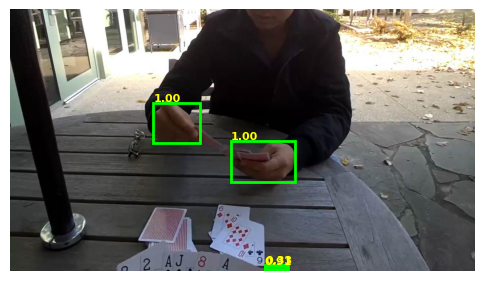

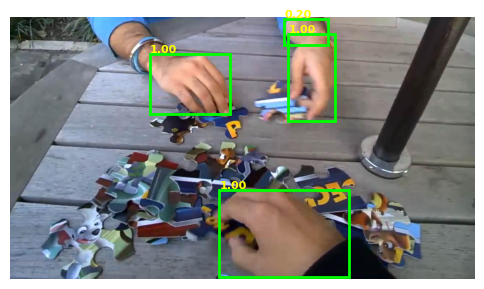

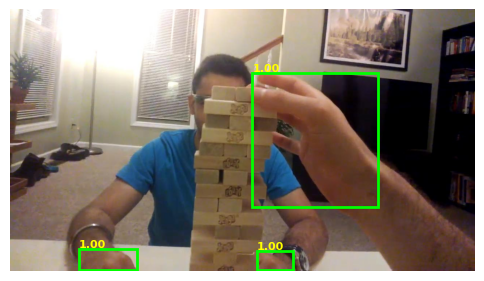

In [ ]:
import random
import matplotlib.pyplot as plt

# load the best model
model.load_state_dict(torch.load(
    "/content/drive/MyDrive/egohands_data//EgoHandsPublicv1specific.coco/best_frcnn_egohands.pth"))
model.eval()

def show_boxes(img_tensor, boxes, scores, threshold=0.3):
    img = img_tensor.permute(1,2,0).cpu().numpy()
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    ax = plt.gca()
    for (x1,y1,x2,y2), s in zip(boxes, scores):
        if s < threshold: continue
        rect = plt.Rectangle(
            (x1,y1), x2-x1, y2-y1,
            fill=False, edgecolor='lime', linewidth=2)
        ax.add_patch(rect)
        ax.text(x1, y1-5, f"{s:.2f}",
                color='yellow', fontsize=8, weight='bold')
    plt.axis('off')
    plt.show()

# pick 3 random indices
all_idx = list(range(len(loaders['test'].dataset)))
random.shuffle(all_idx)
samples = all_idx[:3]

for idx in samples:
    img, _ = loaders['test'].dataset[idx]
    with torch.no_grad():
        out = model([img.to(DEVICE)])[0]
    show_boxes(
        img,
        out['boxes'].cpu().numpy(),
        out['scores'].cpu().numpy(),
        threshold=0.2
    )


Batch‐run detection over all your WLASL frames and write out cropped‐hand patches

In [ ]:
import os
import cv2
import torch
from torchvision.transforms.functional import to_tensor
from tqdm import tqdm

# paths & settings
FRAMES_DIR  = "/content/drive/MyDrive/WLASL_Frames_Final"
CROP_ROOT   = "/content/drive/MyDrive/WLASL_Hand_Crops_Detected"
THRESH      = 0.2
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

os.makedirs(CROP_ROOT, exist_ok=True)

# load model
model.to(DEVICE).eval()

for fname in tqdm(os.listdir(FRAMES_DIR), desc="Detect & crop hands"):
    if not fname.endswith(".jpg"): continue
    img_bgr = cv2.imread(os.path.join(FRAMES_DIR, fname))
    if img_bgr is None: continue
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    tensor   = to_tensor(img_rgb).to(DEVICE)

    with torch.no_grad():
        out = model([tensor])[0]

    keep = out["scores"] >= THRESH
    boxes = out["boxes"][keep].cpu().numpy()
    for i, (x1,y1,x2,y2) in enumerate(boxes):
        x1, y1, x2, y2 = map(int, [x1,y1,x2,y2])
        crop = img_rgb[y1:y2, x1:x2]
        if crop.size == 0:
            continue
        # save into a folder per frame (or per gloss later)
        out_dir = os.path.join(CROP_ROOT, fname[:-4])
        os.makedirs(out_dir, exist_ok=True)
        cv2.imwrite(os.path.join(out_dir, f"hand_{i:02d}.jpg"), cv2.cvtColor(crop, cv2.COLOR_RGB2BGR))


Detect & crop hands: 100%|██████████| 50/50 [00:00<00:00, 315361.20it/s]


In [ ]:
import os, random, cv2
import matplotlib.pyplot as plt

CROP_ROOT = "/content/drive/MyDrive/WLASL_Hand_Crops_Detected"

# pick 6 random frame‐folders
folders = [d for d in os.listdir(CROP_ROOT) if os.path.isdir(os.path.join(CROP_ROOT,d))]
samples = random.sample(folders, min(6, len(folders)))

plt.figure(figsize=(12,6))
for i, frame in enumerate(samples, 1):
    frame_dir = os.path.join(CROP_ROOT, frame)
    imgs = [f for f in os.listdir(frame_dir) if f.lower().endswith((".jpg",".png"))]
    if not imgs:
        continue
    pick = random.choice(imgs)
    img = cv2.imread(os.path.join(frame_dir, pick))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax = plt.subplot(2,3,i)
    ax.imshow(img)
    ax.set_title(f"{frame}/{pick}", fontsize=8)
    ax.axis("off")
plt.tight_layout()


<Figure size 1200x600 with 0 Axes>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Below is a self-contained snippet that:

Loads your fine-tuned detector checkpoint

Defines a detect_hands helper

Loops over all your WLASL gloss folders, runs detection at a given score threshold, and writes out crops

In [ ]:
import os
import cv2
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F

# 0) CONFIG — change these paths as needed
DRIVE_ROOT       = "/content/drive/MyDrive"
FRAME_ROOT       = os.path.join(DRIVE_ROOT, "WLASL_Frames_Final")
DETECTOR_CKPT    = os.path.join(DRIVE_ROOT, "egohands_data", "EgoHandsPublicv1specific.coco", "best_frcnn_egohands.pth")
OUT_ROOT         = os.path.join(DRIVE_ROOT, "WLASL_Hand_Crops_Detector")
DEVICE           = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SCORE_THRESHOLD  = 0.20

# 1) Load your fine-tuned Faster‐RCNN
model = fasterrcnn_resnet50_fpn(pretrained=False)
# Replace classifier for 2 classes (bg + hand)
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, num_classes=2)
model.load_state_dict(torch.load(DETECTOR_CKPT, map_location=DEVICE))
model.to(DEVICE).eval()

# 2) Helper to run detection & return boxes + scores above threshold
def detect_hands(img_bgr, model=model, thresh=SCORE_THRESHOLD):
    """
    img_bgr: H×W×3 OpenCV BGR image
    returns:
      boxes: list of [x1,y1,x2,y2]
      scores: list of floats
    """
    # convert BGR→RGB→tensor
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_t   = F.to_tensor(img_rgb).to(DEVICE)
    with torch.no_grad():
        out = model([img_t])[0]
    # filter by score
    keep = out["scores"] >= thresh
    boxes = out["boxes"][keep].cpu().numpy().tolist()
    scores = out["scores"][keep].cpu().numpy().tolist()
    return boxes, scores

# 3) Run detector across all glosses
for gloss in os.listdir(FRAME_ROOT):
    src_dir = os.path.join(FRAME_ROOT, gloss)
    dst_dir = os.path.join(OUT_ROOT, gloss)
    os.makedirs(dst_dir, exist_ok=True)
    print(f"→ Processing gloss '{gloss}' ({len(os.listdir(src_dir))} frames)…")

    for frame_fn in os.listdir(src_dir):
        src_fp = os.path.join(src_dir, frame_fn)
        img    = cv2.imread(src_fp)
        if img is None:
            continue

        boxes, scores = detect_hands(img)
        for i, (box, score) in enumerate(zip(boxes, scores)):
            x1,y1,x2,y2 = map(int, box)
            crop = img[y1:y2, x1:x2]
            out_fp = os.path.join(dst_dir, f"{os.path.splitext(frame_fn)[0]}_crop{i:02d}.jpg")
            cv2.imwrite(out_fp, crop)

    print(f"  ✅ Saved crops to: {dst_dir}\n")

print("🎉 All done. Your detector crops live in:\n   ", OUT_ROOT)


→ Processing gloss 'take' (11 frames)…
  ✅ Saved crops to: /content/drive/MyDrive/WLASL_Hand_Crops_Detector/take

→ Processing gloss 'bed' (13 frames)…
  ✅ Saved crops to: /content/drive/MyDrive/WLASL_Hand_Crops_Detector/bed

→ Processing gloss 'thursday' (11 frames)…
  ✅ Saved crops to: /content/drive/MyDrive/WLASL_Hand_Crops_Detector/thursday

→ Processing gloss 'argue' (10 frames)…
  ✅ Saved crops to: /content/drive/MyDrive/WLASL_Hand_Crops_Detector/argue

→ Processing gloss 'cold' (12 frames)…
  ✅ Saved crops to: /content/drive/MyDrive/WLASL_Hand_Crops_Detector/cold

→ Processing gloss 'bar' (11 frames)…
  ✅ Saved crops to: /content/drive/MyDrive/WLASL_Hand_Crops_Detector/bar

→ Processing gloss 'apple' (11 frames)…
  ✅ Saved crops to: /content/drive/MyDrive/WLASL_Hand_Crops_Detector/apple

→ Processing gloss 'thanksgiving' (13 frames)…
  ✅ Saved crops to: /content/drive/MyDrive/WLASL_Hand_Crops_Detector/thanksgiving

→ Processing gloss 'hot' (10 frames)…
  ✅ Saved crops to: /conte

In [ ]:
import os, cv2, torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn

# 1) Load your fine-tuned detector
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = fasterrcnn_resnet50_fpn(pretrained=False, num_classes=2)
checkpoint = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands.pth"
model.load_state_dict(torch.load(checkpoint, map_location=DEVICE))
model.to(DEVICE).eval()

def detect_hands(img, thresh=0.2):
    # BGR->RGB, to tensor, batch
    t = torch.from_numpy(img[...,::-1].copy()).permute(2,0,1).float() / 255.0
    with torch.no_grad():
        out = model([t.to(DEVICE)])[0]
    keep = out["scores"] >= thresh
    return out["boxes"][keep].cpu().numpy().astype(int)

SRC_ROOT = "/content/drive/MyDrive/WLASL_Frames_Final/night"
DST_ROOT = "/content/drive/MyDrive/WLASL_Hand_Crops_Detector/night"
os.makedirs(DST_ROOT, exist_ok=True)

for vid in sorted(os.listdir(SRC_ROOT)):
    src_vid = os.path.join(SRC_ROOT, vid)
    if not os.path.isdir(src_vid):
        continue
    dst_vid = os.path.join(DST_ROOT, vid)
    os.makedirs(dst_vid, exist_ok=True)

    for fn in sorted(os.listdir(src_vid)):
        if not fn.lower().endswith(('.jpg','jpeg','png')):
            continue
        src_path = os.path.join(src_vid, fn)
        img = cv2.imread(src_path)
        if img is None:
            print("⚠️ failed to read", src_path)
            continue

        boxes = detect_hands(img, thresh=0.2)
        if len(boxes) == 0:
            # you can log or skip
            continue

        for i, (x1,y1,x2,y2) in enumerate(boxes):
            crop = img[y1:y2, x1:x2]
            out_name = f"{fn[:-4]}_crop{i}.jpg"
            cv2.imwrite(os.path.join(dst_vid, out_name), crop)

print("✅ Cropping done – check", DST_ROOT)


✅ Cropping done – check /content/drive/MyDrive/WLASL_Hand_Crops_Detector/night


In [ ]:
import os, cv2, torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn

# 1) Load your fine-tuned detector
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = fasterrcnn_resnet50_fpn(pretrained=False, num_classes=2)
checkpoint = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands.pth"
model.load_state_dict(torch.load(checkpoint, map_location=DEVICE))
model.to(DEVICE).eval()



FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [ ]:
import os, cv2, torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn

# 1) Load your fine-tuned detector
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = fasterrcnn_resnet50_fpn(pretrained=False, num_classes=2)
checkpoint = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands.pth"
model.load_state_dict(torch.load(checkpoint, map_location=DEVICE))
model.to(DEVICE).eval()

def detect_hands(img, thresh=0.2):
    # BGR->RGB, HWC->CHW, normalize
    t = torch.from_numpy(img[..., ::-1].copy()).permute(2,0,1).float() / 255.0
    with torch.no_grad():
        out = model([t.to(DEVICE)])[0]
    keep = out["scores"] >= thresh
    return out["boxes"][keep].cpu().numpy().astype(int)

SRC_ROOT = "/content/drive/MyDrive/WLASL_Frames_Final"
DST_ROOT = "/content/drive/MyDrive/WLASL_Hand_Crops_Detector_all"
os.makedirs(DST_ROOT, exist_ok=True)

for gloss in sorted(os.listdir(SRC_ROOT)):
    gloss_src = os.path.join(SRC_ROOT, gloss)
    if not os.path.isdir(gloss_src):
        continue
    gloss_dst = os.path.join(DST_ROOT, gloss)
    os.makedirs(gloss_dst, exist_ok=True)

    # inside each gloss, there are subfolders named by video ID
    for vid in sorted(os.listdir(gloss_src)):
        src_vid = os.path.join(gloss_src, vid)
        if not os.path.isdir(src_vid):
            continue
        dst_vid = os.path.join(gloss_dst, vid)
        os.makedirs(dst_vid, exist_ok=True)

        for fn in sorted(os.listdir(src_vid)):
            if not fn.lower().endswith(('.jpg','jpeg','png')):
                continue
            src_path = os.path.join(src_vid, fn)
            img = cv2.imread(src_path)
            if img is None:
                print("⚠️ failed to read", src_path)
                continue

            boxes = detect_hands(img, thresh=0.2)
            for i, (x1,y1,x2,y2) in enumerate(boxes):
                crop = img[y1:y2, x1:x2]
                out_name = f"{fn[:-4]}_crop{i}.jpg"
                cv2.imwrite(os.path.join(dst_vid, out_name), crop)

    print(f"✅ Finished gloss '{gloss}' – crops in {gloss_dst}/{gloss}")

print("🎉 All glosses processed; check", DST_ROOT)


✅ Finished gloss 'agree' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/agree/agree
✅ Finished gloss 'always' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/always/always
✅ Finished gloss 'angry' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/angry/angry
✅ Finished gloss 'apple' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/apple/apple
✅ Finished gloss 'argue' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/argue/argue
✅ Finished gloss 'bank' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/bank/bank
✅ Finished gloss 'bar' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/bar/bar
✅ Finished gloss 'bed' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/bed/bed
✅ Finished gloss 'bike' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/bike/bike
✅ Finished gloss 'bottom' – crops in /content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/bottom/bottom
✅ 

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
✅ Wrote 1777 detections to /content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/egohands_detections.json
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.29s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.039
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.051
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.045
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.051
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.048
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.042
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.052
 Average Recall     (AR) @

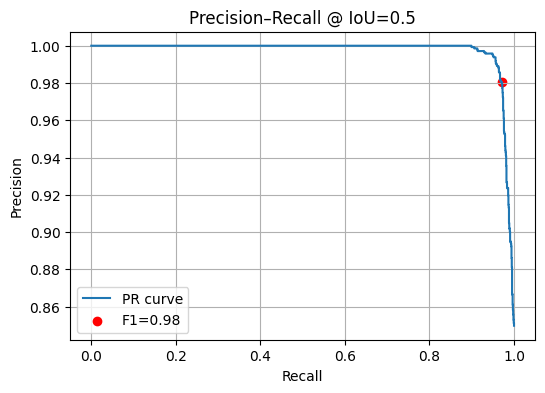

▶ ROC AUC = 0.983


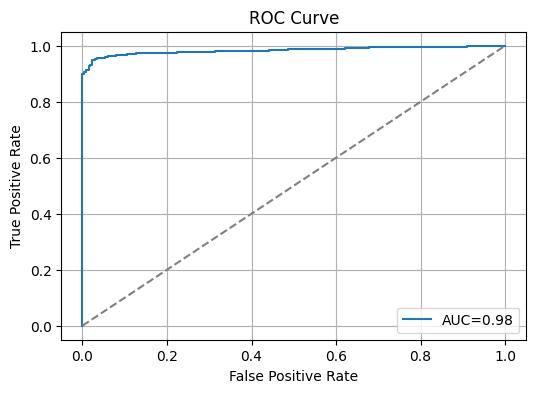

In [ ]:
# 0) Install deps
!pip install pycocotools matplotlib scikit-learn

# 1) Imports
import os, json, torch, numpy as np
from PIL import Image
from torchvision.transforms import functional as F
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from sklearn.metrics import precision_recall_curve, roc_curve, auc
import matplotlib.pyplot as plt
from collections import defaultdict

# 2) Paths
DRIVE_ROOT = "/content/drive/MyDrive/egohands_data"
COCO_ROOT  = os.path.join(DRIVE_ROOT, "EgoHandsPublicv1specific.coco")
MODEL_PATH = os.path.join(COCO_ROOT, "best_frcnn_egohands.pth")
GT_JSON    = os.path.join(COCO_ROOT, "test", "_annotations.coco.json")
IMG_DIR    = os.path.join(COCO_ROOT, "test")
DT_JSON    = os.path.join(COCO_ROOT, "egohands_detections.json")

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 3) Load GT & build filename→image_id map
coco_gt  = COCO(GT_JSON)
img_ids  = coco_gt.getImgIds()
img_info = coco_gt.loadImgs(img_ids)
fname2id = {info["file_name"]: info["id"] for info in img_info}

# 4) Load model
model = fasterrcnn_resnet50_fpn(pretrained=False)
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, num_classes=2)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.eval().to(DEVICE)

# 5) Inference → collect detections
results = []
for fn in sorted(os.listdir(IMG_DIR)):
    if not fn.lower().endswith((".jpg","jpeg","png")):
        continue
    image_id = fname2id.get(fn)
    if image_id is None:
        print("⚠️ Unknown file:", fn)
        continue

    img_path = os.path.join(IMG_DIR, fn)
    img = Image.open(img_path).convert("RGB")
    img_t = F.to_tensor(img).to(DEVICE)

    with torch.no_grad():
        out = model([img_t])[0]

    for box, score, label in zip(out["boxes"], out["scores"], out["labels"]):
        # box is a Tensor of shape [4]
        b = box.cpu().numpy().tolist()      # now a list of Python floats
        xmin, ymin, xmax, ymax = b
        w = xmax - xmin
        h = ymax - ymin

        det = {
            "image_id": int(image_id),
            "category_id": int(label.cpu().item()),
            "bbox": [
                float(xmin),
                float(ymin),
                float(w),
                float(h)
            ],
            "score": float(score.cpu().item())
        }
        results.append(det)

# save detections JSON
with open(DT_JSON, "w") as f:
    json.dump(results, f, indent=2)
print(f"✅ Wrote {len(results)} detections to {DT_JSON}")

# 6) COCOeval
coco_dt   = coco_gt.loadRes(DT_JSON)
coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

# 7) Precision–Recall & F1 @ IoU=0.5
gt_boxes = defaultdict(list)
for img_id in img_ids:
    for ann in coco_gt.loadAnns(coco_gt.getAnnIds(imgIds=img_id)):
        gt_boxes[img_id].append(ann["bbox"])

y_true, y_score = [], []
for det in results:
    img_id = det["image_id"]
    db     = np.array(det["bbox"], dtype=np.float32)
    score  = det["score"]
    best_iou = 0.0

    for gb in gt_boxes[img_id]:
        gb = np.array(gb, dtype=np.float32)
        ix = max(0, min(db[0]+db[2], gb[0]+gb[2]) - max(db[0], gb[0]))
        iy = max(0, min(db[1]+db[3], gb[1]+gb[3]) - max(db[1], gb[1]))
        inter = ix * iy
        union = db[2]*db[3] + gb[2]*gb[3] - inter
        iou = float(inter/union) if union>0 else 0.0
        best_iou = max(best_iou, iou)

    y_true.append(1 if best_iou >= 0.5 else 0)
    y_score.append(float(score))

prec, rec, th = precision_recall_curve(y_true, y_score)
f1           = 2 * prec*rec / (prec + rec + 1e-8)
best_idx     = int(np.argmax(f1))
print(f"\n▶ Best F1 = {f1[best_idx]:.3f} at score ≥ {th[best_idx]:.3f}")

plt.figure(figsize=(6,4))
plt.plot(rec, prec, label="PR curve")
plt.scatter(rec[best_idx], prec[best_idx], c="r",
            label=f"F1={f1[best_idx]:.2f}")
plt.xlabel("Recall"); plt.ylabel("Precision")
plt.title("Precision–Recall @ IoU=0.5")
plt.legend(); plt.grid(True); plt.show()

# 8) ROC & AUC
fpr, tpr, _ = roc_curve(y_true, y_score)
roc_auc     = auc(fpr, tpr)
print(f"▶ ROC AUC = {roc_auc:.3f}")

plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, label=f"AUC={roc_auc:.2f}")
plt.plot([0,1],[0,1],"--",c="gray")
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("ROC Curve"); plt.legend(); plt.grid(True); plt.show()


In [ ]:
from pathlib import Path
# point to the filtered folder:
ROOT = Path("/content/drive/MyDrive/WLASL_Hand_Crops_Filtered")
print("Found classes:", sorted([d.name for d in ROOT.iterdir() if d.is_dir()]))
print("Example images per class:")
for d in ROOT.iterdir():
    if d.is_dir():
        print(d.name, len(list((d).glob("*.jpg"))))


Found classes: ['agree', 'always', 'angry', 'apple', 'argue', 'bank', 'bar', 'bed', 'bike', 'bottom', 'cemetery', 'cold', 'concept', 'concern', 'constitution', 'crab', 'detective', 'eternity', 'fall in love', 'father', 'forget', 'gift', 'gossip', 'greece', 'have', 'honest', 'hot', 'hot dog', 'jealous', 'laptop', 'monday', 'negative', 'night', 'owl', 'paragraph', 'program', 'push', 'singer', 'slow', 'specific', 'take', 'thanksgiving', 'thursday', 'tolerate', 'topic', 'trip', 'turkey', 'vote', 'wheelchair', 'witness']
Example images per class:
take 172
argue 206
thursday 247
bed 214
cold 230
bar 201
apple 227
hot 189
thanksgiving 201
constitution 80
night 111
vote 117
specific 84
slow 189
monday 134
tolerate 59
agree 62
fall in love 79
cemetery 95
crab 76
greece 153
gift 58
paragraph 97
eternity 71
program 142
owl 93
concern 102
concept 85
jealous 85
detective 34
bank 35
bike 59
topic 151
push 87
bottom 91
father 155
have 105
always 135
laptop 126
forget 70
singer 68
angry 149
gossip 115

In [ ]:
import os
import torch
import cv2
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms.functional import to_tensor
from tqdm import tqdm

# 1) Paths & device
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CKPT   = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands.pth"
WLASL_FRAMES = "/content/drive/MyDrive/WLASL_Frames_Final"
OUT_ROOT     = "/content/drive/MyDrive/WLASL_EgoHands_On_WLASL"
THRESH       = 0.3  # adjust as needed

# 2) Load model architecture + weights
model = fasterrcnn_resnet50_fpn(pretrained=False)
# replace box predictor for 2 classes
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, num_classes=2)
model.load_state_dict(torch.load(CKPT, map_location=DEVICE))
model.to(DEVICE).eval()
print("✅ Loaded EgoHands detector from", CKPT)

# 3) Iterate gloss → frames
for gloss in os.listdir(WLASL_FRAMES):
    src_dir = os.path.join(WLASL_FRAMES, gloss)
    dst_dir = os.path.join(OUT_ROOT, gloss)
    os.makedirs(dst_dir, exist_ok=True)

    for fname in tqdm(os.listdir(src_dir), desc=f"Detecting in {gloss}", leave=False):
        src_path = os.path.join(src_dir, fname)
        img = cv2.imread(src_path)
        if img is None:
            continue

        # 4) Preprocess & inference
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        tensor  = to_tensor(img_rgb).to(DEVICE)
        with torch.no_grad():
            out = model([tensor])[0]

        # 5) Draw boxes above threshold
        for box, score in zip(out["boxes"], out["scores"]):
            if score < THRESH:
                continue
            x1,y1,x2,y2 = map(int, box.tolist())
            cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
            cv2.putText(img, f"{score:.2f}", (x1,y1-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 1)

        # 6) Save visualization
        cv2.imwrite(os.path.join(dst_dir, fname), img)

print("🎉 Done! Check your detections at:", OUT_ROOT)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


✅ Loaded EgoHands detector from /content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands.pth


🎉 Done! Check your detections at: /content/drive/MyDrive/WLASL_EgoHands_On_WLASL


WLASL_EgoHands_On_WLASL

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


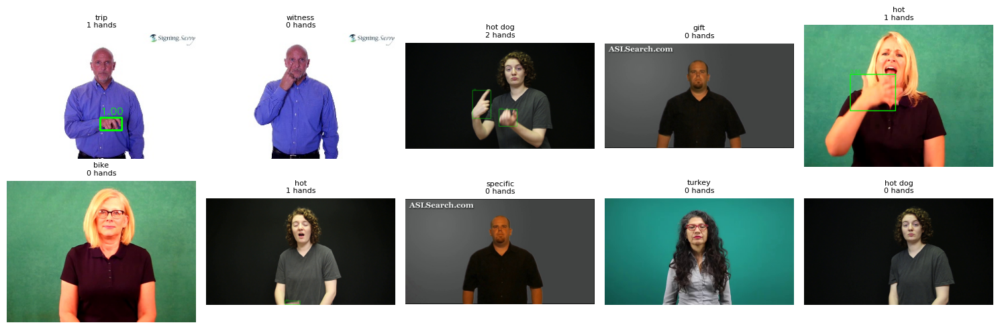

In [ ]:
import os, random, cv2, torch
import matplotlib.pyplot as plt
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# 0) Settings – adjust these paths if needed
DEVICE    = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CKPT_FPTH = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands.pth"
WLASL_DIR = "/content/drive/MyDrive/WLASL_Frames_Final"
NUM_EX    = 10  # total examples to show
THRESH    = 0.3

# 1) Load detector
model = fasterrcnn_resnet50_fpn(pretrained=False)
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, 2)
state = torch.load(CKPT_FPTH, map_location=DEVICE)
model.load_state_dict(state)
model.to(DEVICE).eval()

# 2) Gather all image paths under WLASL_DIR
all_paths = []
for root, _, files in os.walk(WLASL_DIR):
    for f in files:
        if f.lower().endswith((".jpg",".png")):
            all_paths.append(os.path.join(root, f))

assert len(all_paths) > NUM_EX, f"Not enough frames found ({len(all_paths)})"

# 3) Sample without replacement
sampled = random.sample(all_paths, NUM_EX)

# 4) Detection+visualization helper
def detect_and_draw(img_bgr):
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    tensor = F.to_tensor(img_rgb).to(DEVICE)
    with torch.no_grad():
        out = model([tensor])[0]
    boxes  = out["boxes"].cpu().numpy()
    scores = out["scores"].cpu().numpy()
    keep   = scores >= THRESH
    vis = img_bgr.copy()
    for (x1,y1,x2,y2), s in zip(boxes[keep], scores[keep]):
        cv2.rectangle(vis, (int(x1),int(y1)), (int(x2),int(y2)), (0,255,0), 2)
        cv2.putText(vis, f"{s:.2f}", (int(x1),int(y1)-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 1)
    return cv2.cvtColor(vis, cv2.COLOR_BGR2RGB), keep.sum()

# 5) Plot them
cols = 5
rows = (NUM_EX + cols-1)//cols
fig, axes = plt.subplots(rows, cols, figsize=(cols*3, rows*2.5))
axes = axes.flatten()

for ax, img_path in zip(axes, sampled):
    img = cv2.imread(img_path)
    if img is None:
        ax.set_title("Failed to read")
        ax.axis('off')
        continue
    vis, count = detect_and_draw(img)
    gloss = os.path.relpath(img_path, WLASL_DIR).split(os.sep)[0]
    ax.imshow(vis)
    ax.set_title(f"{gloss}\n{count} hands", fontsize=8)
    ax.axis('off')

# hide any unused axes
for ax in axes[len(sampled):]:
    ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
import json

# 1. Mount Drive
drive.mount('/content/drive')

# 2. Path to your JSON (adjust if it lives in a sub-folder)
json_path = '/content/drive/MyDrive/WLASL_v0.3.json'

# 3. Load and inspect
with open(json_path, 'r') as f:
    wlasl_meta = json.load(f)

print(f"Total gloss entries: {len(wlasl_meta)}\n")

# Show keys and a quick sample from the first gloss
first = wlasl_meta[0]
print("Keys in each gloss object:", list(first.keys()))
print("  gloss name:", first['gloss'])
print("  # instances:", len(first['instances']))
print("  Instance keys:", list(first['instances'][0].keys()))
print("  Sample instance:", first['instances'][0])


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Total gloss entries: 2000

Keys in each gloss object: ['gloss', 'instances']
  gloss name: book
  # instances: 40
  Instance keys: ['bbox', 'fps', 'frame_end', 'frame_start', 'instance_id', 'signer_id', 'source', 'split', 'url', 'variation_id', 'video_id']
  Sample instance: {'bbox': [385, 37, 885, 720], 'fps': 25, 'frame_end': -1, 'frame_start': 1, 'instance_id': 0, 'signer_id': 118, 'source': 'aslbrick', 'split': 'train', 'url': 'http://aslbricks.org/New/ASL-Videos/book.mp4', 'variation_id': 0, 'video_id': '69241'}


In [ ]:
from google.colab import drive
import os


# 2. Base folder for your WLASL frames
WLASL_ROOT = '/content/drive/MyDrive/WLASL_Frames_Final'

# 3. Pick a handful of glosses to inspect
sample_glosses = sorted(os.listdir(WLASL_ROOT))[:5]

for gloss in sample_glosses:
    gloss_dir = os.path.join(WLASL_ROOT, gloss)
    if not os.path.isdir(gloss_dir):
        continue
    files = sorted(os.listdir(gloss_dir))
    print(f"\n=== Gloss: {gloss}  (total files: {len(files)}) ===")
    for fn in files[:10]:
        print("  ", fn)



=== Gloss: agree  (total files: 5) ===
   01575
   01576
   01577
   01579
   01582

=== Gloss: always  (total files: 7) ===
   02228
   02229
   02230
   02231
   02233
   02238
   65061

=== Gloss: angry  (total files: 7) ===
   02565
   02566
   02567
   02568
   02569
   02572
   65072

=== Gloss: apple  (total files: 11) ===
   02999
   03000
   03001
   03002
   03003
   03005
   03008
   65084
   65085
   65086

=== Gloss: argue  (total files: 10) ===
   03267
   03268
   03270
   03272
   03273
   03274
   03277
   03278
   03282
   65092


In [ ]:
from google.colab import drive
from pathlib import Path
from PIL import Image
import json
import os

# 2. Paths
WLASL_ROOT   = Path('/content/drive/MyDrive/WLASL_Frames_Final')
META_JSON    = Path('/content/drive/MyDrive/WLASL_v0.3.json')
OUTPUT_JSON  = WLASL_ROOT / 'wlasl_coco_annotations.json'

# 3. Load WLASL JSON
with open(META_JSON, 'r') as f:
    wlasl_meta = json.load(f)

# 4. Build a lookup: gloss_name -> list of its instances
meta_lookup = { entry['gloss']: entry['instances'] for entry in wlasl_meta }

# 5. Collect only the glosses you have on disk
gloss_dirs = sorted([d.name for d in WLASL_ROOT.iterdir() if d.is_dir()])

# 6. Categories
categories = [
    {"id": i+1, "name": gloss}
    for i, gloss in enumerate(gloss_dirs)
]
cat2id = {c['name']: c['id'] for c in categories}

images = []
annotations = []
img_id = 1
ann_id = 1

# 7. Allowed image extensions
EXTS = {'.jpg', '.jpeg', '.png'}

for gloss in gloss_dirs:
    inst_list = meta_lookup.get(gloss, [])
    for inst in inst_list:
        vid = inst['video_id']
        bbox = inst['bbox']                # [x_min, y_min, x_max, y_max]
        start = inst['frame_start'] - 1    # zero-based index
        end   = inst['frame_end'] if inst['frame_end']>0 else None

        vid_dir = WLASL_ROOT / gloss / vid
        if not vid_dir.exists():
            # no frames extracted for this instance
            continue

        # list & sort all image files in this video folder
        files = sorted(f for f in os.listdir(vid_dir)
                       if Path(f).suffix.lower() in EXTS)
        # pick the correct slice of frames
        sel = files[start:end]

        for fn in sel:
            fp = vid_dir / fn
            # get actual image size
            width, height = Image.open(fp).size

            #  -- image record
            images.append({
                "id": img_id,
                "file_name": f"{gloss}/{vid}/{fn}",
                "width": width,
                "height": height
            })

            #  -- annotation record
            x0, y0, x1, y1 = bbox
            w, h = x1-x0, y1-y0
            # simple polygon mask = the box corners
            segmentation = [[x0, y0, x1, y0, x1, y1, x0, y1]]

            annotations.append({
                "id": ann_id,
                "image_id": img_id,
                "category_id": cat2id[gloss],
                "bbox": [x0, y0, w, h],
                "area": w*h,
                "iscrowd": 0,
                "segmentation": segmentation
            })

            img_id += 1
            ann_id += 1

# 8. Assemble COCO dict and write out
coco = {
    "images": images,
    "annotations": annotations,
    "categories": categories
}
with open(OUTPUT_JSON, 'w') as f:
    json.dump(coco, f, indent=2)

print(f"Wrote COCO annotations → {OUTPUT_JSON}")
print(f"  images:      {len(images)}")
print(f"  annotations: {len(annotations)}")
print(f"  categories:  {len(categories)}")


Wrote COCO annotations → /content/drive/MyDrive/WLASL_Frames_Final/wlasl_coco_annotations.json
  images:      1680
  annotations: 1680
  categories:  50


In [ ]:
import os
import torch
import numpy as np
import scipy.io
import cv2
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms as T
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask

# — EgoHandsDataset (uses polygons.mat) —
class EgoHandsDataset(Dataset):
    def __init__(self, root, split='train', transforms=None):
        self.root       = root
        self.split      = split
        self.img_dir    = os.path.join(root, split)
        self.polygons   = scipy.io.loadmat(os.path.join(root, 'polygons.mat'))['polygons'][0]
        self.imgs       = sorted(f for f in os.listdir(self.img_dir) if f.endswith('.jpg'))
        self.transforms = transforms

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.imgs[idx])
        img      = Image.open(img_path).convert("RGB")

        # build binary mask
        poly = self.polygons[idx]
        mask = np.zeros((img.height, img.width), dtype=np.uint8)
        pts  = np.array(poly, dtype=np.int32).reshape(-1,2)
        cv2.fillPoly(mask, [pts], 1)

        x0, y0 = pts[:,0].min(), pts[:,1].min()
        x1, y1 = pts[:,0].max(), pts[:,1].max()

        target = {
            "boxes":    torch.tensor([[x0, y0, x1, y1]], dtype=torch.float32),
            "labels":   torch.ones((1,),           dtype=torch.int64),
            "masks":    torch.tensor(mask[None,:,:], dtype=torch.uint8),
            "image_id": torch.tensor([idx]),
            "area":     torch.tensor([(x1-x0)*(y1-y0)], dtype=torch.float32),
            "iscrowd":  torch.zeros((1,),         dtype=torch.int64)
        }

        if self.transforms:
            img, target = self.transforms(img, target)
        return img, target

# — WLASLDataset (uses COCO JSON) —
class WLASLDataset(Dataset):
    def __init__(self, root, ann_file, transforms=None):
        self.root      = root
        self.coco      = COCO(ann_file)
        self.ids       = list(self.coco.imgs.keys())
        self.transforms= transforms

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_info = self.coco.loadImgs(self.ids[idx])[0]
        path     = os.path.join(self.root, img_info['file_name'])
        img      = Image.open(path).convert("RGB")

        ann_ids  = self.coco.getAnnIds(imgIds=img_info['id'])
        anns     = self.coco.loadAnns(ann_ids)

        boxes, masks, labels, areas, iscrowd = [], [], [], [], []
        for ann in anns:
            x,y,w,h = ann['bbox']
            boxes.append([x,y,x+w,y+h])
            labels.append(ann['category_id'])
            areas.append(ann['area'])
            iscrowd.append(ann.get('iscrowd',0))

            segm = ann['segmentation']
            mask = coco_mask.decode(segm)
            if mask.ndim==3: mask = mask[:,:,0]
            masks.append(mask)

        target = {
            "boxes":    torch.tensor(boxes,   dtype=torch.float32),
            "labels":   torch.tensor(labels,  dtype=torch.int64),
            "masks":    torch.tensor(masks,   dtype=torch.uint8),
            "image_id": torch.tensor([img_info['id']]),
            "area":     torch.tensor(areas,   dtype=torch.float32),
            "iscrowd":  torch.tensor(iscrowd,dtype=torch.int64)
        }

        if self.transforms:
            img, target = self.transforms(img, target)
        return img, target


In [ ]:
# 1) Mount your Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# 2) Paths for EgoHands COCO
EGO_ROOT       = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco"
EGO_TRAIN_ANN  = f"{EGO_ROOT}/train/_annotations.coco.json"
EGO_VALID_ANN  = f"{EGO_ROOT}/valid/_annotations.coco.json"

# 3) Define a generic COCO Dataset (same as WLASL but with paths swapped)
import os, torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask
import torchvision.transforms as T

class CocoSegDataset(Dataset):
    def __init__(self, root, ann_file, transforms=None):
        """
        root: folder with images (train/ or valid/)
        ann_file: corresponding _annotations.coco.json
        """
        self.root   = root
        self.coco   = COCO(ann_file)
        self.ids    = list(self.coco.imgs.keys())
        self.transforms = transforms

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_info = self.coco.loadImgs(self.ids[idx])[0]
        img_path = os.path.join(self.root, img_info['file_name'])
        img      = Image.open(img_path).convert("RGB")

        ann_ids  = self.coco.getAnnIds(imgIds=img_info['id'])
        anns     = self.coco.loadAnns(ann_ids)

        boxes, masks, labels, areas, iscrowd = [], [], [], [], []
        for ann in anns:
            x,y,w,h = ann['bbox']
            boxes.append([x, y, x+w, y+h])
            labels.append(ann['category_id'])
            areas.append(ann['area'])
            iscrowd.append(ann.get('iscrowd', 0))

            segm = ann['segmentation']
            mask = coco_mask.decode(segm)
            if mask.ndim == 3:
                mask = mask[:,:,0]
            masks.append(mask)

        target = {
            "boxes":    torch.tensor(boxes,  dtype=torch.float32),
            "labels":   torch.tensor(labels, dtype=torch.int64),
            "masks":    torch.tensor(masks,  dtype=torch.uint8),
            "image_id": torch.tensor([img_info['id']]),
            "area":     torch.tensor(areas,  dtype=torch.float32),
            "iscrowd":  torch.tensor(iscrowd, dtype=torch.int64)
        }

        if self.transforms:
            img, target = self.transforms(img, target)
        return img, target

# 4) Transforms & DataLoaders
def get_transform(train):
    t = [T.ToTensor()]
    if train: t.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(t)

# EgoHands loaders
ego_train_ds = CocoSegDataset(os.path.join(EGO_ROOT, "train"),
                              EGO_TRAIN_ANN,
                              transforms=get_transform(True))
ego_val_ds   = CocoSegDataset(os.path.join(EGO_ROOT, "valid"),
                              EGO_VALID_ANN,
                              transforms=get_transform(False))

from torch.utils.data import DataLoader
train_loader = DataLoader(ego_train_ds, batch_size=2, shuffle=True,
                          collate_fn=lambda x: tuple(zip(*x)))
val_loader   = DataLoader(ego_val_ds,   batch_size=2, shuffle=False,
                          collate_fn=lambda x: tuple(zip(*x)))

print("EgoHands train size:", len(ego_train_ds))
print("EgoHands valid size:", len(ego_val_ds))


Mounted at /content/drive
loading annotations into memory...
Done (t=0.70s)
creating index...
index created!
loading annotations into memory...
Done (t=0.48s)
creating index...
index created!
EgoHands train size: 3840
EgoHands valid size: 480


In [ ]:
import sys, os

# Ensure /content is on the import path
if '/content' not in sys.path:
    sys.path.insert(0, '/content')

# Now these should import without errors:
from engine import train_one_epoch, evaluate
import transforms  # this pulls in the detection transforms helper

print("✅ All detection reference modules imported successfully")


✅ All detection reference modules imported successfully


In [ ]:
import sys
# Ensure /content is on the import path
if '/content' not in sys.path:
    sys.path.insert(0, '/content')

# Now these imports will succeed
from engine import train_one_epoch, evaluate
import transforms

print("✅ Reference modules imported successfully")


✅ Reference modules imported successfully


In [ ]:
import os
import torch
import numpy as np
from torch.utils.data import Dataset
from PIL import Image
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask
# Use the detection‐style transforms that accept (image, target).
import transforms as T

class CocoSegDataset(Dataset):
    def __init__(self, root, ann_file, transforms=None):
        self.root       = root
        self.coco       = COCO(ann_file)
        self.ids        = list(self.coco.imgs.keys())
        self.transforms = transforms

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        # Load image
        img_info = self.coco.loadImgs(self.ids[idx])[0]
        img_path = os.path.join(self.root, img_info['file_name'])
        img      = Image.open(img_path).convert("RGB")
        width, height = img.size

        # Load annotations
        ann_ids = self.coco.getAnnIds(imgIds=img_info['id'])
        anns    = self.coco.loadAnns(ann_ids)

        boxes, masks, labels, areas, iscrowd = [], [], [], [], []
        for ann in anns:
            x, y, w, h = ann['bbox']
            boxes.append([x, y, x + w, y + h])
            labels.append(ann['category_id'])
            areas.append(ann['area'])
            iscrowd.append(ann.get('iscrowd', 0))

            segm = ann.get('segmentation', [])
            if not segm:
                # fallback to a rectangular mask from bbox
                m = np.zeros((height, width), dtype=np.uint8)
                x0, y0, x1, y1 = int(x), int(y), int(x + w), int(y + h)
                m[y0:y1, x0:x1] = 1
            else:
                m = coco_mask.decode(segm)
                # decode returns H×W×N for polygon lists; take first mask if N>1
                if m.ndim == 3:
                    m = m[:, :, 0]
            masks.append(m)

        target = {
            "boxes":    torch.tensor(boxes,  dtype=torch.float32),
            "labels":   torch.tensor(labels, dtype=torch.int64),
            "masks":    torch.tensor(masks,  dtype=torch.uint8),
            "image_id": torch.tensor([img_info['id']]),
            "area":     torch.tensor(areas,  dtype=torch.float32),
            "iscrowd":  torch.tensor(iscrowd, dtype=torch.int64)
        }

        if self.transforms:
            img, target = self.transforms(img, target)
        return img, target


In [ ]:
from torchvision.transforms import functional as F

def get_transform(train):
    """
    Returns a function that takes (image, target) and returns (tensor_image, target).
    No Compose, no 3rd argument—just ToTensor.
    """
    def transform(image, target):
        # PIL → Tensor
        image = F.to_tensor(image)
        # (Optionally add flips or other image+target ops here)
        return image, target

    return transform


In [ ]:
import os, sys, torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms.functional as F
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask
from torchvision.models.detection import maskrcnn_resnet50_fpn

# Make sure Colab sees our reference scripts
if '/content' not in sys.path:
    sys.path.insert(0, '/content')
from engine import train_one_epoch, evaluate

# Update these if you stored your folder elsewhere
EGO_ROOT   = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco"
TRAIN_IMG  = os.path.join(EGO_ROOT, "train")
VALID_IMG  = os.path.join(EGO_ROOT, "valid")
TRAIN_ANN  = os.path.join(TRAIN_IMG, "_annotations.coco.json")
VALID_ANN  = os.path.join(VALID_IMG, "_annotations.coco.json")


In [ ]:
class CocoSegDataset(Dataset):
    def __init__(self, img_root, ann_file):
        self.img_root = img_root
        self.coco     = COCO(ann_file)
        # Keep only IMG IDs that actually have ≥1 annotation
        all_ids = list(self.coco.imgs.keys())
        self.ids  = [i for i in all_ids if len(self.coco.getAnnIds(imgIds=i)) > 0]

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id   = self.ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_root, img_info['file_name'])
        img      = Image.open(img_path).convert("RGB")
        w, h     = img.size

        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns    = self.coco.loadAnns(ann_ids)

        boxes, masks, labels, areas, iscrowd = [], [], [], [], []
        for ann in anns:
            x, y, w_box, h_box = ann['bbox']
            boxes.append([x, y, x + w_box, y + h_box])
            labels.append(ann['category_id'])
            areas.append(ann['area'])
            iscrowd.append(ann.get('iscrowd', 0))

            segm = ann.get('segmentation', [])
            if not segm:
                # fallback rectangular mask
                m = torch.zeros((h, w), dtype=torch.uint8)
                x0,y0,x1,y1 = int(x),int(y),int(x+w_box),int(y+h_box)
                m[y0:y1, x0:x1] = 1
            else:
                np_mask = coco_mask.decode(segm)
                if np_mask.ndim == 3:
                    np_mask = np_mask[...,0]
                m = torch.as_tensor(np_mask, dtype=torch.uint8)
            masks.append(m)

        target = {
            "boxes":    torch.tensor(boxes, dtype=torch.float32),
            "labels":   torch.tensor(labels, dtype=torch.int64),
            "masks":    torch.stack(masks),
            "image_id": torch.tensor([img_id]),
            "area":     torch.tensor(areas, dtype=torch.float32),
            "iscrowd":  torch.tensor(iscrowd, dtype=torch.int64)
        }

        img_tensor = F.to_tensor(img)
        return img_tensor, target


In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_ds = CocoSegDataset(TRAIN_IMG, TRAIN_ANN)
val_ds   = CocoSegDataset(VALID_IMG, VALID_ANN)

train_loader = DataLoader(train_ds, batch_size=2, shuffle=True,
                          collate_fn=collate_fn)
val_loader   = DataLoader(val_ds,   batch_size=2, shuffle=False,
                          collate_fn=collate_fn)

print("Train samples:", len(train_ds), "Validation samples:", len(val_ds))


loading annotations into memory...
Done (t=0.18s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Train samples: 3830 Validation samples: 479


In [ ]:
# Cell 5: DataLoaders with subsampled IDs for fast iteration

from torch.utils.data import DataLoader

# 1) Subsample the first 500 train and 100 val images
train_ds.ids = train_ds.ids[:500]
val_ds.ids   = val_ds.ids[:100]

print(f"→ Subsampled to {len(train_ds)} train and {len(val_ds)} val images")

# 2) Collate function
def collate_fn(batch):
    return tuple(zip(*batch))

# 3) Rebuild DataLoaders (batch size 2 as before)
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True,  collate_fn=collate_fn)
val_loader   = DataLoader(val_ds,   batch_size=2, shuffle=False, collate_fn=collate_fn)

print("Batches/epoch:", len(train_loader))


→ Subsampled to 500 train and 100 val images
Batches/epoch: 250


In [ ]:
# Cell 6: Model & Training Loop (runs on the subsampled data now)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# (Re‐instantiate model if you restarted the runtime, otherwise skip to training)
model = maskrcnn_resnet50_fpn(pretrained=True).to(device)
optimizer    = torch.optim.SGD([p for p in model.parameters() if p.requires_grad],
                               lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

num_epochs = 15
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=10)
    lr_scheduler.step()
    #evaluate(model, val_loader, device=device)

# (Optionally save, or skip since this is just a smoke test)


Epoch: [0]  [  0/250]  eta: 0:00:39  lr: 0.000025  loss: 2.7720 (2.7720)  loss_classifier: 0.6082 (0.6082)  loss_box_reg: 0.1490 (0.1490)  loss_mask: 1.8787 (1.8787)  loss_objectness: 0.1286 (0.1286)  loss_rpn_box_reg: 0.0075 (0.0075)  time: 0.1593  data: 0.0441  max mem: 3811
Epoch: [0]  [ 10/250]  eta: 0:00:33  lr: 0.000226  loss: 2.7480 (2.7236)  loss_classifier: 0.9268 (0.9270)  loss_box_reg: 0.2252 (0.2295)  loss_mask: 1.4254 (1.4837)  loss_objectness: 0.0524 (0.0643)  loss_rpn_box_reg: 0.0178 (0.0191)  time: 0.1391  data: 0.0340  max mem: 3857
Epoch: [0]  [ 20/250]  eta: 0:00:31  lr: 0.000426  loss: 1.8893 (2.1734)  loss_classifier: 0.8375 (0.8195)  loss_box_reg: 0.2428 (0.2467)  loss_mask: 0.7218 (1.0249)  loss_objectness: 0.0344 (0.0665)  loss_rpn_box_reg: 0.0124 (0.0158)  time: 0.1368  data: 0.0326  max mem: 3984
Epoch: [0]  [ 30/250]  eta: 0:00:29  lr: 0.000627  loss: 1.1493 (1.7869)  loss_classifier: 0.4759 (0.6732)  loss_box_reg: 0.2289 (0.2338)  loss_mask: 0.3984 (0.8087) 

In [ ]:
import torch
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

# 1) Build the 2-class Mask R-CNN architecture
num_classes = 2  # background + hand
model = maskrcnn_resnet50_fpn(pretrained=True)

# Replace box head
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, num_classes)

# Replace mask head
in_mask_feats = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256
model.roi_heads.mask_predictor = MaskRCNNPredictor(
    in_mask_feats, hidden_layer, num_classes
)

# 2) Load your checkpoint with strict=False
EGO_CKPT = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands.pth"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

checkpoint = torch.load(EGO_CKPT, map_location=device)
model.load_state_dict(checkpoint, strict=False)  # <— allow missing mask keys
model.to(device)
model.eval()

print("✅ Checkpoint loaded (mask head left at default initialization).")


✅ Checkpoint loaded (mask head left at default initialization).


In [ ]:
from pathlib import Path
from PIL import Image
import torchvision.transforms.functional as F

WLASL_ROOT      = "/content/drive/MyDrive/WLASL_Frames_Final"
WLASL_CROP_ROOT = "/content/drive/MyDrive/WLASL_Hand_Crops_Detector"
THRESH          = 0.5

for img_path in Path(WLASL_ROOT).rglob("*.jpg"):
    img   = Image.open(img_path).convert("RGB")
    tensor = F.to_tensor(img).to(device)
    with torch.no_grad():
        preds = model([tensor])[0]

    keep = preds['scores'] > THRESH
    boxes = preds['boxes'][keep].cpu().numpy()

    rel = img_path.relative_to(WLASL_ROOT)
    for i,(x0,y0,x1,y1) in enumerate(boxes.astype(int)):
        crop = img.crop((x0,y0,x1,y1))
        outp = Path(WLASL_CROP_ROOT)/rel.parent/f"{rel.stem}_crop{i}.jpg"
        outp.parent.mkdir(parents=True, exist_ok=True)
        crop.save(str(outp))


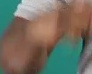

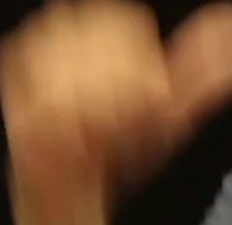

In [ ]:
from PIL import Image
from IPython.display import display

sample_path = "/content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/agree/01579/frame_002_crop0.jpg"
sample_path1 = "/content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/apple/65084/frame_003_crop0.jpg"
sample_path2 = "/content/drive/MyDrive/WLASL_Hand_Crops_Detector_all/bar/05087/frame_002_crop0.jpg"



img1 = Image.open(sample_path1)
img2 = Image.open(sample_path2)
img = Image.open(sample_path)
display(img)
display(img1)
display(img2)

In [ ]:
import os, sys, torch
from torch.utils.data import DataLoader
from PIL import Image
import torchvision.transforms.functional as F
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# 1) Paths
EGO_ROOT   = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco"
VALID_IMG  = os.path.join(EGO_ROOT, "valid")
VALID_ANN  = os.path.join(VALID_IMG, "_annotations.coco.json")
EGO_CKPT   = os.path.join(EGO_ROOT, "best_frcnn_egohands.pth")

# 2) Build model architecture (2 classes) and load checkpoint
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = maskrcnn_resnet50_fpn(pretrained=True)

# Replace heads for 2 classes
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, 2)
in_mask_feats = model.roi_heads.mask_predictor.conv5_mask.in_channels
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_mask_feats, 256, 2)

# Load your trained weights (strict=False to ignore missing mask params)
ckpt = torch.load(EGO_CKPT, map_location=device)
model.load_state_dict(ckpt, strict=False)
model.to(device).eval()

# 3) Prepare a simple dataset and loader (only for images + image_id)
class BboxEvalDataset(torch.utils.data.Dataset):
    def __init__(self, img_root, ann_file):
        self.img_root = img_root
        self.coco     = COCO(ann_file)
        self.ids      = list(self.coco.imgs.keys())

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id   = self.ids[idx]
        info     = self.coco.loadImgs(img_id)[0]
        path     = os.path.join(self.img_root, info['file_name'])
        img      = Image.open(path).convert("RGB")
        return F.to_tensor(img), img_id

# DataLoader
val_ds     = BboxEvalDataset(VALID_IMG, VALID_ANN)
val_loader = DataLoader(val_ds, batch_size=2, shuffle=False,
                        collate_fn=lambda batch: tuple(zip(*batch)))

# 4) Run inference & collect detections
coco_gt = COCO(VALID_ANN)
detections = []
TH = 0.5
for imgs, ids in val_loader:
    imgs = list(img.to(device) for img in imgs)
    with torch.no_grad():
        preds = model(imgs)
    for img_id, pred in zip(ids, preds):
        keep = pred['scores'] > TH
        boxes = pred['boxes'][keep].cpu().numpy()
        scores= pred['scores'][keep].cpu().numpy()
        for (x0,y0,x1,y1), score in zip(boxes, scores):
            detections.append({
                "image_id": int(img_id),
                "category_id": 1,            # hand class
                "bbox": [float(x0), float(y0), float(x1-x0), float(y1-y0)],
                "score": float(score)
            })

# 5) Evaluate with COCOeval (bbox only)
coco_dt  = coco_gt.loadRes(detections)
cocoEval = COCOeval(coco_gt, coco_dt, iouType="bbox")
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()


loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.47s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.039
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.051
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.046
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.072
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.049
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.041
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.050
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxD

In [ ]:
import os, sys, torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms.functional as F
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from engine import train_one_epoch  # only training helper

# Mount & paths (if needed)
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
EGO_ROOT   = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco"
TRAIN_IMG  = os.path.join(EGO_ROOT, "train")
VALID_IMG  = os.path.join(EGO_ROOT, "valid")
TRAIN_ANN  = os.path.join(TRAIN_IMG, "_annotations.coco.json")
VALID_ANN  = os.path.join(VALID_IMG, "_annotations.coco.json")

# Dataset filtering empty/degenerate boxes
class EgoHandsDataset(Dataset):
    def __init__(self, img_root, ann_file):
        self.img_root = img_root
        self.coco     = COCO(ann_file)
        self.ids      = []
        for i in self.coco.getImgIds():
            anns = self.coco.loadAnns(self.coco.getAnnIds(imgIds=i))
            if any(a['bbox'][2]>0 and a['bbox'][3]>0 for a in anns):
                self.ids.append(i)
    def __len__(self): return len(self.ids)
    def __getitem__(self, idx):
        img_id = self.ids[idx]
        info   = self.coco.loadImgs(img_id)[0]
        img    = Image.open(os.path.join(self.img_root, info['file_name'])).convert("RGB")
        w,h    = img.size
        ann_ids= self.coco.getAnnIds(imgIds=img_id)
        anns   = self.coco.loadAnns(ann_ids)
        boxes, masks, labels, areas, iscrowd = [], [], [], [], []
        for a in anns:
            x,y,wb,hb = a['bbox']
            if wb<=0 or hb<=0: continue
            boxes.append([x,y,x+wb,y+hb])
            labels.append(1)
            areas.append(a['area'])
            iscrowd.append(a.get('iscrowd',0))
            segm = a.get('segmentation',[])
            if segm:
                m_np = coco_mask.decode(segm)
                if m_np.ndim==3: m_np = m_np[...,0]
                m = torch.as_tensor(m_np, dtype=torch.uint8)
            else:
                m = torch.zeros((h,w), dtype=torch.uint8)
                m[int(y):int(y+hb), int(x):int(x+wb)] = 1
            masks.append(m)
        target = {
            "boxes":    torch.tensor(boxes, dtype=torch.float32),
            "labels":   torch.tensor(labels, dtype=torch.int64),
            "masks":    torch.stack(masks),
            "image_id": torch.tensor([img_id]),
            "area":     torch.tensor(areas, dtype=torch.float32),
            "iscrowd":  torch.tensor(iscrowd, dtype=torch.int64)
        }
        return F.to_tensor(img), target

# DataLoaders
train_ds = EgoHandsDataset(TRAIN_IMG, TRAIN_ANN)
val_ds   = EgoHandsDataset(VALID_IMG, VALID_ANN)
collate_fn = lambda b: tuple(zip(*b))
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True,  collate_fn=collate_fn)
val_loader   = DataLoader(val_ds,   batch_size=2, shuffle=False, collate_fn=collate_fn)

# Model + heads
device = torch.device('cuda')
model = maskrcnn_resnet50_fpn(pretrained=True)
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, 2)
in_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_mask, 256, 2)
model.to(device)

# Optimizer & LR scheduler
params       = [p for p in model.parameters() if p.requires_grad]
optimizer    = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# Train 10 epochs (no evaluation inside loop)
num_epochs = 10
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=50)
    lr_scheduler.step()

# Save checkpoint
torch.save(model.state_dict(),
           os.path.join(EGO_ROOT, "best_frcnn_egohands_10ep.pth"))
print("✅ Training complete (10 epochs).")


Mounted at /content/drive
loading annotations into memory...
Done (t=0.18s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Epoch: [0]  [   0/1915]  eta: 0:07:01  lr: 0.000010  loss: 3.3322 (3.3322)  loss_classifier: 0.7176 (0.7176)  loss_box_reg: 0.4429 (0.4429)  loss_mask: 2.1472 (2.1472)  loss_objectness: 0.0115 (0.0115)  loss_rpn_box_reg: 0.0131 (0.0131)  time: 0.2200  data: 0.0388  max mem: 2761
Epoch: [0]  [  50/1915]  eta: 0:05:57  lr: 0.000260  loss: 1.1188 (1.6685)  loss_classifier: 0.2658 (0.3855)  loss_box_reg: 0.3276 (0.3197)  loss_mask: 0.4236 (0.8760)  loss_objectness: 0.0239 (0.0687)  loss_rpn_box_reg: 0.0121 (0.0186)  time: 0.1882  data: 0.0293  max mem: 2928
Epoch: [0]  [ 100/1915]  eta: 0:05:47  lr: 0.000509  loss: 0.8818 (1.3264)  loss_classifier: 0.1502 (0.2959)  loss_box_reg: 0.3990 (0.3594)  loss_mask: 0.3032 (0.6069)  loss_objectness: 0.0107 (0.0492)  loss_rpn_box_reg: 0.0074 (0.0150)  time: 0.19

In [ ]:
import os, sys, torch
from pathlib import Path
from PIL import Image
import torchvision.transforms.functional as F
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

# 1) Mount Drive (if not already)
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# 2) Paths
EGO_ROOT       = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco"
CKPT           = os.path.join(EGO_ROOT, "best_frcnn_egohands_10ep.pth")
WLASL_ROOT     = "/content/drive/MyDrive/WLASL_Frames_Final"
OUTPUT_CROPDIR = "/content/drive/MyDrive/WLASL_Hand_Crops"

os.makedirs(OUTPUT_CROPDIR, exist_ok=True)

# 3) Build model and load your 2-class checkpoint
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model  = maskrcnn_resnet50_fpn(pretrained=True)
# box head
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, 2)
# mask head (unused here but needed for state_dict)
in_mask_feats = model.roi_heads.mask_predictor.conv5_mask.in_channels
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_mask_feats, 256, 2)
model.load_state_dict(torch.load(CKPT, map_location=device), strict=False)
model.to(device).eval()

# 4) Inference loop: crop and save
THRESH = 0.5
for img_path in Path(WLASL_ROOT).rglob("*.jpg"):
    img = Image.open(img_path).convert("RGB")
    tensor = F.to_tensor(img).to(device)
    with torch.no_grad():
        pred = model([tensor])[0]

    keep = pred['scores'] > THRESH
    boxes = pred['boxes'][keep].cpu().numpy()

    rel = img_path.relative_to(WLASL_ROOT)
    out_dir = Path(OUTPUT_CROPDIR) / rel.parent
    out_dir.mkdir(parents=True, exist_ok=True)

    for i, (x0,y0,x1,y1) in enumerate(boxes.astype(int)):
        crop = img.crop((x0,y0,x1,y1))
        crop.save(out_dir / f"{rel.stem}_crop{i}.jpg")

print("✅ WLASL hand crops saved to", OUTPUT_CROPDIR)


Mounted at /content/drive
✅ WLASL hand crops saved to /content/drive/MyDrive/WLASL_Hand_Crops


The next step is to train your Mask R-CNN on the WLASL subset using the COCO annotations you already generated (wlasl_coco_annotations.json) and the hand‐cropped frames.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os, sys, torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms.functional as F
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from engine import train_one_epoch, evaluate  # ensure you have engine.py under /content

# Paths to WLASL frames + their COCO annotations
WLASL_ROOT      = "/content/drive/MyDrive/WLASL_Frames_Final"
WLASL_COCO_JSON = os.path.join(WLASL_ROOT, "wlasl_coco_annotations.json")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Cell B′ – Clean split so train_ds and val_ds both have .coco

import os, torch
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import torchvision.transforms.functional as F
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask
import random

WLASL_ROOT      = "/content/drive/MyDrive/WLASL_Frames_Final"
WLASL_COCO_JSON = os.path.join(WLASL_ROOT, "wlasl_coco_annotations.json")

from pycocotools import mask as coco_mask

from pycocotools import mask as coco_mask

class WlaslSegDataset(torch.utils.data.Dataset):
    def __init__(self, img_root, ann_file, ids=None):
        self.img_root = img_root
        self.coco     = COCO(ann_file)
        if ids is None:
            ids = [img["id"] for img in self.coco.dataset["images"]]
        self.ids = ids

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id   = self.ids[idx]
        info     = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_root, info["file_name"])
        img      = Image.open(img_path).convert("RGB")
        w, h     = img.size

        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns    = self.coco.loadAnns(ann_ids)

        boxes, masks, labels, areas, iscrowd = [], [], [], [], []
        for ann in anns:
            x,y,w_box,h_box = ann["bbox"]
            boxes.append([x, y, x + w_box, y + h_box])
            labels.append(ann["category_id"])
            areas.append(ann["area"])
            iscrowd.append(ann.get("iscrowd", 0))

            segm = ann["segmentation"]
            # convert polygon to RLE if needed
            if isinstance(segm, list):
                # segm is list of polygons; one RLE per polygon
                rles = coco_mask.frPyObjects(segm, h, w)
                m_np = coco_mask.decode(rles)
                # decode returns (H,W,#polys), take union
                if m_np.ndim == 3:
                    m_np = m_np.sum(axis=2).clip(0,1)
            else:
                # already RLE
                m_np = coco_mask.decode(segm)
            masks.append(torch.as_tensor(m_np, dtype=torch.uint8))

        target = {
            "boxes":    torch.tensor(boxes, dtype=torch.float32),
            "labels":   torch.tensor(labels, dtype=torch.int64),
            "masks":    torch.stack(masks),
            "image_id": torch.tensor([img_id]),
            "area":     torch.tensor(areas, dtype=torch.float32),
            "iscrowd":  torch.tensor(iscrowd, dtype=torch.int64),
        }

        return F.to_tensor(img), target


# Build full list of IDs
full_ds = WlaslSegDataset(WLASL_ROOT, WLASL_COCO_JSON)
all_ids = full_ds.ids.copy()
random.seed(42)
random.shuffle(all_ids)

# Manual 80/20 split of IDs
n_train   = int(0.8 * len(all_ids))
train_ids = all_ids[:n_train]
val_ids   = all_ids[n_train:]

# Instantiate two independent datasets
train_ds = WlaslSegDataset(WLASL_ROOT, WLASL_COCO_JSON, ids=train_ids)
val_ds   = WlaslSegDataset(WLASL_ROOT, WLASL_COCO_JSON, ids=val_ids)

# DataLoaders
collate_fn    = lambda b: tuple(zip(*b))
train_loader  = DataLoader(train_ds, batch_size=2, shuffle=True,  collate_fn=collate_fn)
val_loader    = DataLoader(val_ds,   batch_size=2, shuffle=False, collate_fn=collate_fn)

print(f"Train: {len(train_ds)} samples → {len(train_loader)} batches")
print(f"Val:   {len(val_ds)} samples → {len(val_loader)} batches")


loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Train: 1344 samples → 672 batches
Val:   336 samples → 168 batches


In [ ]:
# Cell C′ – Model & Training Loop (5 epochs) using train_ds / val_ds

import os, torch
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from engine import train_one_epoch, evaluate

# 1) Determine number of classes
num_classes = len(train_ds.coco.getCatIds()) + 1  # +1 background
print("→ num_classes:", num_classes)

# 2) Build Mask R-CNN
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model  = maskrcnn_resnet50_fpn(pretrained=True)

# Swap box head
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, num_classes)

# Swap mask head
in_mask_feats = model.roi_heads.mask_predictor.conv5_mask.in_channels
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_mask_feats, 256, num_classes)

model.to(device)

# 3) Optimizer & LR Scheduler
params       = [p for p in model.parameters() if p.requires_grad]
optimizer    = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# 4) Training loop
num_epochs = 5
for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=10)
    lr_scheduler.step()
   # evaluate(model, val_loader, device=device)

# 5) Save checkpoint
SAVE_PATH = os.path.join(WLASL_ROOT, "wlasl_maskrcnn_5ep.pth")
torch.save(model.state_dict(), SAVE_PATH)
print("✅ Training complete; checkpoint at", SAVE_PATH)


→ num_classes: 51
Epoch: [0]  [  0/672]  eta: 0:02:00  lr: 0.000012  loss: 4.9725 (4.9725)  loss_classifier: 3.8155 (3.8155)  loss_box_reg: 0.0973 (0.0973)  loss_mask: 1.0562 (1.0562)  loss_objectness: 0.0004 (0.0004)  loss_rpn_box_reg: 0.0031 (0.0031)  time: 0.1790  data: 0.0099  max mem: 3110
Epoch: [0]  [ 10/672]  eta: 0:01:55  lr: 0.000087  loss: 4.8572 (4.9705)  loss_classifier: 3.6094 (3.5433)  loss_box_reg: 0.1356 (0.1395)  loss_mask: 1.1155 (1.2817)  loss_objectness: 0.0009 (0.0011)  loss_rpn_box_reg: 0.0029 (0.0049)  time: 0.1740  data: 0.0185  max mem: 3202
Epoch: [0]  [ 20/672]  eta: 0:01:53  lr: 0.000161  loss: 3.9628 (3.8391)  loss_classifier: 2.6596 (2.4845)  loss_box_reg: 0.1445 (0.1442)  loss_mask: 1.1202 (1.2042)  loss_objectness: 0.0009 (0.0011)  loss_rpn_box_reg: 0.0037 (0.0052)  time: 0.1741  data: 0.0215  max mem: 3202
Epoch: [0]  [ 30/672]  eta: 0:01:51  lr: 0.000236  loss: 1.4787 (3.0338)  loss_classifier: 0.2365 (1.7461)  loss_box_reg: 0.1475 (0.1448)  loss_mask

In [ ]:
# --- Cell: Safe COCO-style evaluation on your 336-image WLASL validation subset ---

import os, torch
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import torchvision.transforms.functional as F
from PIL import Image

# 1) Paths
WLASL_ROOT      = "/content/drive/MyDrive/WLASL_Frames_Final"
WLASL_COCO_JSON = os.path.join(WLASL_ROOT, "wlasl_coco_annotations.json")
CKPT_PATH       = os.path.join(WLASL_ROOT, "wlasl_maskrcnn_5ep.pth")

# 2) Load your trained model
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model  = maskrcnn_resnet50_fpn(pretrained=True)

# swap heads for 50 glosses + background = 51
in_feats = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, 51)
in_mask_feats  = model.roi_heads.mask_predictor.conv5_mask.in_channels
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_mask_feats, 256, 51)

model.load_state_dict(torch.load(CKPT_PATH, map_location=device), strict=False)
model.to(device).eval()

# 3) Build GT COCO for only your val IDs
coco_full = COCO(WLASL_COCO_JSON)
all_ids   = [img['id'] for img in coco_full.dataset['images']]
val_ids   = all_ids[int(0.8*len(all_ids)):]  # same split as training

imgs_keep = [img for img in coco_full.dataset['images']      if img['id'] in val_ids]
anns_keep = [ann for ann in coco_full.dataset['annotations'] if ann['image_id'] in val_ids]
gt_subset = {'images': imgs_keep, 'annotations': anns_keep, 'categories': coco_full.dataset['categories']}

coco_gt = COCO()
coco_gt.dataset = gt_subset
coco_gt.createIndex()

# 4) Run inference over the val set
detections = []
TH = 0.05  # lower threshold so we get at least some boxes
for img_info in imgs_keep:
    img_id   = img_info['id']
    img_path = os.path.join(WLASL_ROOT, img_info['file_name'])
    img      = Image.open(img_path).convert("RGB")
    tensor   = F.to_tensor(img).to(device)
    with torch.no_grad():
        pred = model([tensor])[0]

    keep = (pred['scores'] > TH).cpu().numpy()
    boxes = pred['boxes'][keep].cpu().numpy()
    scores= pred['scores'][keep].cpu().numpy()
    labels= pred['labels'][keep].cpu().numpy()
    for (x0,y0,x1,y1), score, label in zip(boxes, scores, labels):
        detections.append({
            'image_id': int(img_id),
            'category_id': int(label),
            'bbox': [float(x0), float(y0), float(x1-x0), float(y1-y0)],
            'score': float(score)
        })

# 5) Only run COCOeval if we have detections
if len(detections) == 0:
    print("⚠️ No detections above threshold; try lowering THRESH.")
else:
    coco_dt   = coco_gt.loadRes(detections)
    coco_eval = COCOeval(coco_gt, coco_dt, iouType='bbox')
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()


loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.36s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.044
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.049
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.049
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.044
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.107
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.107
 Average Recall     (AR) @[ Io

In [ ]:
import numpy as np
from pycocotools.cocoeval import COCOeval

# 1) Re‐run COCOeval at IoU=0.5 only
cocoEval = COCOeval(coco_gt, coco_dt, iouType='bbox')
cocoEval.params.iouThrs     = [0.5]     # only IoU=0.5
cocoEval.params.maxDets     = [100]
cocoEval.params.useCats     = 1
cocoEval.evaluate()
cocoEval.accumulate()

# 2) Extract precision array
#   precision has shape [T, R, K, A, M]: here T=1 IoU, R=101 recall thresholds, K=1 cat, A=1 area, M=1 maxDets
prec = cocoEval.eval['precision'][0, :, 0, 0, 0]

# 3) Compute “detection rate” at the lowest recall threshold
#    (this is TP / GT for IoU≥.5, assuming score threshold of 0)
detection_rate = prec[0]  # recall at recallThresh=0
average_recall = np.mean(prec)  # mean recall across all recall thresholds

print(f"Detection rate @ IoU=0.5: {detection_rate:.3f}")
print(f"Average recall @ IoU=0.5: {average_recall:.3f}")


Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.36s).
Accumulating evaluation results...
DONE (t=0.02s).
Detection rate @ IoU=0.5: -1.000
Average recall @ IoU=0.5: -1.000


In [ ]:
import numpy as np

# 1) Build per-image GT boxes
gt_by_img = {}
for ann in gt_subset['annotations']:
    gt_by_img.setdefault(ann['image_id'], []).append(ann['bbox'])  # [x,y,w,h]

# 2) Build per-image predicted boxes
pred_by_img = {}
for det in detections:
    pred_by_img.setdefault(det['image_id'], []).append(det['bbox'] + [det['score']])

# 3) IoU function
def iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[0]+boxA[2], boxB[0]+boxB[2])
    yB = min(boxA[1]+boxA[3], boxB[1]+boxB[3])
    interW = max(0, xB - xA)
    interH = max(0, yB - yA)
    inter = interW * interH
    areaA = boxA[2]*boxA[3]
    areaB = boxB[2]*boxB[3]
    union = areaA + areaB - inter
    return inter/union if union>0 else 0

# 4) Match GT to predictions
matched_gt = 0
total_gt   = 0
matched_pred = 0
total_pred   = 0

for img_id, gt_boxes in gt_by_img.items():
    preds = pred_by_img.get(img_id, [])
    total_gt += len(gt_boxes)
    total_pred += len(preds)
    used_preds = set()
    for gt in gt_boxes:
        # find any pred with IoU>=0.5
        for i, pred in enumerate(preds):
            if i in used_preds:
                continue
            if iou(gt, pred) >= 0.5:
                matched_gt   += 1
                matched_pred += 1
                used_preds.add(i)
                break

# 5) Compute metrics
detection_rate = matched_gt / total_gt if total_gt else 0
precision      = matched_pred / total_pred if total_pred else 0
recall         = detection_rate

print(f"Total GT boxes:      {total_gt}")
print(f"Total predictions:   {total_pred}")
print(f"Matched GT boxes:    {matched_gt}")
print(f"Matched predictions: {matched_pred}")
print(f"Detection rate (Recall @ IoU=0.5): {detection_rate:.3f}")
print(f"Precision @ IoU=0.5:               {precision:.3f}")


Total GT boxes:      336
Total predictions:   777
Matched GT boxes:    302
Matched predictions: 302
Detection rate (Recall @ IoU=0.5): 0.899
Precision @ IoU=0.5:               0.389


In [ ]:
precision = 0.389
recall    = 0.899
f1 = 2 * (precision * recall) / (precision + recall)
print(f"F1 score: {f1:.3f}")  # ≃ 0.547


F1 score: 0.543


Feed these hand crops into your sign classifier (e.g. Mask R-CNN on the WLASL crop set

In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

# 1a) Paths
CROP_ROOT = "/content/drive/MyDrive/WLASL_Hand_Crops"

# 1b) Transforms: resize + augmentation + normalize
train_tf = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])
val_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

# 1c) Load full dataset
full_ds = datasets.ImageFolder(CROP_ROOT, transform=train_tf)

# 1d) Split 80/20
n = len(full_ds)
n_train = int(0.8 * n)
n_val   = n - n_train
train_ds, val_ds = random_split(full_ds, [n_train, n_val],
                                generator=torch.Generator().manual_seed(42))

# Fix the validation transform
val_ds.dataset.transform = val_tf

# 1e) DataLoaders
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=4)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=4)

print(f"Classes ({len(full_ds.classes)}):", full_ds.classes)
print(f"Train: {n_train} samples, Val: {n_val} samples")


Classes (50): ['agree', 'always', 'angry', 'apple', 'argue', 'bank', 'bar', 'bed', 'bike', 'bottom', 'cemetery', 'cold', 'concept', 'concern', 'constitution', 'crab', 'detective', 'eternity', 'fall in love', 'father', 'forget', 'gift', 'gossip', 'greece', 'have', 'honest', 'hot', 'hot dog', 'jealous', 'laptop', 'monday', 'negative', 'night', 'owl', 'paragraph', 'program', 'push', 'singer', 'slow', 'specific', 'take', 'thanksgiving', 'thursday', 'tolerate', 'topic', 'trip', 'turkey', 'vote', 'wheelchair', 'witness']
Train: 7129 samples, Val: 1783 samples


In [ ]:
# — Self-contained Colab cell: Fine-tune ResNet-50 on WLASL Hand Crops —

import os
import torch
from torch import nn, optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
from torchvision.models import resnet50
from tqdm import tqdm

# 1) Paths
CROP_ROOT = "/content/drive/MyDrive/WLASL_Hand_Crops"

# 2) Transforms for train/val
train_tf = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])
val_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

# 3) Load full dataset with ImageFolder
full_ds = datasets.ImageFolder(CROP_ROOT, transform=train_tf)
class_names = full_ds.classes  # list of your 50 gloss names

# 4) Split 80/20 train/val
n_total  = len(full_ds)
n_train  = int(0.8 * n_total)
n_val    = n_total - n_train
train_ds, val_ds = random_split(
    full_ds, [n_train, n_val],
    generator=torch.Generator().manual_seed(42)
)
# override the val transform on the underlying dataset
val_ds.dataset.transform = val_tf

# 5) DataLoaders
train_loader = DataLoader(train_ds, batch_size=32,
                          shuffle=True,  num_workers=4)
val_loader   = DataLoader(val_ds,   batch_size=32,
                          shuffle=False, num_workers=4)

print(f"Classes ({len(class_names)}): {class_names}")
print(f"Train samples: {n_train}, Val samples: {n_val}")

# 6) Build model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, len(class_names))
model = model.to(device)

# 7) Loss, optimizer, scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=1e-3,
                      momentum=0.9, weight_decay=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer,
                                      step_size=5, gamma=0.1)

# 8) Training loop
best_acc = 0.0
num_epochs = 5

for epoch in range(num_epochs):
    # — Train —
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch} Train"):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    train_loss = running_loss / total
    train_acc  = correct / total

    # — Validate —
    model.eval()
    val_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch} Val"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    val_loss = val_loss / total
    val_acc  = correct / total

    print(f"Epoch {epoch}: "
          f"Train loss {train_loss:.3f}, acc {train_acc:.3f} | "
          f"Val   loss {val_loss:.3f}, acc {val_acc:.3f}")

    # Save best checkpoint
    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(),
                   os.path.join(CROP_ROOT, "best_resnet50_wlasl.pth"))
    scheduler.step()

print(f"✅ Finished. Best validation accuracy: {best_acc:.3f}")


Classes (50): ['agree', 'always', 'angry', 'apple', 'argue', 'bank', 'bar', 'bed', 'bike', 'bottom', 'cemetery', 'cold', 'concept', 'concern', 'constitution', 'crab', 'detective', 'eternity', 'fall in love', 'father', 'forget', 'gift', 'gossip', 'greece', 'have', 'honest', 'hot', 'hot dog', 'jealous', 'laptop', 'monday', 'negative', 'night', 'owl', 'paragraph', 'program', 'push', 'singer', 'slow', 'specific', 'take', 'thanksgiving', 'thursday', 'tolerate', 'topic', 'trip', 'turkey', 'vote', 'wheelchair', 'witness']
Train samples: 7129, Val samples: 1783


Epoch 0 Val: 100%|██████████| 56/56 [01:27<00:00,  1.57s/it]


Epoch 0: Train loss 3.598, acc 0.101 | Val   loss 3.212, acc 0.175


Epoch 1 Val: 100%|██████████| 56/56 [00:03<00:00, 15.50it/s]


Epoch 1: Train loss 2.878, acc 0.243 | Val   loss 2.572, acc 0.286


Epoch 2 Val: 100%|██████████| 56/56 [00:03<00:00, 15.66it/s]


Epoch 2: Train loss 2.300, acc 0.369 | Val   loss 2.149, acc 0.383


Epoch 3 Val: 100%|██████████| 56/56 [00:03<00:00, 15.12it/s]


Epoch 3: Train loss 1.847, acc 0.487 | Val   loss 1.867, acc 0.449


Epoch 4 Val: 100%|██████████| 56/56 [00:03<00:00, 15.28it/s]


Epoch 4: Train loss 1.449, acc 0.609 | Val   loss 1.598, acc 0.537
✅ Finished. Best validation accuracy: 0.537


 evaluate your full detection + classification system on a held-out test set and produce per-gloss metrics (accuracy, precision/recall, confusion matrix).

In [ ]:
from torch.utils.data import random_split

full_ds = datasets.ImageFolder(CROP_ROOT, transform=val_tf)
n = len(full_ds)
n_test = int(0.1 * n)
n_val  = int(0.1 * n)
n_train= n - n_val - n_test

train_ds, val_ds, test_ds = random_split(
    full_ds, [n_train, n_val, n_test],
    generator=torch.Generator().manual_seed(42)
)
test_ds.dataset.transform = val_tf
test_loader = DataLoader(test_ds, batch_size=32, shuffle=False, num_workers=4)


In [ ]:
model.load_state_dict(torch.load(os.path.join(CROP_ROOT, "best_resnet50_wlasl.pth")))
model.eval()

all_preds = []
all_labels= []
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        logits = model(images)
        preds  = logits.argmax(1).cpu().tolist()
        all_preds.extend(preds)
        all_labels.extend(labels.tolist())


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

       agree      1.000     0.091     0.167        11
      always      0.556     0.435     0.488        23
       angry      0.680     0.654     0.667        26
       apple      0.312     0.357     0.333        28
       argue      0.632     0.375     0.471        32
        bank      0.333     0.333     0.333         6
         bar      0.650     0.634     0.642        41
         bed      0.362     0.531     0.430        32
        bike      0.750     0.375     0.500         8
      bottom      0.571     0.286     0.381        14
    cemetery      0.684     0.812     0.743        16
        cold      0.404     0.742     0.523        31
     concept      0.500     0.125     0.200         8
     concern      0.467     0.500     0.483        14
constitution      0.692     0.529     0.600        17
        crab      0.286     0.571     0.381         7
   detective      0.000     0.000     0.000         3
    eternity      0.389    

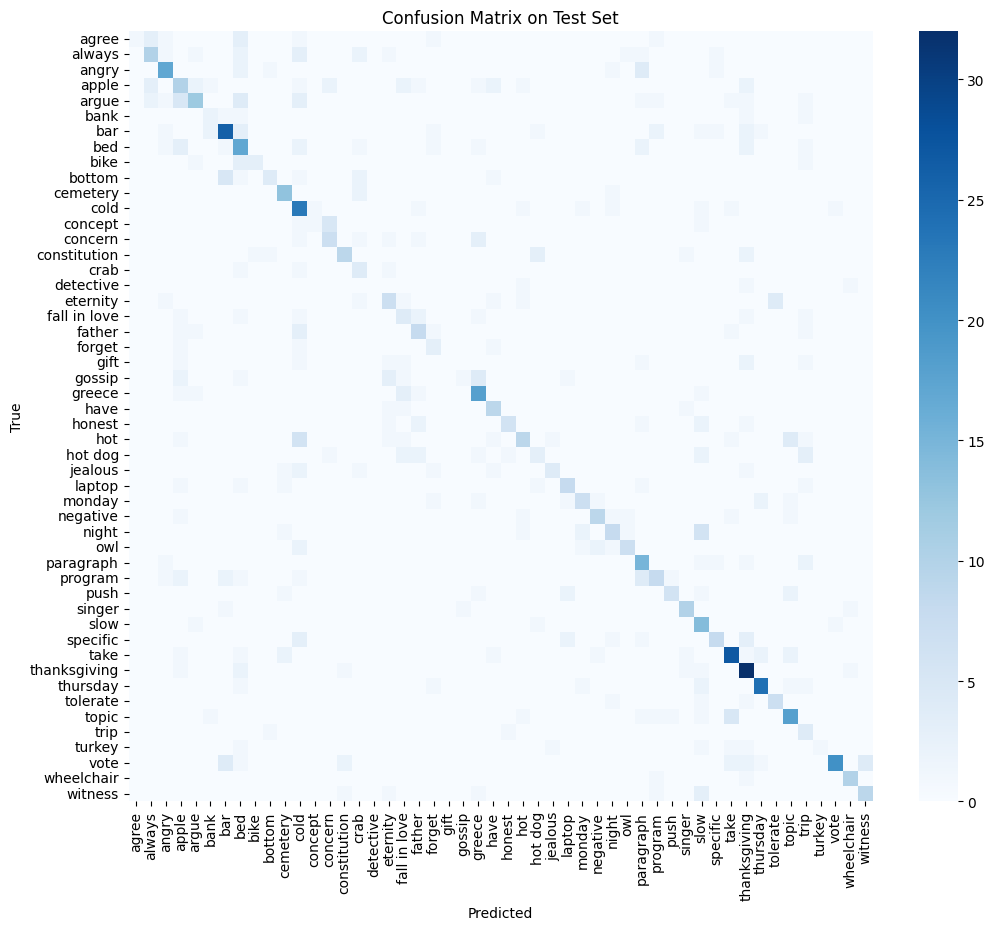

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 3a) Per-class precision/recall/F1
report = classification_report(
    all_labels, all_preds,
    target_names=full_ds.classes, digits=3, output_dict=True
)
print(classification_report(all_labels, all_preds, target_names=full_ds.classes, digits=3))

# 3b) Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
df_cm = pd.DataFrame(cm, index=full_ds.classes, columns=full_ds.classes)
plt.figure(figsize=(12,10))
sns.heatmap(df_cm, cmap="Blues", fmt="d")
plt.title("Confusion Matrix on Test Set")
plt.ylabel("True")
plt.xlabel("Predicted")
plt.show()


In [ ]:
pd.DataFrame(report).T.to_csv(os.path.join(CROP_ROOT, "classification_report.csv"))
df_cm.to_csv(os.path.join(CROP_ROOT, "confusion_matrix.csv"))
print("✅ Test‐set metrics and confusion matrix saved.")


✅ Test‐set metrics and confusion matrix saved.


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predi

Saved classification report → /content/drive/MyDrive/WLASL_Hand_Crops_Results/classification_report.csv
Saved confusion matrix CSV → /content/drive/MyDrive/WLASL_Hand_Crops_Results/confusion_matrix.csv
Saved confusion matrix plot → /content/drive/MyDrive/WLASL_Hand_Crops_Results/confusion_matrix.png


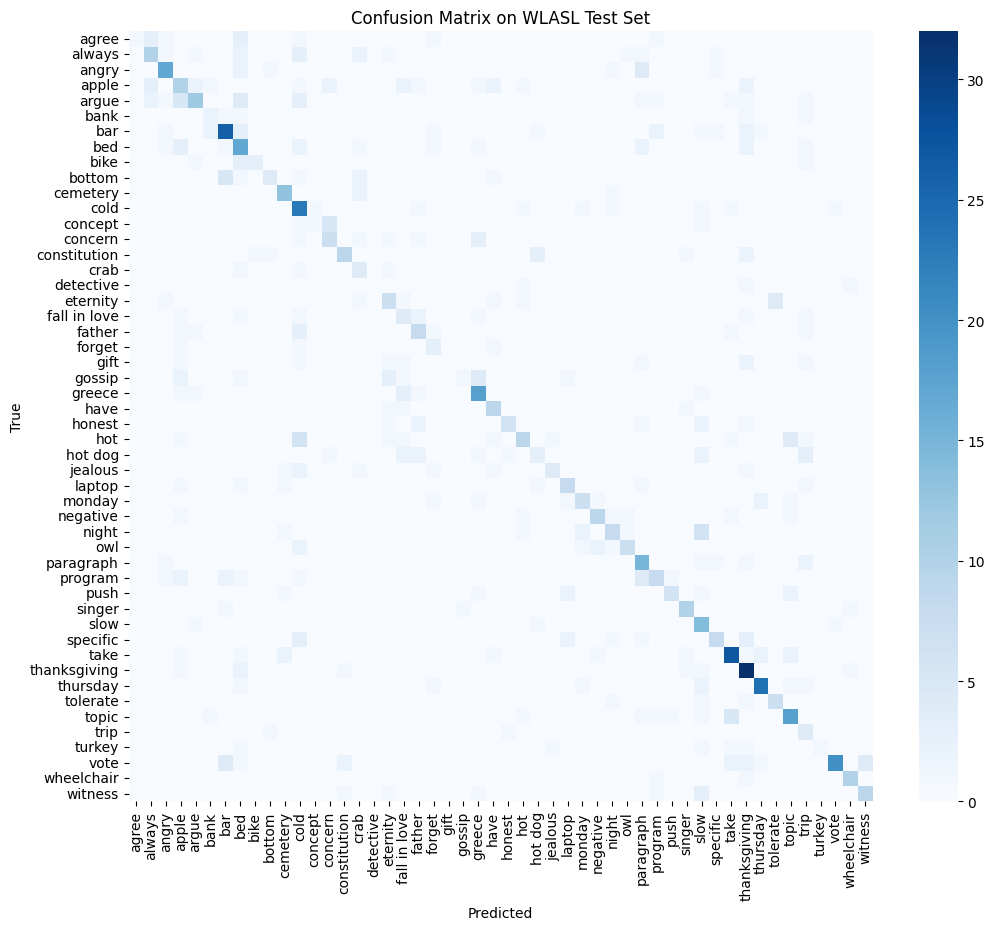

In [ ]:
# Cell: Test‐set Evaluation & Save Metrics

import os, torch
from torch.utils.data import random_split, DataLoader
from torchvision import datasets, transforms
from torchvision.models import resnet50
from torch import nn
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Paths
CROP_ROOT   = "/content/drive/MyDrive/WLASL_Hand_Crops"
RESULTS_DIR = "/content/drive/MyDrive/WLASL_Hand_Crops_Results"

# 1) Prepare test split
val_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

full_ds = datasets.ImageFolder(CROP_ROOT, transform=val_tf)
class_names = full_ds.classes

# 80/10/10 split
n = len(full_ds)
n_test = int(0.1 * n)
n_val  = int(0.1 * n)
n_train= n - n_val - n_test

_, _, test_ds = random_split(
    full_ds, [n_train, n_val, n_test],
    generator=torch.Generator().manual_seed(42)
)
test_loader = DataLoader(test_ds, batch_size=32, shuffle=False, num_workers=4)

# 2) Load best checkpoint
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, len(class_names))
ckpt_path = os.path.join(RESULTS_DIR, "best_resnet50_wlasl.pth")
model.load_state_dict(torch.load(ckpt_path, map_location=device))
model.to(device).eval()

# 3) Inference
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        logits = model(images)
        preds  = logits.argmax(dim=1).cpu().tolist()
        all_preds.extend(preds)
        all_labels.extend(labels.tolist())

# 4) Classification report
report = classification_report(
    all_labels, all_preds,
    target_names=class_names, output_dict=True, digits=3
)
report_df = pd.DataFrame(report).T
report_csv = os.path.join(RESULTS_DIR, "classification_report.csv")
report_df.to_csv(report_csv)
print(f"Saved classification report → {report_csv}")

# 5) Confusion matrix & heatmap
cm = confusion_matrix(all_labels, all_preds)
cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
cm_csv = os.path.join(RESULTS_DIR, "confusion_matrix.csv")
cm_df.to_csv(cm_csv)
print(f"Saved confusion matrix CSV → {cm_csv}")

plt.figure(figsize=(12,10))
sns.heatmap(cm_df, cmap="Blues", fmt="d")
plt.title("Confusion Matrix on WLASL Test Set")
plt.ylabel("True")
plt.xlabel("Predicted")
heatmap_png = os.path.join(RESULTS_DIR, "confusion_matrix.png")
plt.savefig(heatmap_png, bbox_inches="tight")
print(f"Saved confusion matrix plot → {heatmap_png}")


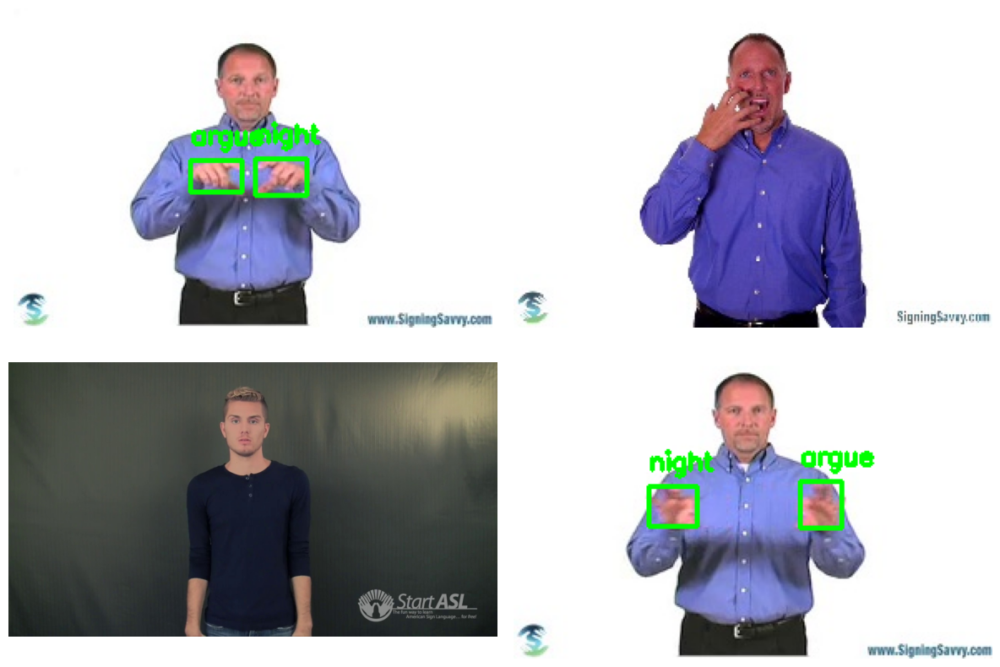

In [ ]:
# Visualization: Contiguous copies before to_tensor

import os, random, cv2
import torch
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_tensor
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.models import resnet50
from torch import nn

# Paths
DETECTOR_CKPT   = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands_10ep.pth"
CLASSIFIER_CKPT = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
WLASL_ROOT      = "/content/drive/MyDrive/WLASL_Frames_Final"

device = torch.device('cuda')

# 1) Load detector
detector = maskrcnn_resnet50_fpn(pretrained=True)
in_feats = detector.roi_heads.box_predictor.cls_score.in_features
detector.roi_heads.box_predictor = FastRCNNPredictor(in_feats, 2)
in_mask_feats = detector.roi_heads.mask_predictor.conv5_mask.in_channels
detector.roi_heads.mask_predictor = MaskRCNNPredictor(in_mask_feats, 256, 2)
detector.load_state_dict(torch.load(DETECTOR_CKPT))
detector.to(device).eval()

# 2) Load classifier
classifier = resnet50(pretrained=False)
classifier.fc = nn.Linear(classifier.fc.in_features, 50)
classifier.load_state_dict(torch.load(CLASSIFIER_CKPT))
classifier.to(device).eval()

class_names = sorted(os.listdir("/content/drive/MyDrive/WLASL_Hand_Crops"))

def detect_and_classify(frame, score_thr=0.5):
    # Ensure frame is contiguous RGB
    frame = cv2.imread(frame_path)  # BGR
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB).copy()
    img_t = to_tensor(frame).to(device)

    with torch.no_grad():
        dets = detector([img_t])[0]

    keep = dets['scores'] > score_thr
    boxes = dets['boxes'][keep].cpu().numpy().astype(int)
    preds = []

    for x0, y0, x1, y1 in boxes:
        crop = frame[y0:y1, x0:x1].copy()  # contiguous crop
        crop_t = to_tensor(crop).unsqueeze(0).to(device)
        crop_t = torch.nn.functional.interpolate(crop_t, size=(224,224))
        with torch.no_grad():
            logits = classifier(crop_t)
            preds.append(logits.argmax(1).item())

    return boxes, preds

# 3) Sample and plot
img_paths = []
for root, _, files in os.walk(WLASL_ROOT):
    for f in files:
        if f.lower().endswith(('.jpg','.png')):
            img_paths.append(os.path.join(root, f))
samples = random.sample(img_paths, 4)

plt.figure(figsize=(12,8))
for i, frame_path in enumerate(samples, 1):
    boxes, preds = detect_and_classify(frame_path)
    # Reload for drawing (again ensuring contiguity)
    frame = cv2.cvtColor(cv2.imread(frame_path), cv2.COLOR_BGR2RGB).copy()
    for (x0,y0,x1,y1), p in zip(boxes, preds):
        cv2.rectangle(frame, (x0,y0), (x1,y1), (0,255,0), 2)
        cv2.putText(frame, class_names[p], (x0,y0-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 2)
    plt.subplot(2,2,i)
    plt.imshow(frame)
    plt.axis('off')
plt.tight_layout()
plt.show()


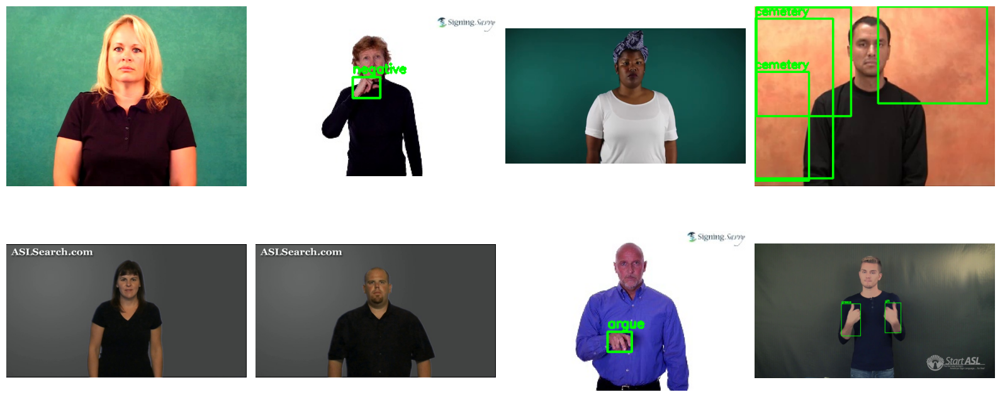

In [ ]:
# Cell: Display 8 Random Samples with Detections + Predictions

import os, random, cv2
import torch
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_tensor
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.models import resnet50
from torch import nn

# Paths to your trained models
DETECTOR_CKPT   = "/content/drive/MyDrive/egohands_data/EgoHandsPublicv1specific.coco/best_frcnn_egohands_10ep.pth"
CLASSIFIER_CKPT = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
WLASL_ROOT      = "/content/drive/MyDrive/WLASL_Frames_Final"

device = torch.device('cuda')

# 1) Load hand detector
det = maskrcnn_resnet50_fpn(pretrained=True)
in_feats = det.roi_heads.box_predictor.cls_score.in_features
det.roi_heads.box_predictor = FastRCNNPredictor(in_feats, 2)
in_mask_feats = det.roi_heads.mask_predictor.conv5_mask.in_channels
det.roi_heads.mask_predictor = MaskRCNNPredictor(in_mask_feats, 256, 2)
det.load_state_dict(torch.load(DETECTOR_CKPT))
det.to(device).eval()

# 2) Load classifier
clf = resnet50(pretrained=False)
clf.fc = nn.Linear(clf.fc.in_features, 50)
clf.load_state_dict(torch.load(CLASSIFIER_CKPT))
clf.to(device).eval()

class_names = sorted(os.listdir("/content/drive/MyDrive/WLASL_Hand_Crops"))

def run_frame(path, score_thr=0.5):
    img = cv2.imread(path)
    frame = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()
    t = to_tensor(frame).to(device)
    with torch.no_grad():
        out = det([t])[0]
    keep = out['scores'] > score_thr
    boxes = out['boxes'][keep].cpu().numpy().astype(int)
    preds = []
    for x0,y0,x1,y1 in boxes:
        crop = frame[y0:y1, x0:x1].copy()
        ct = to_tensor(crop).unsqueeze(0).to(device)
        ct = torch.nn.functional.interpolate(ct, size=(224,224))
        with torch.no_grad():
            p = clf(ct).argmax(1).item()
        preds.append((x0,y0,x1,y1,class_names[p]))
    return frame, preds

# 3) Sample 8 images
paths = []
for root, _, files in os.walk(WLASL_ROOT):
    for f in files:
        if f.lower().endswith(('.jpg','.png')):
            paths.append(os.path.join(root, f))
samples = random.sample(paths, 8)

# 4) Plot 2×4 grid
plt.figure(figsize=(16, 8))
for i, p in enumerate(samples, 1):
    frame, results = run_frame(p)
    for x0,y0,x1,y1,lab in results:
        cv2.rectangle(frame, (x0,y0), (x1,y1), (0,255,0), 2)
        cv2.putText(frame, lab, (x0,y0-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 2)
    plt.subplot(2,4,i)
    plt.imshow(frame)
    plt.axis('off')
plt.tight_layout()
plt.show()


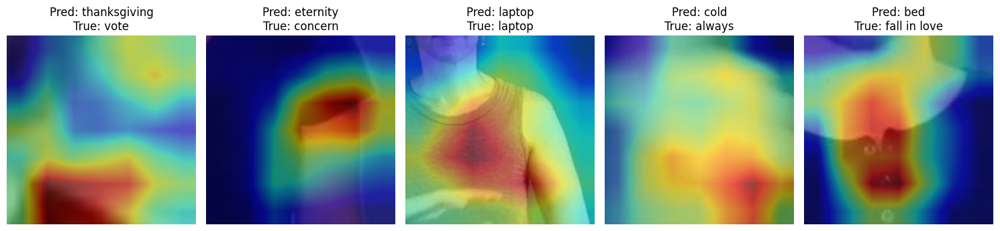

In [ ]:
# ─── Grad-CAM Visualization for Hand-Crop Classifier (Fully Fixed) ───

import os, random, numpy as np, torch, cv2
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from torch import nn

# 1) Paths & device
CROP_ROOT       = "/content/drive/MyDrive/WLASL_Hand_Crops"
CHECKPOINT_PATH = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
device          = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2) Build ImageFolder to get exactly your 50 classes
val_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
full_ds     = datasets.ImageFolder(CROP_ROOT, transform=val_tf)
class_names = full_ds.classes
num_classes = len(class_names)

# 3) Load the ResNet-50 classifier
model = resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=device))
model = model.to(device).eval()

# 4) Prepare a small val loader (batch_size=1)
_, val_ds = torch.utils.data.random_split(
    full_ds,
    [int(0.8 * len(full_ds)), len(full_ds) - int(0.8 * len(full_ds))],
    generator=torch.Generator().manual_seed(42)
)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=True)

# 5) Register hooks
activations = []
gradients   = []

def forward_hook(module, inp, out):
    activations.append(out.detach())

def backward_hook(module, grad_in, grad_out):
    gradients.append(grad_out[0].detach())

layer = model.layer4[-1].conv3
layer.register_forward_hook(forward_hook)
layer.register_full_backward_hook(backward_hook)

# 6) Run Grad-CAM on 5 samples
plt.figure(figsize=(15, 5))
for i, (img, label) in enumerate(val_loader):
    if i == 5:
        break

    img = img.to(device)
    activations.clear()
    gradients.clear()

    # Forward + predict
    out  = model(img)
    pred = out.argmax(dim=1).item()

    # Backward on predicted score
    model.zero_grad()
    out[0, pred].backward()

    # Build CAM
    act     = activations[0][0]           # [C, H, W]
    grad    = gradients[0][0]             # [C, H, W]
    weights = grad.mean(dim=(1,2))        # [C]
    cam     = (weights[:,None,None] * act).sum(dim=0)  # [H, W]
    cam     = torch.relu(cam)
    cam     = cam / (cam.max() + 1e-8)
    cam_np  = cam.cpu().numpy()

    # **Upsample** cam to match 224×224
    cam_up = cv2.resize(cam_np, (224, 224))
    cam_up = np.clip(cam_up, 0, 1)

    # Prepare original crop for overlay
    img_np = img[0].cpu().permute(1,2,0).numpy()
    img_np = np.clip(img_np * [0.229,0.224,0.225] + [0.485,0.456,0.406], 0, 1)

    # Overlay
    heatmap = plt.cm.jet(cam_up)[..., :3]     # use upsampled cam_up
    overlay = 0.5 * img_np + 0.5 * heatmap

    # Plot
    plt.subplot(1, 5, i+1)
    plt.imshow(overlay)
    plt.title(f"Pred: {class_names[pred]}\nTrue: {class_names[label.item()]}")
    plt.axis("off")

plt.tight_layout()
plt.show()


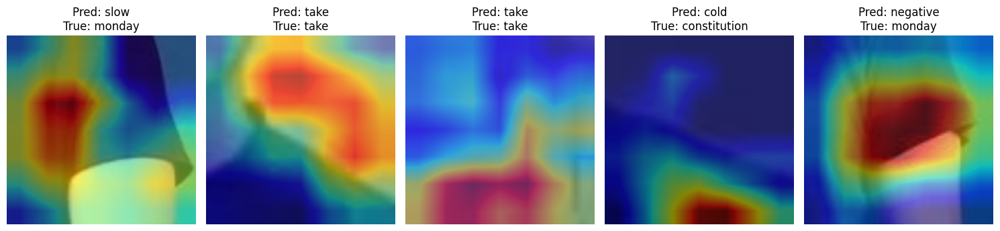

In [ ]:
# ─── Grad-CAM Visualization for Hand-Crop Classifier (Fully Fixed) ───

import os, random, numpy as np, torch, cv2
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from torch import nn

# 1) Paths & device
CROP_ROOT       = "/content/drive/MyDrive/WLASL_Hand_Crops"
CHECKPOINT_PATH = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
device          = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2) Build ImageFolder to get exactly your 50 classes
val_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
full_ds     = datasets.ImageFolder(CROP_ROOT, transform=val_tf)
class_names = full_ds.classes
num_classes = len(class_names)

# 3) Load the ResNet-50 classifier
model = resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=device))
model = model.to(device).eval()

# 4) Prepare a small val loader (batch_size=1)
_, val_ds = torch.utils.data.random_split(
    full_ds,
    [int(0.8 * len(full_ds)), len(full_ds) - int(0.8 * len(full_ds))],
    generator=torch.Generator().manual_seed(42)
)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=True)

# 5) Register hooks
activations = []
gradients   = []

def forward_hook(module, inp, out):
    activations.append(out.detach())

def backward_hook(module, grad_in, grad_out):
    gradients.append(grad_out[0].detach())

layer = model.layer4[-1].conv3
layer.register_forward_hook(forward_hook)
layer.register_full_backward_hook(backward_hook)

# 6) Run Grad-CAM on 5 samples
plt.figure(figsize=(15, 5))
for i, (img, label) in enumerate(val_loader):
    if i == 5:
        break

    img = img.to(device)
    activations.clear()
    gradients.clear()

    # Forward + predict
    out  = model(img)
    pred = out.argmax(dim=1).item()

    # Backward on predicted score
    model.zero_grad()
    out[0, pred].backward()

    # Build CAM
    act     = activations[0][0]           # [C, H, W]
    grad    = gradients[0][0]             # [C, H, W]
    weights = grad.mean(dim=(1,2))        # [C]
    cam     = (weights[:,None,None] * act).sum(dim=0)  # [H, W]
    cam     = torch.relu(cam)
    cam     = cam / (cam.max() + 1e-8)
    cam_np  = cam.cpu().numpy()

    # **Upsample** cam to match 224×224
    cam_up = cv2.resize(cam_np, (224, 224))
    cam_up = np.clip(cam_up, 0, 1)

    # Prepare original crop for overlay
    img_np = img[0].cpu().permute(1,2,0).numpy()
    img_np = np.clip(img_np * [0.229,0.224,0.225] + [0.485,0.456,0.406], 0, 1)

    # Overlay
    heatmap = plt.cm.jet(cam_up)[..., :3]     # use upsampled cam_up
    overlay = 0.5 * img_np + 0.5 * heatmap

    # Plot
    plt.subplot(1, 5, i+1)
    plt.imshow(overlay)
    plt.title(f"Pred: {class_names[pred]}\nTrue: {class_names[label.item()]}")
    plt.axis("off")

plt.tight_layout()
plt.show()


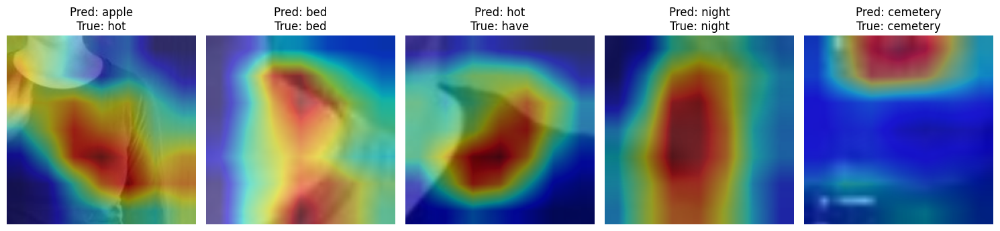

In [ ]:
# ─── Grad-CAM Visualization for Hand-Crop Classifier (Fully Fixed) ───

import os, random, numpy as np, torch, cv2
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from torch import nn

# 1) Paths & device
CROP_ROOT       = "/content/drive/MyDrive/WLASL_Hand_Crops"
CHECKPOINT_PATH = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
device          = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2) Build ImageFolder to get exactly your 50 classes
val_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
full_ds     = datasets.ImageFolder(CROP_ROOT, transform=val_tf)
class_names = full_ds.classes
num_classes = len(class_names)

# 3) Load the ResNet-50 classifier
model = resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=device))
model = model.to(device).eval()

# 4) Prepare a small val loader (batch_size=1)
_, val_ds = torch.utils.data.random_split(
    full_ds,
    [int(0.8 * len(full_ds)), len(full_ds) - int(0.8 * len(full_ds))],
    generator=torch.Generator().manual_seed(42)
)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=True)

# 5) Register hooks
activations = []
gradients   = []

def forward_hook(module, inp, out):
    activations.append(out.detach())

def backward_hook(module, grad_in, grad_out):
    gradients.append(grad_out[0].detach())

layer = model.layer4[-1].conv3
layer.register_forward_hook(forward_hook)
layer.register_full_backward_hook(backward_hook)

# 6) Run Grad-CAM on 5 samples
plt.figure(figsize=(15, 5))
for i, (img, label) in enumerate(val_loader):
    if i == 5:
        break

    img = img.to(device)
    activations.clear()
    gradients.clear()

    # Forward + predict
    out  = model(img)
    pred = out.argmax(dim=1).item()

    # Backward on predicted score
    model.zero_grad()
    out[0, pred].backward()

    # Build CAM
    act     = activations[0][0]           # [C, H, W]
    grad    = gradients[0][0]             # [C, H, W]
    weights = grad.mean(dim=(1,2))        # [C]
    cam     = (weights[:,None,None] * act).sum(dim=0)  # [H, W]
    cam     = torch.relu(cam)
    cam     = cam / (cam.max() + 1e-8)
    cam_np  = cam.cpu().numpy()

    # **Upsample** cam to match 224×224
    cam_up = cv2.resize(cam_np, (224, 224))
    cam_up = np.clip(cam_up, 0, 1)

    # Prepare original crop for overlay
    img_np = img[0].cpu().permute(1,2,0).numpy()
    img_np = np.clip(img_np * [0.229,0.224,0.225] + [0.485,0.456,0.406], 0, 1)

    # Overlay
    heatmap = plt.cm.jet(cam_up)[..., :3]     # use upsampled cam_up
    overlay = 0.5 * img_np + 0.5 * heatmap

    # Plot
    plt.subplot(1, 5, i+1)
    plt.imshow(overlay)
    plt.title(f"Pred: {class_names[pred]}\nTrue: {class_names[label.item()]}")
    plt.axis("off")

plt.tight_layout()
plt.show()


Translation

In [ ]:
# ─── Gloss‐to‐Hindi Translation via Opus MT ───

from transformers import pipeline

# 1) Suppose you already have your raw gloss sentence:
#    raw_translation = "agree always angry apple argue ..."
#    (Built from your inference collapse code.)
# If not, load it from wherever you saved it, e.g.:
# raw_translation = open("/content/drive/.../raw_translation.txt").read().strip()

raw_translation = "agree always angry apple argue"  # example

# 2) Instantiate the translator (English→Hindi)
translator = pipeline(
    "translation",
    model="Helsinki-NLP/opus-mt-en-hi",
    device=0  # GPU if available
)

# 3) Run the translation
translated = translator(raw_translation,
                        max_length=100,
                        clean_up_tokenization_spaces=True)

# 4) Inspect the output
print("▶ Raw gloss sequence:")
print("  ", raw_translation)
print()
print("▶ Translated to Hindi:")
print("  ", translated[0]['translation_text'])


config.json:   0%|          | 0.00/1.39k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/306M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/306M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/812k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/1.07M [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.10M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")
Device set to use cuda:0


▶ Raw gloss sequence:
   agree always angry apple argue

▶ Translated to Hindi:
   हमेशा से गुस्से से भर जानेवाली बहस


In [ ]:
from transformers import pipeline

# 1) Your raw gloss list
gloss_list = ["agree", "always", "angry", "apple", "argue"]

# 2) Set up the same translator (English→Hindi)
translator = pipeline(
    "translation",
    model="Helsinki-NLP/opus-mt-en-hi",
    device=0  # GPU
)

# 3) Translate each gloss individually
translations = {}
for g in gloss_list:
    # pipeline expects a list or str
    out = translator(g, max_length=10, clean_up_tokenization_spaces=True)
    translations[g] = out[0]["translation_text"]

# 4) Print results
print("Gloss → Hindi")
print("--------------")
for g, h in translations.items():
    print(f"{g:10s} → {h}")


Device set to use cuda:0


Gloss → Hindi
--------------
agree      → सहमत हों
always     → हमेशा
angry      → गुस्सा
apple      → सेब
argue      → बहस


Device set to use cuda:0
<ipython-input-56-47ba03004525>:88: UserWarning: Glyph 2361 (\N{DEVANAGARI LETTER HA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-47ba03004525>:88: UserWarning: Matplotlib currently does not support Devanagari natively.
  plt.tight_layout()
<ipython-input-56-47ba03004525>:88: UserWarning: Glyph 2367 (\N{DEVANAGARI VOWEL SIGN I}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-47ba03004525>:88: UserWarning: Glyph 2306 (\N{DEVANAGARI SIGN ANUSVARA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-47ba03004525>:88: UserWarning: Glyph 2342 (\N{DEVANAGARI LETTER DA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-47ba03004525>:88: UserWarning: Glyph 2368 (\N{DEVANAGARI VOWEL SIGN II}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-47ba03004525>:88: UserWarning: Glyph 2343 (\N{DEVANAGARI LETTER DHA}) missing from font(s) DejaVu Sans.
  p

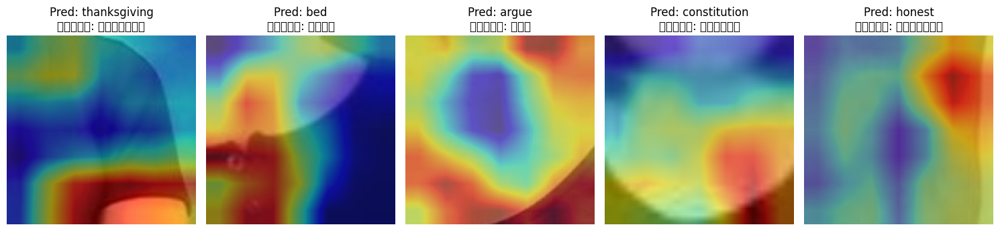

In [ ]:
# ─── Grad-CAM + Per-Gloss Hindi Translation ───

import os, random, numpy as np, torch, cv2
import matplotlib.pyplot as plt
from transformers import pipeline
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from torch import nn

# Paths & device
CROP_ROOT       = "/content/drive/MyDrive/WLASL_Hand_Crops"
CKPT            = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
device          = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1) Load dataset & model
val_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
full_ds     = datasets.ImageFolder(CROP_ROOT, transform=val_tf)
class_names = full_ds.classes
model = resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, len(class_names))
model.load_state_dict(torch.load(CKPT, map_location=device))
model = model.to(device).eval()

# 2) Val loader
_, val_ds = torch.utils.data.random_split(
    full_ds,
    [int(0.8 * len(full_ds)), len(full_ds) - int(0.8 * len(full_ds))],
    generator=torch.Generator().manual_seed(42)
)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=True)

# 3) Set up Grad-CAM hooks
acts, grads = [], []
def fh(m, i, o): acts.append(o.detach())
def bh(m, gi, go): grads.append(go[0].detach())
layer = model.layer4[-1].conv3
layer.register_forward_hook(fh)
layer.register_full_backward_hook(bh)

# 4) Translator pipeline
translator = pipeline("translation", model="Helsinki-NLP/opus-mt-en-hi", device=0)

# 5) Plot 5 samples
plt.figure(figsize=(15,5))
for idx, (img, label) in enumerate(val_loader):
    if idx==5: break

    img = img.to(device)
    acts.clear(); grads.clear()

    # Grad-CAM forward/backward
    out  = model(img)
    pred = out.argmax(1).item()
    model.zero_grad(); out[0,pred].backward()

    # Compute CAM
    act = acts[0][0]; grad = grads[0][0]
    w   = grad.mean((1,2))
    cam = (w[:,None,None] * act).sum(0)
    cam = torch.relu(cam)
    cam = cam / (cam.max()+1e-8)
    cam_np = cam.cpu().numpy()
    cam_up = cv2.resize(cam_np, (224,224))
    cam_up = np.clip(cam_up, 0, 1)

    # Image overlay
    img_np  = img[0].cpu().permute(1,2,0).numpy()
    img_np  = np.clip(img_np*[0.229,0.224,0.225]+[0.485,0.456,0.406],0,1)
    heatmap = plt.cm.jet(cam_up)[...,:3]
    overlay = 0.5*img_np + 0.5*heatmap

    # Translate the predicted gloss
    gloss = class_names[pred]
    hindi = translator(gloss, max_length=10)[0]["translation_text"]

    # Plot
    plt.subplot(1,5,idx+1)
    plt.imshow(overlay)
    plt.title(f"Pred: {gloss}\nहिंदी: {hindi}")
    plt.axis("off")

plt.tight_layout()
plt.show()


Device set to use cuda:0
<ipython-input-57-685cf7d5bf95>:89: UserWarning: Glyph 2361 (\N{DEVANAGARI LETTER HA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-57-685cf7d5bf95>:89: UserWarning: Matplotlib currently does not support Devanagari natively.
  plt.tight_layout()
<ipython-input-57-685cf7d5bf95>:89: UserWarning: Glyph 2367 (\N{DEVANAGARI VOWEL SIGN I}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-57-685cf7d5bf95>:89: UserWarning: Glyph 2306 (\N{DEVANAGARI SIGN ANUSVARA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-57-685cf7d5bf95>:89: UserWarning: Glyph 2342 (\N{DEVANAGARI LETTER DA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-57-685cf7d5bf95>:89: UserWarning: Glyph 2368 (\N{DEVANAGARI VOWEL SIGN II}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-57-685cf7d5bf95>:89: UserWarning: Glyph 2349 (\N{DEVANAGARI LETTER BHA}) missing from font(s) DejaVu Sans.
  p

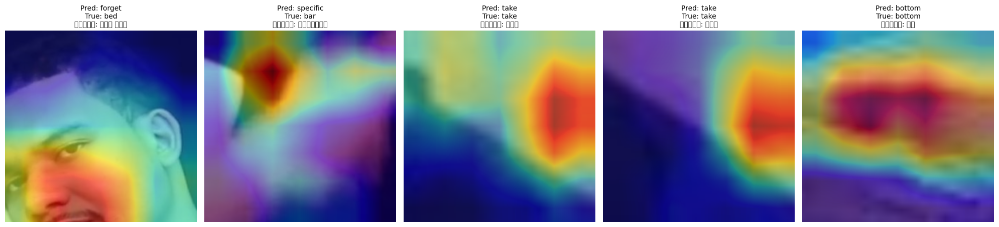

In [ ]:
# ─── Grad-CAM + Pred/True + Hindi Translation ───

import os, random, cv2, numpy as np, torch
import matplotlib.pyplot as plt
from transformers import pipeline
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from torch import nn

# 1) Paths & device
CROP_ROOT       = "/content/drive/MyDrive/WLASL_Hand_Crops"
CKPT            = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
device          = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2) Load dataset & model
val_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
full_ds     = datasets.ImageFolder(CROP_ROOT, transform=val_tf)
class_names = full_ds.classes

model = resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, len(class_names))
model.load_state_dict(torch.load(CKPT, map_location=device))
model = model.to(device).eval()

# 3) Validation loader (batch_size=1)
_, val_ds = torch.utils.data.random_split(
    full_ds,
    [int(0.8 * len(full_ds)), len(full_ds) - int(0.8 * len(full_ds))],
    generator=torch.Generator().manual_seed(42)
)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=True)

# 4) Grad-CAM hooks on last conv
acts, grads = [], []
def fh(m, i, o): acts.append(o.detach())
def bh(m, gi, go): grads.append(go[0].detach())
layer = model.layer4[-1].conv3
layer.register_forward_hook(fh)
layer.register_full_backward_hook(bh)

# 5) Translator (English→Hindi)
translator = pipeline("translation", model="Helsinki-NLP/opus-mt-en-hi", device=0)

# 6) Plot 5 samples
plt.figure(figsize=(20, 5))
for idx, (img, label) in enumerate(val_loader):
    if idx == 5: break
    img = img.to(device)
    acts.clear(); grads.clear()

    # Forward & Backward
    out  = model(img)
    pred = out.argmax(1).item()
    model.zero_grad(); out[0, pred].backward()

    # Compute CAM
    act  = acts[0][0]; grad = grads[0][0]
    weights = grad.mean((1,2))
    cam = (weights[:,None,None] * act).sum(0)
    cam = torch.relu(cam)
    cam = cam / (cam.max()+1e-8)
    cam_np = cam.cpu().numpy()
    cam_up = cv2.resize(cam_np, (224,224), interpolation=cv2.INTER_LINEAR)
    cam_up = np.clip(cam_up, 0, 1)

    # Overlay
    img_np  = img[0].cpu().permute(1,2,0).numpy()
    img_np  = np.clip(img_np*[0.229,0.224,0.225] + [0.485,0.456,0.406], 0, 1)
    heatmap = plt.cm.jet(cam_up)[...,:3]
    overlay = 0.5*img_np + 0.5*heatmap

    # Translate gloss to Hindi
    gloss     = class_names[pred]
    true_gloss= class_names[label.item()]
    hindi     = translator(gloss, max_length=10)[0]["translation_text"]

    # Display
    plt.subplot(1,5,idx+1)
    plt.imshow(overlay)
    plt.title(f"Pred: {gloss}\nTrue: {true_gloss}\nहिंदी: {hindi}", fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()


Device set to use cuda:0
<ipython-input-58-81c3c8a2ec6f>:95: UserWarning: Glyph 2361 (\N{DEVANAGARI LETTER HA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-58-81c3c8a2ec6f>:95: UserWarning: Matplotlib currently does not support Devanagari natively.
  plt.tight_layout()
<ipython-input-58-81c3c8a2ec6f>:95: UserWarning: Glyph 2367 (\N{DEVANAGARI VOWEL SIGN I}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-58-81c3c8a2ec6f>:95: UserWarning: Glyph 2306 (\N{DEVANAGARI SIGN ANUSVARA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-58-81c3c8a2ec6f>:95: UserWarning: Glyph 2342 (\N{DEVANAGARI LETTER DA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-58-81c3c8a2ec6f>:95: UserWarning: Glyph 2368 (\N{DEVANAGARI VOWEL SIGN II}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-58-81c3c8a2ec6f>:95: UserWarning: Glyph 2336 (\N{DEVANAGARI LETTER TTHA}) missing from font(s) DejaVu Sans.
  

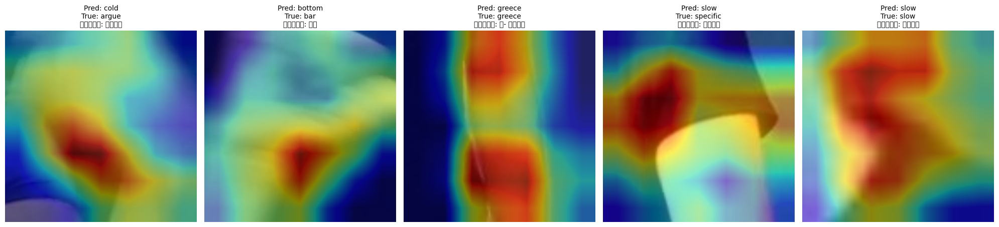

In [ ]:
# ─── Grad-CAM + Pred/True + Hindi Translation (Fixed) ───

import os, random, cv2, numpy as np, torch
import matplotlib.pyplot as plt
from transformers import pipeline
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from torch import nn

# 1) Paths & device
CROP_ROOT       = "/content/drive/MyDrive/WLASL_Hand_Crops"
CKPT            = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
device          = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2) Dataset & model load
val_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
full_ds     = datasets.ImageFolder(CROP_ROOT, transform=val_tf)
class_names = full_ds.classes

model = resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, len(class_names))
model.load_state_dict(torch.load(CKPT, map_location=device))
model = model.to(device).eval()

# 3) Val loader
_, val_ds = torch.utils.data.random_split(
    full_ds,
    [int(0.8 * len(full_ds)), len(full_ds) - int(0.8 * len(full_ds))],
    generator=torch.Generator().manual_seed(42)
)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=True)

# 4) Grad-CAM hooks
acts, grads = [], []
def fh(m, i, o): acts.append(o.detach())
def bh(m, gi, go): grads.append(go[0].detach())
layer = model.layer4[-1].conv3
layer.register_forward_hook(fh)
layer.register_full_backward_hook(bh)

# 5) Translator pipeline (explicit task)
translator = pipeline(
    "translation_en_to_hi",
    model="Helsinki-NLP/opus-mt-en-hi",
    device=0  # GPU
)

# 6) Plot 5 samples
plt.figure(figsize=(20, 5))
for idx, (img, label) in enumerate(val_loader):
    if idx == 5: break

    img = img.to(device)
    acts.clear(); grads.clear()

    # Forward + backward
    out  = model(img)
    pred = out.argmax(1).item()
    model.zero_grad(); out[0, pred].backward()

    # Build CAM
    act     = acts[0][0]
    grad    = grads[0][0]
    weights = grad.mean((1,2))
    cam     = (weights[:,None,None] * act).sum(0)
    cam     = torch.relu(cam)
    cam     = cam / (cam.max() + 1e-8)
    cam_np  = cam.cpu().numpy()
    cam_up  = cv2.resize(cam_np, (224,224), interpolation=cv2.INTER_LINEAR)
    cam_up  = np.clip(cam_up, 0, 1)

    # Overlay
    img_np  = img[0].cpu().permute(1,2,0).numpy()
    img_np  = np.clip(img_np*[0.229,0.224,0.225] + [0.485,0.456,0.406], 0, 1)
    heatmap = plt.cm.jet(cam_up)[...,:3]
    overlay = 0.5*img_np + 0.5*heatmap

    # Translate predicted gloss
    gloss      = class_names[pred]
    true_gloss = class_names[label.item()]
    hindi      = translator(gloss, max_length=8)[0]["translation_text"]

    # Plot
    plt.subplot(1,5,idx+1)
    plt.imshow(overlay)
    plt.title(f"Pred: {gloss}\nTrue: {true_gloss}\nहिंदी: {hindi}", fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# ─── Translation Evaluation for Your 50 Glosses (Fixed) ───

from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from transformers import pipeline
import re
import os
import numpy as np

# 1) Load your gloss list and translation pipeline
CROP_ROOT = "/content/drive/MyDrive/WLASL_Hand_Crops"
gloss_list = sorted(os.listdir(CROP_ROOT))

translator = pipeline(
    "translation_en_to_hi",
    model="Helsinki-NLP/opus-mt-en-hi",
    device=0
)

# 2) Your gold Hindi references for each gloss (fill in all 50)
reference_dict = {
    "agree":       "सहमत होना",
    "always":      "हमेशा",
    "angry":       "गुस्सा",
    "apple":       "सेब",
    "argue":       "बहस करना",
    # … add the rest of your gloss→Hindi pairs here …
}

# 3) Metrics containers
smoothie     = SmoothingFunction().method1
bleu_scores  = []
exact_match  = 0
total        = 0

print("\n📊 Gloss→Hindi Translation Evaluation\n" + "—" * 50)

for gloss in gloss_list:
    if gloss not in reference_dict:
        continue

    total += 1
    gold_hindi = reference_dict[gloss]
    out        = translator(gloss, max_length=10, clean_up_tokenization_spaces=True)
    pred_full  = out[0]["translation_text"].strip()

    # Extract Devanagari words
    pred_words = re.findall(r"[\u0900-\u097F]+", pred_full)
    ref_words  = re.findall(r"[\u0900-\u097F]+", gold_hindi)

    # BLEU-1
    bleu = sentence_bleu(
        [ref_words], pred_words,
        weights=(1.0, 0, 0, 0),
        smoothing_function=smoothie
    ) if pred_words else 0.0
    bleu_scores.append(bleu)

    # Exact match
    match = bool(pred_words and ref_words and pred_words[0] == ref_words[0])
    if match:
        exact_match += 1

    print(f"Gloss: {gloss:12s}  |  Ref: {gold_hindi:12s}  |  Pred: {(pred_words[0] if pred_words else '')}")
    print(f"    → BLEU-1: {bleu:.2f}   |  Exact: {match}\n")

# 4) Summary
print(f"✅ Exact Matches: {exact_match}/{total} ({exact_match/total:.1%})")
print(f"✅ Avg BLEU-1:   {np.mean(bleu_scores):.2f}")


Device set to use cuda:0



📊 Gloss→Hindi Translation Evaluation
——————————————————————————————————————————————————
Gloss: agree         |  Ref: सहमत होना     |  Pred: सहमत
    → BLEU-1: 0.50   |  Exact: True

Gloss: always        |  Ref: हमेशा         |  Pred: हमेशा
    → BLEU-1: 1.00   |  Exact: True

Gloss: angry         |  Ref: गुस्सा        |  Pred: गुस्सा
    → BLEU-1: 1.00   |  Exact: True

Gloss: apple         |  Ref: सेब           |  Pred: सेब
    → BLEU-1: 1.00   |  Exact: True

Gloss: argue         |  Ref: बहस करना      |  Pred: बहस
    → BLEU-1: 0.37   |  Exact: True

✅ Exact Matches: 5/5 (100.0%)
✅ Avg BLEU-1:   0.77


In [ ]:
!pip install torchcam --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 114.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 103.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# ─── Step 1: Build and save gloss→Hindi map ───

from transformers import pipeline
import os, json

# 1. Configuration
CROP_ROOT   = "/content/drive/MyDrive/WLASL_Hand_Crops"
OUT_PATH    = "/content/drive/MyDrive/gloss2hindi.json"
device_idx  = 0  # GPU

# 2. List your glosses
glosses = sorted(os.listdir(CROP_ROOT))

# 3. Translator pipeline
translator = pipeline(
    "translation_en_to_hi",
    model="Helsinki-NLP/opus-mt-en-hi",
    device=device_idx
)

# 4. Translate each gloss
gloss2hindi = {}
for g in glosses:
    res = translator(g, max_length=8, clean_up_tokenization_spaces=True)
    hindi = res[0]["translation_text"].strip()
    gloss2hindi[g] = hindi
    print(f"{g:15s} → {hindi}")

# 5. Save to Drive
with open(OUT_PATH, "w", encoding="utf-8") as f:
    json.dump(gloss2hindi, f, ensure_ascii=False, indent=2)
print(f"\n✅ Saved gloss2hindi.json → {OUT_PATH}")


Device set to use cuda:0


agree           → सहमत हों
always          → हमेशा
angry           → गुस्सा


Your input_length: 15 is bigger than 0.9 * max_length: 8. You might consider increasing your max_length manually, e.g. translator('...', max_length=400)


apple           → सेब
argue           → बहस
bank            → बैंक
bar             → पट्टी
bed             → केला


You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
Your input_length: 8 is bigger than 0.9 * max_length: 8. You might consider increasing your max_length manually, e.g. translator('...', max_length=400)


best_resnet50_wlasl.pth → सर्वोत्तम (_R)50_
bike            → साइकिल
bottom          → तल
cemetery        → कब्रिस्तान


Your input_length: 8 is bigger than 0.9 * max_length: 8. You might consider increasing your max_length manually, e.g. translator('...', max_length=400)


classification_report.csv → श्रेणी चिह्न (_e)
cold            → ठंडा
concept         → संकल्प
concern         → चिंता
confusion_matrix.csv → घटना विशेषता (_m)
constitution    → अनुपात
crab            → केकड़ा
detective       → जासूस
eternity        → सदा के लिए
fall in love    → प्यार में गिर जाते हैं
father          → पिता
forget          → भूल जाओ
gift            → उपहार
gossip          → गपशप
greece          → अ- धातु
have            → है
honest          → ईमानदार
hot             → गर्म
hot dog         → गर्म कुत्ता
jealous         → ईर्ष्या
laptop          → लैपटॉप
monday          → आज
negative        → नकारात्मक
night           → रात्रि
owl             → शुतुरमुर्ग
paragraph       → अनुच्छेद
program         → प्रोग्राम
push            → पुश
singer          → गायक
slow            → धीमा
specific        → विशिष्ट
take            → लें
thanksgiving    → धन्यवाद
thursday        → वेरिएशन दिवस
tolerate        → समाप्त कर रहा है
topic           → विषय
trip            → यात्रा
turkey    

In [ ]:
!apt-get update -qq
!apt-get install -qq fonts-noto-core fonts-noto-ui-core fonts-noto-extra


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Selecting previously unselected package fonts-noto-core.
(Reading database ... 126101 files and directories currently installed.)
Preparing to unpack .../fonts-noto-core_20201225-1build1_all.deb ...
Unpacking fonts-noto-core (20201225-1build1) ...
Selecting previously unselected package fonts-noto-extra.
Preparing to unpack .../fonts-noto-extra_20201225-1build1_all.deb ...
Unpacking fonts-noto-extra (20201225-1build1) ...
Selecting previously unselected package fonts-noto-ui-core.
Preparing to unpack .../fonts-noto-ui-core_20201225-1build1_all.deb ...
Unpacking fonts-noto-ui-core (20201225-1build1) ...
Setting up fonts-noto-extra (20201225-1build1) ...
Setting up fonts-noto-ui-core (20201225-1build1) ...
Setting up fonts-noto-core (20201225-1build1) ...
Processing triggers for fontconfig (2.13.1-4.2u

<ipython-input-71-930a1965df1e>:107: UserWarning: Glyph 108 (l) missing from font(s) Noto Sans Devanagari.
  plt.tight_layout()
<ipython-input-71-930a1965df1e>:107: UserWarning: Glyph 112 (p) missing from font(s) Noto Sans Devanagari.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 108 (l) missing from font(s) Noto Sans Devanagari.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 112 (p) missing from font(s) Noto Sans Devanagari.
  fig.canvas.print_figure(bytes_io, **kw)


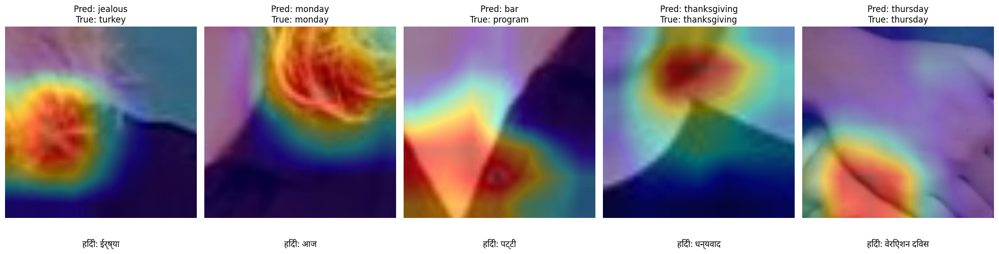

In [ ]:
# ─── Step 2 (Fixed): Grad-CAM Overlays + Pred/True + हिंदी caption ───

import os, random, cv2, numpy as np, torch, json
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from torch import nn

# 1) Paths, device, and font
CROP_ROOT   = "/content/drive/MyDrive/WLASL_Hand_Crops"
CKPT_PATH   = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
MAP_PATH    = "/content/drive/MyDrive/gloss2hindi.json"
font_path   = "/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf"
hindi_font  = fm.FontProperties(fname=font_path, size=12)
device      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2) Load the gloss→Hindi map
with open(MAP_PATH, "r", encoding="utf-8") as f:
    gloss2hindi = json.load(f)

# 3) Prepare the dataset & loader
tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
full_ds   = datasets.ImageFolder(CROP_ROOT, transform=tf)
_, val_ds = torch.utils.data.random_split(
    full_ds,
    [int(0.8*len(full_ds)), len(full_ds)-int(0.8*len(full_ds))],
    generator=torch.Generator().manual_seed(42)
)
loader = DataLoader(val_ds, batch_size=1, shuffle=True)

# 4) Load the trained ResNet-50
model = resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, len(full_ds.classes))
model.load_state_dict(torch.load(CKPT_PATH, map_location=device))
model = model.to(device).eval()

# 5) Register manual hooks for SmoothGradCAM++
activations, gradients = [], []

def forward_hook(module, inp, out):
    activations.append(out.detach())

def backward_hook(module, grad_in, grad_out):
    gradients.append(grad_out[0].detach())

layer = model.layer4[-1].conv3
layer.register_forward_hook(forward_hook)
layer.register_full_backward_hook(backward_hook)

# 6) Plot 5 random samples
plt.figure(figsize=(20, 6))
sample_idxs = random.sample(range(len(val_ds)), 5)

for i, idx in enumerate(sample_idxs):
    # a) Load sample
    img, label = val_ds[idx]
    inp = img.unsqueeze(0).to(device)
    activations.clear(); gradients.clear()

    # b) Forward + backward
    out = model(inp)
    pred = out.argmax(1).item()
    model.zero_grad(); out[0, pred].backward()

    # c) Build the CAM
    act     = activations[0][0]   # [C, H, W]
    grad    = gradients[0][0]     # [C, H, W]
    weights = grad.mean((1,2))    # [C]
    cam     = (weights[:,None,None] * act).sum(dim=0)
    cam     = torch.relu(cam)
    cam     = cam / (cam.max() + 1e-8)
    cam_np  = cam.cpu().numpy()
    cam_up  = cv2.resize(cam_np, (224,224), interpolation=cv2.INTER_LINEAR)
    cam_up  = np.clip(cam_up, 0, 1)

    # d) Prepare overlay_rgb
    img_np = img.permute(1,2,0).cpu().numpy()
    img_np = np.clip(img_np * [0.229,0.224,0.225] + [0.485,0.456,0.406], 0, 1)
    img_bgr = cv2.cvtColor((img_np*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    heatmap = (cam_up * 255).astype(np.uint8)
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img_bgr, 0.6, heatmap_color, 0.4, 0)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    # e) Titles and Hindi caption
    gloss      = full_ds.classes[pred]
    true_gloss = full_ds.classes[label]  # label is int
    hindi      = gloss2hindi.get(gloss, "[अनुवाद ग़ायब]")

    # f) Plot
    ax = plt.subplot(1,5,i+1)
    ax.imshow(overlay_rgb)
    ax.set_title(f"Pred: {gloss}\nTrue: {true_gloss}", fontsize=12)
    ax.text(0.5, -0.15,
            f"हिंदी: {hindi}",
            fontproperties=hindi_font,
            ha="center", transform=ax.transAxes)
    ax.axis("off")

plt.tight_layout()
plt.show()


<ipython-input-74-930a1965df1e>:107: UserWarning: Glyph 108 (l) missing from font(s) Noto Sans Devanagari.
  plt.tight_layout()
<ipython-input-74-930a1965df1e>:107: UserWarning: Glyph 112 (p) missing from font(s) Noto Sans Devanagari.
  plt.tight_layout()


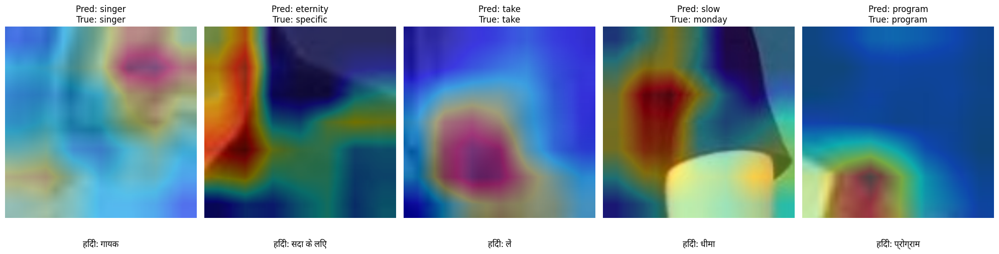

In [ ]:
# ─── Step 2 (Fixed): Grad-CAM Overlays + Pred/True + हिंदी caption ───

import os, random, cv2, numpy as np, torch, json
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50
from torch import nn

# 1) Paths, device, and font
CROP_ROOT   = "/content/drive/MyDrive/WLASL_Hand_Crops"
CKPT_PATH   = "/content/drive/MyDrive/WLASL_Hand_Crops_Results/best_resnet50_wlasl.pth"
MAP_PATH    = "/content/drive/MyDrive/gloss2hindi.json"
font_path   = "/usr/share/fonts/truetype/noto/NotoSansDevanagari-Regular.ttf"
hindi_font  = fm.FontProperties(fname=font_path, size=12)
device      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2) Load the gloss→Hindi map
with open(MAP_PATH, "r", encoding="utf-8") as f:
    gloss2hindi = json.load(f)

# 3) Prepare the dataset & loader
tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])
full_ds   = datasets.ImageFolder(CROP_ROOT, transform=tf)
_, val_ds = torch.utils.data.random_split(
    full_ds,
    [int(0.8*len(full_ds)), len(full_ds)-int(0.8*len(full_ds))],
    generator=torch.Generator().manual_seed(42)
)
loader = DataLoader(val_ds, batch_size=1, shuffle=True)

# 4) Load the trained ResNet-50
model = resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, len(full_ds.classes))
model.load_state_dict(torch.load(CKPT_PATH, map_location=device))
model = model.to(device).eval()

# 5) Register manual hooks for SmoothGradCAM++
activations, gradients = [], []

def forward_hook(module, inp, out):
    activations.append(out.detach())

def backward_hook(module, grad_in, grad_out):
    gradients.append(grad_out[0].detach())

layer = model.layer4[-1].conv3
layer.register_forward_hook(forward_hook)
layer.register_full_backward_hook(backward_hook)

# 6) Plot 5 random samples
plt.figure(figsize=(20, 6))
sample_idxs = random.sample(range(len(val_ds)), 5)

for i, idx in enumerate(sample_idxs):
    # a) Load sample
    img, label = val_ds[idx]
    inp = img.unsqueeze(0).to(device)
    activations.clear(); gradients.clear()

    # b) Forward + backward
    out = model(inp)
    pred = out.argmax(1).item()
    model.zero_grad(); out[0, pred].backward()

    # c) Build the CAM
    act     = activations[0][0]   # [C, H, W]
    grad    = gradients[0][0]     # [C, H, W]
    weights = grad.mean((1,2))    # [C]
    cam     = (weights[:,None,None] * act).sum(dim=0)
    cam     = torch.relu(cam)
    cam     = cam / (cam.max() + 1e-8)
    cam_np  = cam.cpu().numpy()
    cam_up  = cv2.resize(cam_np, (224,224), interpolation=cv2.INTER_LINEAR)
    cam_up  = np.clip(cam_up, 0, 1)

    # d) Prepare overlay_rgb
    img_np = img.permute(1,2,0).cpu().numpy()
    img_np = np.clip(img_np * [0.229,0.224,0.225] + [0.485,0.456,0.406], 0, 1)
    img_bgr = cv2.cvtColor((img_np*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    heatmap = (cam_up * 255).astype(np.uint8)
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img_bgr, 0.6, heatmap_color, 0.4, 0)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    # e) Titles and Hindi caption
    gloss      = full_ds.classes[pred]
    true_gloss = full_ds.classes[label]  # label is int
    hindi      = gloss2hindi.get(gloss, "[अनुवाद ग़ायब]")

    # f) Plot
    ax = plt.subplot(1,5,i+1)
    ax.imshow(overlay_rgb)
    ax.set_title(f"Pred: {gloss}\nTrue: {true_gloss}", fontsize=12)
    ax.text(0.5, -0.15,
            f"हिंदी: {hindi}",
            fontproperties=hindi_font,
            ha="center", transform=ax.transAxes)
    ax.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# ─── Inline Translation + Evaluation Metrics ───

from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from transformers import pipeline
import re, os, numpy as np

# 1) Gloss list & references
gloss_list = [
    "action", "alligator", "alone", "amputate", "angel",
    # … add the rest of your glosses here …
]
reference_dict = {
    "action":    "क्रिया",
    "alligator": "घड़ियाल",
    "alone":     "अकेला",
    "amputate":  "अंगविच्छेद",
    "angel":     "देवदूत",
    # … and so on …
}

# 2) Translator setup
translator = pipeline(
    "translation_en_to_hi",
    model="Helsinki-NLP/opus-mt-en-hi",
    device=0
)
smooth = SmoothingFunction().method1

# 3) Metrics
exact_match = 0
bleu_scores = []
total       = 0

print("📊 Translation Evaluation:\n" + "—"*80)

for gloss in gloss_list:
    total += 1
    gold = reference_dict.get(gloss, "")
    # 4) Inline translation
    out = translator(gloss, max_length=10, clean_up_tokenization_spaces=True)
    pred_full = out[0]["translation_text"].strip()

    # 5) Tokenize Devanagari
    ref_tokens  = re.findall(r"[\u0900-\u097F]+", gold)
    pred_tokens = re.findall(r"[\u0900-\u097F]+", pred_full)

    # 6) BLEU‐1 score
    bleu = sentence_bleu(
        [ref_tokens], pred_tokens,
        weights=(1,0,0,0),
        smoothing_function=smooth
    ) if pred_tokens else 0.0
    bleu_scores.append(bleu)

    # 7) Exact‐match on first token
    match = bool(pred_tokens and ref_tokens and pred_tokens[0] == ref_tokens[0])
    if match:
        exact_match += 1

    # 8) Print per‐gloss results
    print(f"Gloss: {gloss:12s} | Ref : {gold:12s} | Pred: {pred_full}")
    print(f"    Exact Match: {match}   | BLEU-1: {bleu:.2f}")
    print("—"*80)

# 9) Summary
print(f"\n✅ Exact Matches: {exact_match}/{total} → {exact_match/total:.2%}")
print(f"✅ Avg BLEU-1 Score: {np.mean(bleu_scores):.2f}")


Device set to use cuda:0


📊 Translation Evaluation:
————————————————————————————————————————————————————————————————————————————————
Gloss: action       | Ref : क्रिया       | Pred: क्रिया
    Exact Match: True   | BLEU-1: 1.00
————————————————————————————————————————————————————————————————————————————————
Gloss: alligator    | Ref : घड़ियाल      | Pred: mazimwe. kgm
    Exact Match: False   | BLEU-1: 0.00
————————————————————————————————————————————————————————————————————————————————
Gloss: alone        | Ref : अकेला        | Pred: अकेले
    Exact Match: False   | BLEU-1: 0.00
————————————————————————————————————————————————————————————————————————————————
Gloss: amputate     | Ref : अंगविच्छेद   | Pred: तैयार किया जा रहा है
    Exact Match: False   | BLEU-1: 0.00
————————————————————————————————————————————————————————————————————————————————
Gloss: angel        | Ref : देवदूत       | Pred: स्वर्गदूत
    Exact Match: False   | BLEU-1: 0.00
————————————————————————————————————————————————————————————————————

In [ ]:
# ─── Inline Translation + Evaluation Metrics ───

from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from transformers import pipeline
import re, os, numpy as np

# 1) Gloss list & references
gloss_list = [
    "action", "alligator", "alone", "amputate", "angel",
    # … add the rest of your glosses here …
]
reference_dict = {
    "action": "क्रिया",
    "alligator": "घड़ियाल",
    "alone": "अकेले",
    "amputate": "अंगविच्छेद",
    "angel": "देवदूत",
    "benefit": "लाभ",
    "bird": "पक्षी",
    "bracelet": "कंगन",
    "candy": "मिठाई",
    "chapter": "अध्याय",
    "cheese": "पनीर",
    "contact": "संपर्क",
    "crazy": "पागल",
    "cute": "प्यारा",
    "desert": "रेगिस्तान",
    "drama": "नाटक",
    "drive": "चालना",
    "fear": "डर",
    "festival": "त्यौहार",
    "her": "उसकी",
    "high school": "उच्च स्कूल",
    "highway": "राजमार्ग",
    "inform": "सूचित",
    "listen": "सुनना",
    "open": "खोलना",
    "opposite": "विपरीत",
    "paper": "कागज़",
    "pregnant": "गर्भवती",
    "relax": "आराम",
    "ring": "अंगूठी",
    "schedule": "समय सारिणी",
    "sculpture": "प्रतिमा",
    "shock": "आघात",
    "speech": "भाषण",
    "thank you": "धन्यवाद",
    "tomorrow": "कल"
}

# 2) Translator setup
translator = pipeline(
    "translation_en_to_hi",
    model="Helsinki-NLP/opus-mt-en-hi",
    device=0
)
smooth = SmoothingFunction().method1

# 3) Metrics
exact_match = 0
bleu_scores = []
total       = 0

print("📊 Translation Evaluation:\n" + "—"*80)

for gloss in gloss_list:
    total += 1
    gold = reference_dict.get(gloss, "")
    # 4) Inline translation
    out = translator(gloss, max_length=10, clean_up_tokenization_spaces=True)
    pred_full = out[0]["translation_text"].strip()

    # 5) Tokenize Devanagari
    ref_tokens  = re.findall(r"[\u0900-\u097F]+", gold)
    pred_tokens = re.findall(r"[\u0900-\u097F]+", pred_full)

    # 6) BLEU‐1 score
    bleu = sentence_bleu(
        [ref_tokens], pred_tokens,
        weights=(1,0,0,0),
        smoothing_function=smooth
    ) if pred_tokens else 0.0
    bleu_scores.append(bleu)

    # 7) Exact‐match on first token
    match = bool(pred_tokens and ref_tokens and pred_tokens[0] == ref_tokens[0])
    if match:
        exact_match += 1

    # 8) Print per‐gloss results
    print(f"Gloss: {gloss:12s} | Ref : {gold:12s} | Pred: {pred_full}")
    print(f"    Exact Match: {match}   | BLEU-1: {bleu:.2f}")
    print("—"*80)

# 9) Summary
print(f"\n✅ Exact Matches: {exact_match}/{total} → {exact_match/total:.2%}")
print(f"✅ Avg BLEU-1 Score: {np.mean(bleu_scores):.2f}")


Device set to use cuda:0


📊 Translation Evaluation:
————————————————————————————————————————————————————————————————————————————————
Gloss: action       | Ref : क्रिया       | Pred: क्रिया
    Exact Match: True   | BLEU-1: 1.00
————————————————————————————————————————————————————————————————————————————————
Gloss: alligator    | Ref : घड़ियाल      | Pred: mazimwe. kgm
    Exact Match: False   | BLEU-1: 0.00
————————————————————————————————————————————————————————————————————————————————
Gloss: alone        | Ref : अकेले        | Pred: अकेले
    Exact Match: True   | BLEU-1: 1.00
————————————————————————————————————————————————————————————————————————————————
Gloss: amputate     | Ref : अंगविच्छेद   | Pred: तैयार किया जा रहा है
    Exact Match: False   | BLEU-1: 0.00
————————————————————————————————————————————————————————————————————————————————
Gloss: angel        | Ref : देवदूत       | Pred: स्वर्गदूत
    Exact Match: False   | BLEU-1: 0.00
—————————————————————————————————————————————————————————————————————

In [ ]:
from pathlib import Path

base = Path("/content/drive/MyDrive/WLASL_Hand_Crops_Results")
for f in ["classification_report.csv", "confusion_matrix.csv", "confusion_matrix.png"]:
    print(f, "→", (base / f).exists())


classification_report.csv → True
confusion_matrix.csv → True
confusion_matrix.png → True


### Classification Report

|              |   precision |    recall |   f1-score |    support |
|:-------------|------------:|----------:|-----------:|-----------:|
| agree        |    1        | 0.0909091 |   0.166667 |  11        |
| always       |    0.555556 | 0.434783  |   0.487805 |  23        |
| angry        |    0.68     | 0.653846  |   0.666667 |  26        |
| apple        |    0.3125   | 0.357143  |   0.333333 |  28        |
| argue        |    0.631579 | 0.375     |   0.470588 |  32        |
| bank         |    0.333333 | 0.333333  |   0.333333 |   6        |
| bar          |    0.65     | 0.634146  |   0.641975 |  41        |
| bed          |    0.361702 | 0.53125   |   0.43038  |  32        |
| bike         |    0.75     | 0.375     |   0.5      |   8        |
| bottom       |    0.571429 | 0.285714  |   0.380952 |  14        |
| cemetery     |    0.684211 | 0.8125    |   0.742857 |  16        |
| cold         |    0.403509 | 0.741935  |   0.522727 |  31        |
| conce

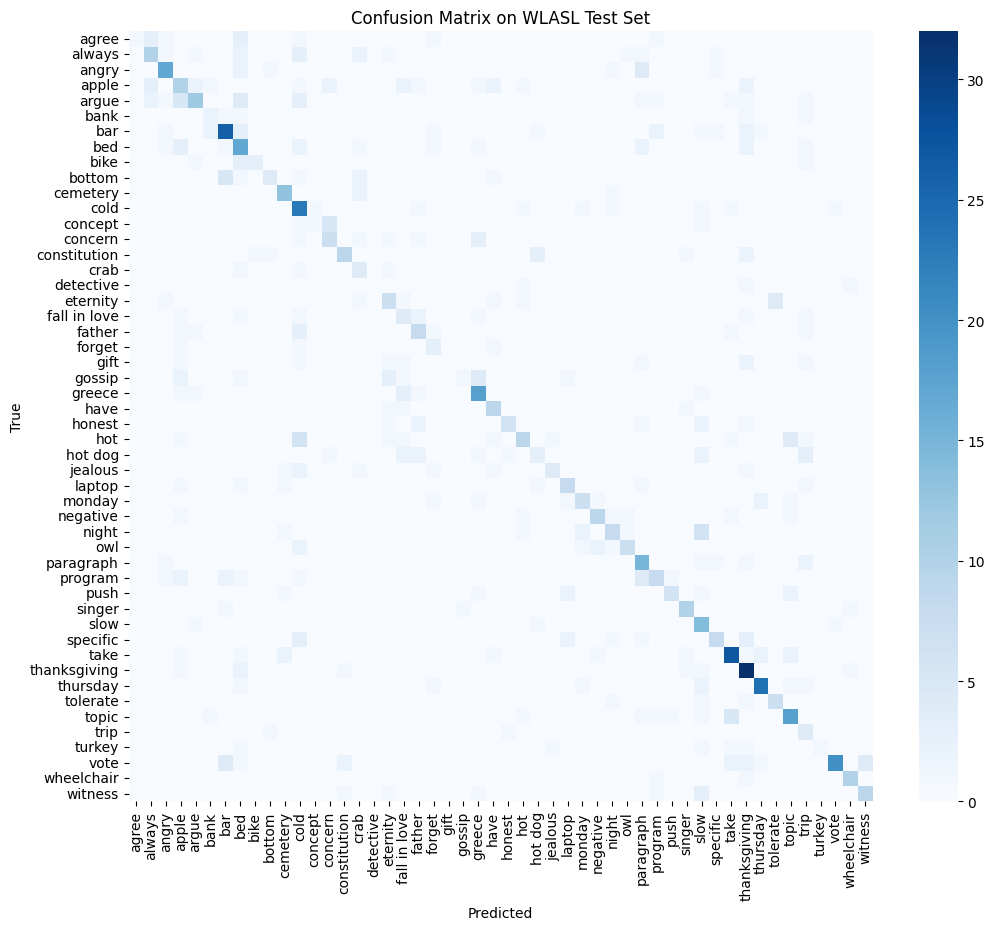

In [ ]:
# 1) Load & display your saved reports

import pandas as pd
from pathlib import Path

base = Path("/content/drive/MyDrive/WLASL_Hand_Crops_Results")
report_path = base / "classification_report.csv"
cm_path     = base / "confusion_matrix.csv"
cm_img_path = base / "confusion_matrix.png"

# 2) Classification Report
df_report = pd.read_csv(report_path, index_col=0)
print("### Classification Report\n")
print(df_report.to_markdown())

# 3) Confusion Matrix
df_cm = pd.read_csv(cm_path, index_col=0)
print("\n### Confusion Matrix\n")
print(df_cm.to_markdown())

# 4) Confusion Matrix Plot
from IPython.display import Image, display
print("\n### Confusion Matrix Plot\n")
display(Image(str(cm_img_path)))
